In [2]:
from PIL import Image
import matplotlib.pyplot as plt
import sys
import os
from pathlib import Path
from pycocotools.coco import COCO
import pandas as pd
import json
import random
import re
current_dir = Path.cwd()
parent_dir = os.path.abspath(os.path.dirname(current_dir))

sys.path.append(parent_dir)

from question_recuperation.question_utils import questions_recuperation
from image_recuperation.image_utils import calculate_similarity



2024-05-21 23:27:36.554336: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-05-21 23:27:37.554710: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
from transformers import ViltProcessor, ViltForQuestionAnswering

processor = ViltProcessor.from_pretrained("dandelin/vilt-b32-finetuned-vqa")
model_vqa = ViltForQuestionAnswering.from_pretrained("dandelin/vilt-b32-finetuned-vqa")


from transformers import AutoModelForCausalLM, AutoTokenizer

tokenizer = AutoTokenizer.from_pretrained('stabilityai/stablelm-zephyr-3b')
model_text = AutoModelForCausalLM.from_pretrained(
    'stabilityai/stablelm-zephyr-3b',
    device_map="auto"
)



/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torch/_utils.py:831: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  return self.fget.__get__(instance, owner)()
Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


In [4]:
dataDir='.'
dataType='val2014'
annFile='%s/annotations/captions_%s.json'%(dataDir,dataType)
subtypes=['results', 'totalEval', 'imgEval']
[resFile, evalImgsFile, evalFile]= ['%s/results/captions_%s.json'%(dataDir,subtype) for subtype in subtypes]

In [5]:
coco = COCO('../../COCO/dataset/instances_train2017.json')

loading annotations into memory...
Done (t=12.57s)
creating index...
index created!


In [6]:
num_images_rec = 50 
num_questions_rec = 20
dataset_name = 'dataset_2'
vocab=pd.read_pickle(f'../question_recuperation/embeddings/gte-small_question_embeddings_{dataset_name}.pickle')
df = pd.DataFrame(vocab)

# Template 1 temperature 0.8


In [6]:
content_template = """Write a caption of an image. These are questions that had been made about the image and their answers:
{pairs}
Limit the caption to the information available through the questions and answers.
Just provide the caption.
"""
temp = 0.8
n_q = 8

captioned_ids = []
numbers = []
with open("./results/captions_1.txt", 'r') as file:
    for line in file:
        if line.strip().isdigit():
            captioned_ids.append(int(line.strip()))
print(len(captioned_ids))
print(captioned_ids)

test_images_files = [f for f in os.listdir(f'./images') if not f.startswith('.')]
#existing_images_ids = [file_name[:-4] for file_name in existing_images_files]
image_captions = []
for file in test_images_files:
    if int(file[:-4]) not in captioned_ids:
        print('-'*10)
        print(file[:-4])
        path = f'./images/{file}'
        image = Image.open(path)
        df_scores = calculate_similarity(image, 'embeddings', 'cos', coco, dataset_name,'densenet')
        questions_rec = questions_recuperation(df,df_scores,num_images_rec,num_questions_rec)
        print('Questions recovered')

        #vqa
        questions = questions_rec[:n_q]
        answers = {}
        for q in questions:
            encoding = processor(image, q, return_tensors="pt")
            outputs = model_vqa(**encoding)
            logits = outputs.logits
            idx = logits.argmax(-1).item()
            answer = model_vqa.config.id2label[idx]
            answers[q] = answer
            print("Predicted answer:", answer)
        print('Answers predicted')

        #caption
        #format prompt
        questions_answers = ""
        for key in answers:
            questions_answers += "Question: " + key + " Answer: " + answers[key] + "\n" 
        content = content_template.format(pairs = questions_answers[:-1])
        prompt = [{'role': 'user', 'content': content}]
        inputs = tokenizer.apply_chat_template(
            prompt,
            add_generation_prompt=True,
            return_tensors='pt'
        )
        #predict caption
        tokens = model_text.generate(
            inputs.to(model_text.device),
            max_new_tokens=1024,
            temperature=temp,
            do_sample=True
        )

        conversation = tokenizer.decode(tokens[0], skip_special_tokens=False)
        print(conversation)
        print('Caption generated')
        print('-'*10)
        image_captions.append((file[:-4], conversation))
    
with open("./results/captions_1.txt", "a") as file:
    for cap in image_captions:
        file.write(f'{cap[0]}\n')
        file.write(f'{cap[1]}\n')

0
[]
----------
183181


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: sheep
Predicted answer: water
Predicted answer: beach
Predicted answer: sheep
Predicted answer: 6
Predicted answer: 2
Predicted answer: grass
Answers predicted


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Would you find the animals in the photo on a farm? Answer: no
Question: What animal are these? Answer: sheep
Question: What is next to the elephant? Answer: water
Question: Where is the elephant? Answer: beach
Question: What type of animals are these? Answer: sheep
Question: How many animals are shown? Answer: 6
Question: How many baby bears are pictured? Answer: 2
Question: What are the bears walking on? Answer: grass
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: These animals, consisting of sheep and baby bears, are not found on a farm, but rather at a beach with 6 of them and 2 baby bears walking on the grass nearby.<|endoftext|>
Caption generated
----------
----------
167952


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: pepper
Predicted answer: 0
Predicted answer: yes
Predicted answer: red
Predicted answer: pepper
Predicted answer: 0


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Is there ketchup on the food? Answer: no
Question: What is the green vegetable? Answer: pepper
Question: How many slice of eggs are on the plate? Answer: 0
Question: Is the end of the hot dog burnt? Answer: yes
Question: What flavor is the beverage? Answer: red
Question: What is the green vegetable on top of the burger? Answer: pepper
Question: How many eggs on the plate? Answer: 0
Question: Is this a hot dog? Answer: no
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: No ketchup, 0 slices of eggs, yes burnt end of hot dog, red beverage, 0 eggs on top of burger, and no, it's not a hot dog. 

Justification: The provided information from the questions and answers is used to create a caption that clearly and concisely communicates the d

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: yes
Predicted answer: red
Predicted answer: orange
Predicted answer: camera
Predicted answer: multi
Predicted answer: white
Predicted answer: tabby


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: red
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Is the cat awake? Answer: yes
Question: What color are the sheets? Answer: red
Question: What color is the? Answer: orange
Question: What is the cat looking at? Answer: camera
Question: What color is the blanket? Answer: multi
Question: What color is the towel? Answer: white
Question: What kind of cat is this? Answer: tabby
Question: What is the color of the sheet on the bed? Answer: red
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: The orange tabby cat is awake on a red blanket and looks at a white towel lying beside it, with the sheets being a blend of red and multi-colored patterns. 

Justification: The information I used is directly pulled from the questions and answers provided, ensuring that the caption accurately reflects 

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: yes
Predicted answer: moving
Predicted answer: snow
Predicted answer: 1
Predicted answer: yes
Predicted answer: skiing
Predicted answer: snow


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: 1
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Do the children ski with poles? Answer: yes
Question: Is this person moving or standing still? Answer: moving
Question: What is on the ground? Answer: snow
Question: How many people are in this scene? Answer: 1
Question: Is this person wearing a helmet? Answer: yes
Question: What sport is shown? Answer: skiing
Question: What is covering the ground? Answer: snow
Question: How many girls in the picture? Answer: 1
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: A single girl, wearing a helmet, is seen skiing with ski poles on a snow-covered ground, moving steadily.

Questions and answers:
- Do the children ski with poles?
  Answer: yes
- Is this person moving or standing still?
  Answer: moving
- What is on the ground?
  Answer: snow
- 

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: stop
Predicted answer: yes
Predicted answer: 0
Predicted answer: 2
Predicted answer: no
Predicted answer: no
Predicted answer: stop


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: What are the two street names? Answer: stop
Question: Is it a sunny day? Answer: yes
Question: How many cars are shown? Answer: 0
Question: How many signs are showing? Answer: 2
Question: Is it cloudy day? Answer: no
Question: Are there any cars in the picture? Answer: no
Question: What street is this sign for? Answer: stop
Question: Are there clouds in the sky in this photo? Answer: no
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: The image depicts a scene with a sign for "stop" and two street names mentioned; it is a sunny day with no cars shown and only two signs present. The sky is not cloudy.<|endoftext|>
Caption generated
----------
----------
541086


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: no
Predicted answer: no
Predicted answer: bronze
Predicted answer: yes
Predicted answer: brown
Predicted answer: bronze


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Is there water in the vase? Answer: no
Question: Are the flowers growing? Answer: no
Question: Is the cake round? Answer: no
Question: What color is the vase? Answer: bronze
Question: Are the flowers white? Answer: yes
Question: What color is the cake? Answer: brown
Question: What color is the vase on the right? Answer: bronze
Question: Do the flowers look fresh? Answer: no
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: The image features a vase with a bronze base, but it lacks water, and the flowers do not appear to be growing. A brown cake is placed on the left side, while the flowers on the right are white. The vase on the right is also bronze. The freshness of the flowers is in doubt.<|endoftext|>
Caption generated
----------
-

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: red
Predicted answer: 4
Predicted answer: no
Predicted answer: 1
Predicted answer: no
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: hair
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Is the rider about to race? Answer: no
Question: What color are the shorts of the person closest to the photographer? Answer: red
Question: How many people are there? Answer: 4
Question: Is this in the desert? Answer: no
Question: How many surfboards do you see? Answer: 1
Question: Are all these people flying kites? Answer: no
Question: Is this a ski slope? Answer: no
Question: What is on the woman's head? Answer: hair
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: A group of people (4) near a beach are seen, with only one surfboard and no indication of kites being flown. The woman nearest the photographer has hair on her head. None of them appear to be racing or wearing red shorts. The scene takes place on land, and there is no 

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: 0
Predicted answer: food
Predicted answer: black
Predicted answer: sleeping
Predicted answer: panda
Predicted answer: panda
Predicted answer: black and white


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: happy
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: How many cows are facing the camera? Answer: 0
Question: What is the horse looking at? Answer: food
Question: What color is the spot on the back of the animal? Answer: black
Question: What is the horse doing? Answer: sleeping
Question: What animal is this? Answer: panda
Question: What kind of animal is in the picture? Answer: panda
Question: What color is the horse? Answer: black and white
Question: Is this dog happy or yawning? Answer: happy
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: The image features a black and white horse sleeping and a panda facing away from the camera with no cows in sight. The dog in the picture appears to be happy and yawning.<|endoftext|>
Caption generated
----------
----------
63047


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: red
Predicted answer: 5
Predicted answer: man
Predicted answer: sandwich
Predicted answer: metal
Predicted answer: toothpaste


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: white
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Is that her real hair? Answer: no
Question: What color is the woman shirt? Answer: red
Question: How many people are in the photo? Answer: 5
Question: What type of person is holding the umbrella? Answer: man
Question: What is the woman eating? Answer: sandwich
Question: What is the clock tower made of? Answer: metal
Question: What is on kids toothbrush? Answer: toothpaste
Question: What race is she? Answer: white
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: A red shirt worn by a white woman with a metal clock tower in the background, alongside a man holding an umbrella, and a kid's toothbrush nearby. Five people are present in the photo. The woman is eating a sandwich.<|endoftext|>
Caption generated
----------
----------
25605

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: bench
Predicted answer: purple
Predicted answer: nothing
Predicted answer: yes
Predicted answer: gloves
Predicted answer: child
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: bench
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Where is the man seated? Answer: bench
Question: What color is the man's vest? Answer: purple
Question: What does the man have on his face? Answer: nothing
Question: Is someone on the bench? Answer: yes
Question: What does this woman have on her hands? Answer: gloves
Question: What type of person is holding the umbrella? Answer: child
Question: Is it raining? Answer: no
Question: What is the man sitting on? Answer: bench
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
A man is seated on a bench, holding an umbrella and wearing a purple vest. A child is holding the umbrella, and no one is mentioning raining. The woman has gloves on her hands, and the man has nothing on his face. Yes, someone is on the bench.<|endoftext|>
Caption generated


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: on motorcycle
Predicted answer: yes
Predicted answer: 2000
Predicted answer: yes
Predicted answer: 0
Predicted answer: 6


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: yes
Predicted answer: no
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Where is the rider with the red shirt? Answer: on motorcycle
Question: Is the man the owner of the bike? Answer: yes
Question: What year was this brand of bike made? Answer: 2000
Question: Are all the motorcycle riders wearing helmets? Answer: yes
Question: How many cars are there? Answer: 0
Question: How many motorcycles are there? Answer: 6
Question: Do all the motorcycles have one rider? Answer: yes
Question: Are there any cars in the photo? Answer: no
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
The rider with the red shirt is on a motorcycle, and the man is indeed the owner of the bike. The brand of bike was made in 2000, and all the motorcycle riders are wearing helmets. There are 6 motorcycles and 0 cars in th

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: frisbee
Predicted answer: no
Predicted answer: white
Predicted answer: yes
Predicted answer: frisbee
Predicted answer: no
Predicted answer: frisbee


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: yes
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: What sport are these people watching? Answer: frisbee
Question: Did the batter hit the ball? Answer: no
Question: What is the brightest color on the boy's shirt? Answer: white
Question: Is a ball being thrown? Answer: yes
Question: What is this sport? Answer: frisbee
Question: Has the batter taken a swing yet? Answer: no
Question: What is the man holding in his hand? Answer: frisbee
Question: Is there a ball in this photo? Answer: yes
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: People watching a frisbee game, with a white-shirted boy and a man holding a frisbee in the foreground. No batter has hit the ball yet. No swings have been taken. A ball is present in the photo.<|endoftext|>
Caption generated
----------
----------
352549

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: black
Predicted answer: yes
Predicted answer: camera
Predicted answer: black
Predicted answer: brown
Predicted answer: black


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: black
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Are there two cats? Answer: no
Question: What type of cat is this? Answer: black
Question: Is the cat awake? Answer: yes
Question: What is the cat looking at? Answer: camera
Question: What kind of dog is this? Answer: black
Question: What is the color of the dog's collar? Answer: brown
Question: What kind of cat is this? Answer: black
Question: What is the color of the cat? Answer: black
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: Two black cats and a black dog with a brown collar are sitting together, with the dog looking at the camera while the cats are awake.<|endoftext|>
Caption generated
----------
----------
322175


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: yes
Predicted answer: brown
Predicted answer: apple
Predicted answer: yes
Predicted answer: leaves
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: yes
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Is there fish on the plate? Answer: no
Question: Does this look like a healthy meal? Answer: yes
Question: What color is the plate? Answer: brown
Question: What kind of food is this? Answer: apple
Question: Is this a healthy meal? Answer: yes
Question: What are the purple things? Answer: leaves
Question: Are there any vegetables on the plate? Answer: no
Question: Does this look healthy? Answer: yes
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: A brown plate with a healthy meal consisting of apples, leaves, and possibly some brown rice or whole grain bread. 

Answer breakdown:
- No fish on the plate
- Yes, it looks like a healthy meal
- The plate is brown
- The food is likely apple, leaves (possibly from the apple tree), and brown

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: yes
Predicted answer: yes
Predicted answer: queen
Predicted answer: white
Predicted answer: 1
Predicted answer: yes
Predicted answer: white


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: yes
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Is this a hotel room? Answer: yes
Question: Are the lights on? Answer: yes
Question: What size is the bed? Answer: queen
Question: What color is the walls? Answer: white
Question: How many chairs are present? Answer: 1
Question: Is this during the day time? Answer: yes
Question: What colors are the pillow? Answer: white
Question: Is the lamp turned on? Answer: yes
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: This is a hotel room with a queen-sized bed, white walls, a white pillow, and a lamp turned on, during the day time with the lights on.<|endoftext|>
Caption generated
----------
----------
25708


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: broccoli
Predicted answer: yes
Predicted answer: yes
Predicted answer: 1
Predicted answer: yes
Predicted answer: no
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: pasta
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: What vegetables are on the plate? Answer: broccoli
Question: Is the meal healthy? Answer: yes
Question: Is this pasta? Answer: yes
Question: How many different kinds of lettuce on the plate? Answer: 1
Question: Is there any greenery on the plate? Answer: yes
Question: Does the food look tasty? Answer: no
Question: Does this food look edible to everyone? Answer: no
Question: What kind of dish is this? Answer: pasta
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: This plate features steamed broccoli on a bed of lettuce, with a single leaf of butter lettuce. The meal is a healthy combination of vegetables and pasta, although it may not be visually appealing to everyone.<|endoftext|>
Caption generated
----------
----------
143275


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: yes
Predicted answer: skiing
Predicted answer: red
Predicted answer: no
Predicted answer: no
Predicted answer: yes
Predicted answer: red


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: yes
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Is anyone snowboarding? Answer: yes
Question: What is the person doing? Answer: skiing
Question: What color is the person coat? Answer: red
Question: Is it cloudy? Answer: no
Question: Are the skiers trying to slow down? Answer: no
Question: Is this man in motion? Answer: yes
Question: What color is he wearing? Answer: red
Question: Is it sunny? Answer: yes
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: A group of skiers, clad in red coats, are enjoying a sunny day on the slopes, with one man in motion and the others trying to maintain their speed.

Questions and answers:
- Is anyone snowboarding? Answer: no
- What is the person doing? Answer: skiing
- What color is the person's coat? Answer: red
- Is it cloudy? Answer: no
- Are t

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: down
Predicted answer: yes
Predicted answer: 0
Predicted answer: yes
Predicted answer: no
Predicted answer: no
Predicted answer: zoo


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: yes
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: In which direction is the elephant's trunk pointing? Answer: down
Question: Are the animals outside? Answer: yes
Question: How many people are on the elephant? Answer: 0
Question: Are they outside? Answer: yes
Question: Are these elephants in the wild? Answer: no
Question: Are the elephants touching food with their trunks? Answer: no
Question: Where are the animals at? Answer: zoo
Question: Can the elephants be touched? Answer: yes
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: The elephants are at the zoo, with a trunk pointing down and multiple people present, as they are not in the wild and can be touched.<|endoftext|>
Caption generated
----------
----------
503808


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: yes
Predicted answer: skiing
Predicted answer: white
Predicted answer: 1
Predicted answer: snow
Predicted answer: winter
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: yes
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Is anyone snowboarding? Answer: yes
Question: What is the person doing? Answer: skiing
Question: What color is the person coat? Answer: white
Question: How many men are there present? Answer: 1
Question: What is covering the ground? Answer: snow
Question: What season of the year is it? Answer: winter
Question: Are the skiers trying to slow down? Answer: no
Question: Is this man in motion? Answer: yes
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
A lone man in a white coat is skiing in the middle of a snowy winter landscape, with the vibrant hue of his coat contrasting against the pure white blanket of snow covering the ground. Despite the harsh conditions, the man appears to be in motion, his skis propelling him forward as he enthusiastic

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: horses
Predicted answer: hat
Predicted answer: polo
Predicted answer: 2
Predicted answer: hat
Predicted answer: yes
Predicted answer: horse


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: riding
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: What kind of animals are in there? Answer: horses
Question: What is on the elephant's head? Answer: hat
Question: What sport is being played? Answer: polo
Question: How many women are in the image? Answer: 2
Question: What is the pink thing on the women's head? Answer: hat
Question: Are they working? Answer: yes
Question: What is this animal? Answer: horse
Question: What style of pants is the man in the hat wearing? Answer: riding
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: Two women on horseback, an elephant in the background wearing a hat, and a man in a hat playing polo. One of the women has a pink hat on her head. They appear to be working and enjoying the outdoors. 

Justification: In the given questions and answers, we

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: yes
Predicted answer: gloves
Predicted answer: no
Predicted answer: 1
Predicted answer: no
Predicted answer: tennis racket
Predicted answer: yes


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: 1
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Is there a tennis ball in the foreground? Answer: yes
Question: What is the man wearing on his hands? Answer: gloves
Question: Are both the batter's feet on the ground? Answer: no
Question: How many people are playing? Answer: 1
Question: Is this a tennis tournament in Australia? Answer: no
Question: What equipment are the men holding? Answer: tennis racket
Question: Are both feet on the ground? Answer: yes
Question: How many men are there? Answer: 1
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: The image shows a man holding a tennis racket and wearing gloves, with both feet on the ground and only one person playing. This is likely a casual setting, possibly at a park or recreational court, and not a professional tennis tournament 

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: yes
Predicted answer: yes
Predicted answer: first
Predicted answer: day
Predicted answer: no
Predicted answer: no
Predicted answer: train


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: day
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Is this a passenger  train? Answer: yes
Question: Is it daytime? Answer: yes
Question: What train car is red? Answer: first
Question: Is it day or night in the picture? Answer: day
Question: Is the train green? Answer: no
Question: Is it nighttime? Answer: no
Question: What are the people waiting to do? Answer: train
Question: Is it day or night? Answer: day
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Passenger train during daytime in a red train car, with people waiting to board.<|endoftext|>
Caption generated
----------
----------
384553


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: elephant
Predicted answer: 1
Predicted answer: riding elephant
Predicted answer: happy
Predicted answer: saddle
Predicted answer: swimming
Predicted answer: elephant


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: 1
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: What type of animal might you see in the environment in the middle of the photo? Answer: elephant
Question: How many people are on the elephant? Answer: 1
Question: What is the person doing? Answer: riding elephant
Question: How does the Giraffe feel about the human? Answer: happy
Question: What are the elephants wearing? Answer: saddle
Question: What are the bears doing? Answer: swimming
Question: What type of animal is in the back? Answer: elephant
Question: How many elephants are in this photo? Answer: 1
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: In the middle of the photo, a solitary elephant can be seen riding a single person, while nearby giraffes swim and elephants in the background are donning saddles. 

Answer: 
1. Type

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: beach
Predicted answer: kite flying
Predicted answer: green
Predicted answer: kite flying
Predicted answer: green
Predicted answer: kite flying
Predicted answer: backpack


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: kite flying
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Where is the bike? Answer: beach
Question: What kind of event is happening in the background? Answer: kite flying
Question: What color is the bike? Answer: green
Question: What kind of event is this? Answer: kite flying
Question: What color is the bicycle? Answer: green
Question: What type of event is taking place in the picture? Answer: kite flying
Question: What is on the back of the bike? Answer: backpack
Question: What event is taking place? Answer: kite flying
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: A green bicycle is parked at the beach during a kite flying event, with a backpack on the back. 

Questions and answers:
1. Where is the bike? Answer: beach
2. What kind of event is happening in the background? Answ

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: park
Predicted answer: clear
Predicted answer: skateboarding
Predicted answer: no
Predicted answer: no
Predicted answer: afternoon
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Where is the boy skateboarding? Answer: park
Question: Is the sky clear or cloudy in the photo? Answer: clear
Question: What activity is the men on the plane part of? Answer: skateboarding
Question: Is it raining? Answer: no
Question: Is he wearing a helmet? Answer: no
Question: What time of day is it? Answer: afternoon
Question: Is the plane being boarded? Answer: no
Question: Is the ground completely dry? Answer: no
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: The boy is skateboarding at a park on a clear afternoon, with men on a plane not boarding and the ground remaining dry. (Questions: Where is the boy skateboarding?; Is the sky clear or cloudy in the photo?; What activity is the men on the plane part of?; Is it raining?; I

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: camera
Predicted answer: sleeping
Predicted answer: cat
Predicted answer: yes
Predicted answer: no
Predicted answer: sleeping
Predicted answer: green


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: nothing
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: What is the dog looking at? Answer: camera
Question: What is the person doing? Answer: sleeping
Question: What breed of dog is pictured? Answer: cat
Question: Is the person going on a trip? Answer: yes
Question: Is this cat sitting the way cats normally sit? Answer: no
Question: What is this child doing? Answer: sleeping
Question: What color are the cats eyes? Answer: green
Question: What is the person riding? Answer: nothing
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: A dog is looking at a camera, a person is sleeping, a cat is sitting abnormally, and a child is also sleeping. They are all on a trip. The cat's eyes are green. No one is riding anything. 

Justification: The answers provided for each question are direct and 

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: orange
Predicted answer: bricks
Predicted answer: orange
Predicted answer: yes
Predicted answer: no
Predicted answer: nothing
Predicted answer: red


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: fire hydrant
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: What color is the hydrant? Answer: orange
Question: What is under the vase? Answer: bricks
Question: What color is the photo? Answer: orange
Question: Is there graffiti on the hydrant? Answer: yes
Question: What type of flowers are by the hydrant? Answer: no
Question: What are in these vase? Answer: nothing
Question: What color is the item? Answer: red
Question: Where is the graffiti? Answer: fire hydrant
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: An orange fire hydrant with graffiti and a red vase sitting on a brick wall. Photo appears to be taken from an angle that shows only the hydrant and vase, with no flowers nearby. The vase is empty.

Inquiries:
1. What color is the hydrant? Answer: Orange
2. What is under the

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: baseball
Predicted answer: yes
Predicted answer: red
Predicted answer: 2
Predicted answer: yes
Predicted answer: yes
Predicted answer: left


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: 2
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Which game is being played? Answer: baseball
Question: Is there an audience? Answer: yes
Question: What color jersey is the batter wearing? Answer: red
Question: How many people are playing? Answer: 2
Question: Did the batter swing at the ball? Answer: yes
Question: Are any of the spectators sitting down? Answer: yes
Question: What side is the battery on? Answer: left
Question: How many players are you able to see on the field? Answer: 2
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: A red-jerseyed batter swings at a baseball being thrown by a left-side battery in a game with 2 players visible on the field and an audience sitting and standing around them. 

Answer Elimination:
1) Question: Which game is being played? Answer: basebal

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: 3
Predicted answer: cake
Predicted answer: yes
Predicted answer: cake
Predicted answer: kitchen
Predicted answer: white
Predicted answer: yes


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: 1
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: How many people are wearing glasses? Answer: 3
Question: What are these people working on? Answer: cake
Question: Do the people look happy? Answer: yes
Question: What are they cooking? Answer: cake
Question: What type of room is the woman in? Answer: kitchen
Question: What color is the shirt of the men? Answer: white
Question: Is this a birthday celebration? Answer: yes
Question: How many cakes are in this photo? Answer: 1
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: Three people wearing glasses are celebrating a birthday in a kitchen, with one man in a white shirt, and they all look happy while preparing a single cake. 

Answer: 3 people wearing glasses, all working on a cake, yes, a birthday celebration, one man in a white shirt

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: black
Predicted answer: girl
Predicted answer: no
Predicted answer: yes
Predicted answer: yes
Predicted answer: blue
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: yes
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: What color are his shorts? Answer: black
Question: Is this a girl or boy? Answer: girl
Question: Is the woman wearing a thong bikini? Answer: no
Question: Is the man surfing? Answer: yes
Question: Is this a female? Answer: yes
Question: What color is her bikini? Answer: blue
Question: Is he sitting down? Answer: no
Question: Is this person's gender obvious? Answer: yes
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: A girl is surfing in a blue thong bikini, and her shorts are black. It is apparent that this is a female surfer.<|endoftext|>
Caption generated
----------
----------
335774


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: fork
Predicted answer: no
Predicted answer: american
Predicted answer: fork
Predicted answer: french fries
Predicted answer: lunch


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Is there ketchup? Answer: no
Question: What utensils can be seen? Answer: fork
Question: Are the fries plain? Answer: no
Question: What kind of food is shown? Answer: american
Question: What is the utensil on the right? Answer: fork
Question: What kind of potato are the fries? Answer: french fries
Question: Of what meal is this kind of food typical? Answer: lunch
Question: Are utensils being used? Answer: no
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: This image depicts American cuisine, specifically lunchtime, with a side of French fries and a fork as the utensil. The fries are not plain and there is no ketchup present. It is typically lunchtime when this kind of food is consumed. Although utensils are present, they are not bei

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: sedan
Predicted answer: no
Predicted answer: yes
Predicted answer: no
Predicted answer: yes
Predicted answer: hood
Predicted answer: orange and black


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: What type of car is the car closest to the camera? Answer: sedan
Question: Is the cat playing? Answer: no
Question: Are the animals alive? Answer: yes
Question: Is the giraffe in captivity? Answer: no
Question: Does this look like an American car? Answer: yes
Question: What part of the car is the cat sitting on? Answer: hood
Question: What color is this animal? Answer: orange and black
Question: Are the giraffes wild? Answer: no
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: The car closest to the camera is a sedan, with a cat sitting on the hood, and a group of animals including a giraffe, lion, and tiger; all the animals are alive and not in captivity, with the giraffe being wild, while the car resembles an American vehicle.<|end

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: green
Predicted answer: yes
Predicted answer: no
Predicted answer: yes
Predicted answer: no
Predicted answer: yes
Predicted answer: seagull


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: What color is the surfboard? Answer: green
Question: Is there a bird in the picture? Answer: yes
Question: Is it a cloudy day? Answer: no
Question: Do you see clouds in the sky? Answer: yes
Question: Is the water calm? Answer: no
Question: Is the wave cresting? Answer: yes
Question: What type of bird? Answer: seagull
Question: Is it raining? Answer: no
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: A green surfboard against a cloudless sky with a seagull near the water, and no calm water or rain.<|endoftext|>
Caption generated
----------
----------
552849


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: 4
Predicted answer: no
Predicted answer: no
Predicted answer: yes
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: market
Predicted answer: no
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Are the lights on in the train? Answer: no
Question: How many people are shown? Answer: 4
Question: Is the chef in the picture? Answer: no
Question: Is the train arriving? Answer: no
Question: Is there a person in the picture? Answer: yes
Question: Is this a restaurant kitchen? Answer: no
Question: What kind of station is this? Answer: market
Question: Was this picture taken outside? Answer: no
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: The image shows a market train with four people inside; it is not a restaurant kitchen, and the chef is not present. The train is not arriving, and the lights are off. The picture was taken indoors, with only one person identified.<|endoftext|>
Caption generated
--------

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: ping pong
Predicted answer: black
Predicted answer: 12
Predicted answer: green
Predicted answer: floor
Predicted answer: ping pong
Predicted answer: black


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: 0
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: What is she doing? Answer: ping pong
Question: What color are the girl's shorts? Answer: black
Question: How many people are shown? Answer: 12
Question: What color is the part of the court he is standing on? Answer: green
Question: What is this person standing on? Answer: floor
Question: What sport are they playing? Answer: ping pong
Question: What are the color of his shorts? Answer: black
Question: How many kids in the picture? Answer: 0
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: A group of 12 people, playing ping pong on a green-colored court, with a black-colored ping pong paddle and black shorts for both the female player and the person standing nearby. The floor is shown as the surface they're playing on. One additional pe

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: skiing
Predicted answer: 4
Predicted answer: yes
Predicted answer: no
Predicted answer: 0
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: standing still
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Is there snow falling? Answer: no
Question: What is the person doing? Answer: skiing
Question: How many men are there present? Answer: 4
Question: Is anyone snowboarding? Answer: yes
Question: Is this man in motion? Answer: no
Question: How many people are skateboarding in this picture? Answer: 0
Question: Are the skiers trying to slow down? Answer: no
Question: Is this person moving or standing still? Answer: standing still
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: The image shows a group of skiers and snowboarders enjoying the slopes with four men present; however, it appears that no one is skiing or snowboarding in this particular moment as the skiers are not trying to slow down and one person is standing still.

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: white
Predicted answer: no
Predicted answer: no
Predicted answer: new york
Predicted answer: red
Predicted answer: school
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: What color is the street sign? Answer: white
Question: Is it raining? Answer: no
Question: Is anyone crossing the street? Answer: no
Question: What city is this? Answer: new york
Question: What color is this fire hydrant? Answer: red
Question: What type of bus is this? Answer: school
Question: Is it cloudy? Answer: no
Question: Can you cross the street? Answer: no
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: No rain, no people, white street sign in New York, red fire hydrant, school bus, cloudy (not mentioned in the answers).<|endoftext|>
Caption generated
----------
----------
342770


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: yes
Predicted answer: no
Predicted answer: yes
Predicted answer: unknown
Predicted answer: no
Predicted answer: no
Predicted answer: blue


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: nothing
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Is the color of the car very common for vehicles? Answer: yes
Question: Is the truck parked on the grass? Answer: no
Question: Is it sunny? Answer: yes
Question: What words are on the car's bumper plate? Answer: unknown
Question: Are there people riding these motorcycles? Answer: no
Question: Is the cat playing? Answer: no
Question: What color is the car? Answer: blue
Question: What are the trucks pulling? Answer: nothing
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: A common blue car is parked on a grassy area with a sun in the background, and multiple trucks can be seen passing by without pulling anything, with unknown words on the car's bumper plate and no people riding motorcycles, and a cat is not seen playing in the sce

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: pink
Predicted answer: outside
Predicted answer: umbrella
Predicted answer: yes
Predicted answer: green and white
Predicted answer: 1
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: umbrella
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: What color is the umbrella? Answer: pink
Question: What type of room is this? Answer: outside
Question: What is the person holding? Answer: umbrella
Question: Is it raining? Answer: yes
Question: What two colors does this bus have? Answer: green and white
Question: How many people are holding umbrellas? Answer: 1
Question: Is this room on the top floor of the building? Answer: no
Question: What is the man holding? Answer: umbrella
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: A pink umbrella is held by a person outside during a rainy day, with a green and white bus in the background. 
Answer Key: 
- Pink umbrella 
- Outside 
- Rainy day 
- Green and white bus 
- 1 person holding umbrella 
- Not on the top floor<|endoftext|>


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: phone
Predicted answer: no
Predicted answer: no
Predicted answer: lap
Predicted answer: left
Predicted answer: silver
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no cat
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: What is the man holding? Answer: phone
Question: Is this a brand new phone? Answer: no
Question: Is the phone broken? Answer: no
Question: What is the cat sitting on? Answer: lap
Question: Which hand is the person holding the phone in? Answer: left
Question: What color is the phone? Answer: silver
Question: Is the phone light on? Answer: no
Question: What color is the cat? Answer: no cat
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: The man is holding a silver phone, which is not a brand new device and doesn't seem to be broken. The cat is sitting on the person's lap, and neither the phone nor the cat has a specific color mentioned. The person is holding the phone with their left hand, and unfortunately, it's not lit on.<|endo

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: nothing
Predicted answer: white
Predicted answer: blue
Predicted answer: birthday
Predicted answer: star
Predicted answer: 0


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: daisy
Predicted answer: gray
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: What are in these vase? Answer: nothing
Question: What color is the hydrant? Answer: white
Question: What color are these items painted? Answer: blue
Question: What is the theme of the cake? Answer: birthday
Question: What is on top of the clock? Answer: star
Question: How many vases are there? Answer: 0
Question: What type of flowers are by the hydrant? Answer: daisy
Question: What color is the tablecloth? Answer: gray
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: Empty vases by a white hydrant, with a blue painted tablecloth, displaying a daisy by the side. The birthday theme is evident on a clock featuring a star on top. There are no vases present.<|endoftext|>
Caption generated
----------
----------
3

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: peppers
Predicted answer: no
Predicted answer: yes
Predicted answer: end
Predicted answer: thin
Predicted answer: 1
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: on pizza
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: What is the green stuff on this pizza? Answer: peppers
Question: Is there a fork on the table? Answer: no
Question: Does the crust look burnt? Answer: yes
Question: What part of the fork can you see? Answer: end
Question: Is it thick or thin crust? Answer: thin
Question: How many forks are on the table? Answer: 1
Question: Does this pizza have a deep dish crust? Answer: no
Question: Where is the fork? Answer: on pizza
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: A green pepper covers the pizza, which has a thin crust and a single fork on the table. The fork's end is visible. There's no burnt part, and it's not on the pizza; it's just sitting there. The pizza doesn't have a deep dish crust.<|endoftext|>
Caption generated
---

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: yes
Predicted answer: no
Predicted answer: train
Predicted answer: white
Predicted answer: yes
Predicted answer: tracks
Predicted answer: 4


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: day
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Are all the trains heading in the same direction? Answer: yes
Question: Is it sunny? Answer: no
Question: What vehicle is there? Answer: train
Question: What color is the trains face? Answer: white
Question: Is it daytime? Answer: yes
Question: What is the vehicle driving on? Answer: tracks
Question: How many tracks can be seen? Answer: 4
Question: Is it day or night? Answer: day
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
All trains are heading in the same direction, with a white train running on 4 tracks during daytime.<|endoftext|>
Caption generated
----------
----------
144251


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: city
Predicted answer: yes
Predicted answer: england
Predicted answer: 41
Predicted answer: no
Predicted answer: no
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: What type of bus is this? Answer: city
Question: Is it cloudy? Answer: yes
Question: What country was this picture taken in? Answer: england
Question: What is the letter and number on the bus sign? Answer: 41
Question: Is it sunny? Answer: no
Question: Was this photo taken in the United States? Answer: no
Question: Is the bus yellow? Answer: no
Question: Is it a sunny day? Answer: no
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: This bus is a city bus in England, with the sign displaying the letter and number 41, and it is not a sunny day. The image was not taken in the United States and it is cloudy.<|endoftext|>
Caption generated
----------
----------
264121


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: 1
Predicted answer: no
Predicted answer: no
Predicted answer: yes
Predicted answer: 2000
Predicted answer: no
Predicted answer: 0


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: 1
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: How many bikes are on the road? Answer: 1
Question: Is the bike moving? Answer: no
Question: Is the rider about to race? Answer: no
Question: Is the man the owner of the bike? Answer: yes
Question: What year was this brand of bike made? Answer: 2000
Question: Are all the motorcycle riders wearing helmets? Answer: no
Question: How many cars are there? Answer: 0
Question: How many motorcycles are there? Answer: 1
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
A man owns one bike, which was made in 2000 and is not moving. The rider is not about to race, and there are no other motorcycle riders or cars in the scene. The only helmet worn is the rider's, and there are no other helmets seen. The only question left unanswered is the one about the cu

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: skate park
Predicted answer: skateboarding
Predicted answer: no
Predicted answer: skateboarding
Predicted answer: foot
Predicted answer: skateboarding


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: black
Predicted answer: skateboarding
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Where is the boy skateboarding? Answer: skate park
Question: What sport is this? Answer: skateboarding
Question: Is he wearing a helmet? Answer: no
Question: What sport is depicted? Answer: skateboarding
Question: What part of the skateboarder is touching the skateboard? Answer: foot
Question: What sport is the man participating in? Answer: skateboarding
Question: What color is the skateboarders shirt? Answer: black
Question: What sports activity is this? Answer: skateboarding
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: A boy is skateboarding at a skate park, wearing a black shirt, and not wearing a helmet as he participates in the sport of skateboarding.<|endoftext|>
Caption generated
--------

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: pink
Predicted answer: clear
Predicted answer: cargo
Predicted answer: no
Predicted answer: yes
Predicted answer: yes
Predicted answer: passenger


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: What airline is this? Answer: pink
Question: How are the skies? Answer: clear
Question: Will the plane be delivering cargo or passengers? Answer: cargo
Question: Is it cloudy outside? Answer: no
Question: Is this a large airplane? Answer: yes
Question: Is the day clear? Answer: yes
Question: What type of airplane is this? Answer: passenger
Question: Is it a cloudy day? Answer: no
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: This airplane is a large passenger plane flying clear skies with no clouds outside. The airline is pink and the plane is currently delivering cargo. The day is clear and the type of airplane is a passenger aircraft.<|endoftext|>
Caption generated
----------
----------
75319


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: clear
Predicted answer: carrots
Predicted answer: carrot
Predicted answer: vegetables
Predicted answer: square
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: blue
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Are all three pieces of food classified as fruit? Answer: no
Question: What color is the plate? Answer: clear
Question: Which is not a fruit? Answer: carrots
Question: What is the purple thing on the plate? Answer: carrot
Question: What is in the picture? Answer: vegetables
Question: What shape is the plate? Answer: square
Question: Is there fish on the plate? Answer: no
Question: What is the color of the plate? Answer: blue
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: A clear square plate with vegetables including carrots and a purple carrot, not classified as fruits, with one fish excluded from the image. 

Questions and answers:
- Are all three pieces of food classified as fruit? - no
- What color is the plate? - clear
- Whi

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: 0
Predicted answer: no
Predicted answer: trees
Predicted answer: fence
Predicted answer: no
Predicted answer: no
Predicted answer: pine


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: yes
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Approximately how deep is the water the zebra is standing in? Answer: 0
Question: Is there a fence here? Answer: no
Question: Are there bushes or trees? Answer: trees
Question: How can you tell the animals are not in their natural habitat? Answer: fence
Question: Does the zebra have a reflection? Answer: no
Question: Is there a fence between the animals? Answer: no
Question: What trees are in the back? Answer: pine
Question: Is this animal free roaming? Answer: yes
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: The zebra is standing in deep water, with no fence detected, and trees are present in the background. The absence of a natural habitat clue is evidenced by the presence of a fence, and there are no visible reflections of th

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: white
Predicted answer: 6
Predicted answer: stop
Predicted answer: orange
Predicted answer: no
Predicted answer: red
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: 0
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: What color is the bottom of the skateboard? Answer: white
Question: How many cars are in the picture? Answer: 6
Question: What does the sign say? Answer: stop
Question: What kind of trees are those? Answer: orange
Question: Is it raining? Answer: no
Question: What color is the stoplight? Answer: red
Question: Is someone roller skating? Answer: no
Question: How many benches are visible? Answer: 0
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: A skateboard with white bottom, 6 cars parked, a sign saying "stop", orange trees, a red stoplight, and no roller skater; also, there are no benches visible in the picture.<|endoftext|>
Caption generated
----------


# Template 1 temperature 1


In [7]:
content_template = """Write a caption of an image. These are questions that had been made about the image and their answers:
{pairs}
Limit the caption to the information available through the questions and answers.
Just provide the caption.
"""

temp = 1
n_q = 8

captioned_ids_2 = []
numbers = []
with open("./results/captions_2.txt", 'r') as file:
    for line in file:
        if line.strip().isdigit():
            captioned_ids_2.append(int(line.strip()))
print(len(captioned_ids_2))
print(captioned_ids_2)

test_images_files = [f for f in os.listdir(f'./images') if not f.startswith('.')]
#existing_images_ids = [file_name[:-4] for file_name in existing_images_files]
image_captions = []
for file in test_images_files:
    if int(file[:-4]) not in captioned_ids_2:
        print('-'*10)
        print(file[:-4])
        path = f'./images/{file}'
        image = Image.open(path)
        df_scores = calculate_similarity(image, 'embeddings', 'cos', coco, dataset_name,'densenet')
        questions_rec = questions_recuperation(df,df_scores,num_images_rec,num_questions_rec)
        print('Questions recovered')

        #vqa
        questions = questions_rec[:n_q]
        answers = {}
        for q in questions:
            encoding = processor(image, q, return_tensors="pt")
            outputs = model_vqa(**encoding)
            logits = outputs.logits
            idx = logits.argmax(-1).item()
            answer = model_vqa.config.id2label[idx]
            answers[q] = answer
            print("Predicted answer:", answer)
        print('Answers predicted')

        #caption
        #format prompt
        questions_answers = ""
        for key in answers:
            questions_answers += "Question: " + key + " Answer: " + answers[key] + "\n" 
        content = content_template.format(pairs = questions_answers[:-1])
        prompt = [{'role': 'user', 'content': content}]
        inputs = tokenizer.apply_chat_template(
            prompt,
            add_generation_prompt=True,
            return_tensors='pt'
        )
        #predict caption
        tokens = model_text.generate(
            inputs.to(model_text.device),
            max_new_tokens=1024,
            temperature=temp,
            do_sample=True
        )

        conversation = tokenizer.decode(tokens[0], skip_special_tokens=False)
        print(conversation)
        print('Caption generated')
        print('-'*10)
        image_captions.append((file[:-4], conversation))
    
with open("./results/captions_2.txt", "a") as file:
    for cap in image_captions:
        file.write(f'{cap[0]}\n')
        file.write(f'{cap[1]}\n')

0
[]
----------
183181


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: sheep
Predicted answer: water
Predicted answer: beach
Predicted answer: sheep
Predicted answer: 6
Predicted answer: 2


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: grass
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Would you find the animals in the photo on a farm? Answer: no
Question: What animal are these? Answer: sheep
Question: What is next to the elephant? Answer: water
Question: Where is the elephant? Answer: beach
Question: What type of animals are these? Answer: sheep
Question: How many animals are shown? Answer: 6
Question: How many baby bears are pictured? Answer: 2
Question: What are the bears walking on? Answer: grass
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: These images depict sheep on a beach, with a close proximity to water, and baby bears walking on grass. The animals in question are sheep and bears, with six animals showcased in total. Although not commonly found on a farm, the sheep could potentially be found on a b

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: pepper
Predicted answer: 0
Predicted answer: yes
Predicted answer: red
Predicted answer: pepper
Predicted answer: 0


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Is there ketchup on the food? Answer: no
Question: What is the green vegetable? Answer: pepper
Question: How many slice of eggs are on the plate? Answer: 0
Question: Is the end of the hot dog burnt? Answer: yes
Question: What flavor is the beverage? Answer: red
Question: What is the green vegetable on top of the burger? Answer: pepper
Question: How many eggs on the plate? Answer: 0
Question: Is this a hot dog? Answer: no
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: No ketchup, 0 slices of eggs, yes burnt end of hot dog, red beverage, 0 eggs on top of burger, no this is not a hot dog, green vegetable is pepper. 

Explanation: I used the answers to the questions to deduce the information in the caption. The answers give specifics a

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: yes
Predicted answer: red
Predicted answer: orange
Predicted answer: camera
Predicted answer: multi
Predicted answer: white
Predicted answer: tabby


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: red
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Is the cat awake? Answer: yes
Question: What color are the sheets? Answer: red
Question: What color is the? Answer: orange
Question: What is the cat looking at? Answer: camera
Question: What color is the blanket? Answer: multi
Question: What color is the towel? Answer: white
Question: What kind of cat is this? Answer: tabby
Question: What is the color of the sheet on the bed? Answer: red
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
The cat in the picture appears to be awake, with a red sheet on the bed and an orange tabby coat. The cat is looking at a camera, and the blanket and towel near it are white.<|endoftext|>
Caption generated
----------
----------
16817


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: yes
Predicted answer: moving
Predicted answer: snow
Predicted answer: 1
Predicted answer: yes
Predicted answer: skiing
Predicted answer: snow


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: 1
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Do the children ski with poles? Answer: yes
Question: Is this person moving or standing still? Answer: moving
Question: What is on the ground? Answer: snow
Question: How many people are in this scene? Answer: 1
Question: Is this person wearing a helmet? Answer: yes
Question: What sport is shown? Answer: skiing
Question: What is covering the ground? Answer: snow
Question: How many girls in the picture? Answer: 1
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: A single girl, wearing a helmet and carrying ski poles, is in motion on a snowy slope, embodying the sport of skiing. 
        
Justification: The image hints at a solitary female participating in skiing. From the responses, we know she carries ski poles and is partaking in the s

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: stop
Predicted answer: yes
Predicted answer: 0
Predicted answer: 2
Predicted answer: no
Predicted answer: no
Predicted answer: stop


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: What are the two street names? Answer: stop
Question: Is it a sunny day? Answer: yes
Question: How many cars are shown? Answer: 0
Question: How many signs are showing? Answer: 2
Question: Is it cloudy day? Answer: no
Question: Are there any cars in the picture? Answer: no
Question: What street is this sign for? Answer: stop
Question: Are there clouds in the sky in this photo? Answer: no
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: The image features a photo of two street names, "stop" and a cloudy sky with sunshine peeking through. There are no cars shown, but two signs indicate the scene. The photo implies a cloudy day with sunshine breaking through, yet no clouds are visibly present in the image.<|endoftext|>
Caption generated


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: no
Predicted answer: no
Predicted answer: bronze
Predicted answer: yes
Predicted answer: brown
Predicted answer: bronze


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Is there water in the vase? Answer: no
Question: Are the flowers growing? Answer: no
Question: Is the cake round? Answer: no
Question: What color is the vase? Answer: bronze
Question: Are the flowers white? Answer: yes
Question: What color is the cake? Answer: brown
Question: What color is the vase on the right? Answer: bronze
Question: Do the flowers look fresh? Answer: no
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
The image features a vase with a bronze color, but it does not contain water nor are the flowers growing. A brown cake is placed next to the vase, and although both the vase and the cake on the right have a bronze color, it is not specified whether the vase on the right is the same color as the one beside it. Lastly, the flo

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: red
Predicted answer: 4
Predicted answer: no
Predicted answer: 1
Predicted answer: no
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: hair
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Is the rider about to race? Answer: no
Question: What color are the shorts of the person closest to the photographer? Answer: red
Question: How many people are there? Answer: 4
Question: Is this in the desert? Answer: no
Question: How many surfboards do you see? Answer: 1
Question: Are all these people flying kites? Answer: no
Question: Is this a ski slope? Answer: no
Question: What is on the woman's head? Answer: hair
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: A group of 4 people near a body of water are wearing various types of clothing, with one person having a red pair of shorts. They are not all about to race, not in the desert, and not flying kites. The only surfboard visible is one kite, and no, it's not a ski slope. A

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: 0
Predicted answer: food
Predicted answer: black
Predicted answer: sleeping
Predicted answer: panda
Predicted answer: panda
Predicted answer: black and white


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: happy
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: How many cows are facing the camera? Answer: 0
Question: What is the horse looking at? Answer: food
Question: What color is the spot on the back of the animal? Answer: black
Question: What is the horse doing? Answer: sleeping
Question: What animal is this? Answer: panda
Question: What kind of animal is in the picture? Answer: panda
Question: What color is the horse? Answer: black and white
Question: Is this dog happy or yawning? Answer: happy
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: The image features a black and white horse sleeping in a panda habitat, with a curious spot on its back and no cows facing the camera.

Questions and answers:
- 0 cows facing the camera
- The horse is looking at food
- Black spot on the back of

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: red
Predicted answer: 5
Predicted answer: man
Predicted answer: sandwich
Predicted answer: metal
Predicted answer: toothpaste


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: white
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Is that her real hair? Answer: no
Question: What color is the woman shirt? Answer: red
Question: How many people are in the photo? Answer: 5
Question: What type of person is holding the umbrella? Answer: man
Question: What is the woman eating? Answer: sandwich
Question: What is the clock tower made of? Answer: metal
Question: What is on kids toothbrush? Answer: toothpaste
Question: What race is she? Answer: white
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: A red shirt-wearing woman holds an umbrella above five people, including a man and three children, with a metal clock tower in the background and toothpaste on a kid's toothbrush nearby. She appears to be of Caucasian descent.<|endoftext|>
Caption generated
----------
-----

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: bench
Predicted answer: purple
Predicted answer: nothing
Predicted answer: yes
Predicted answer: gloves
Predicted answer: child
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: bench
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Where is the man seated? Answer: bench
Question: What color is the man's vest? Answer: purple
Question: What does the man have on his face? Answer: nothing
Question: Is someone on the bench? Answer: yes
Question: What does this woman have on her hands? Answer: gloves
Question: What type of person is holding the umbrella? Answer: child
Question: Is it raining? Answer: no
Question: What is the man sitting on? Answer: bench
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: A man is seated on a bench, a woman is holding an umbrella next to him with gloves on her hands, and a child is holding an umbrella nearby, but it's not raining.<|endoftext|>
Caption generated
----------
----------
104647


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: on motorcycle
Predicted answer: yes
Predicted answer: 2000
Predicted answer: yes
Predicted answer: 0
Predicted answer: 6
Predicted answer: yes


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Where is the rider with the red shirt? Answer: on motorcycle
Question: Is the man the owner of the bike? Answer: yes
Question: What year was this brand of bike made? Answer: 2000
Question: Are all the motorcycle riders wearing helmets? Answer: yes
Question: How many cars are there? Answer: 0
Question: How many motorcycles are there? Answer: 6
Question: Do all the motorcycles have one rider? Answer: yes
Question: Are there any cars in the photo? Answer: no
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
The riders in the photograph are donning a red shirt and are situated on a fleet of six motorcycles, all of which are rurally set amidst an open road. The man with the red shirt appears to be the sole owner of these bikes as he is mentioned to

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: frisbee
Predicted answer: no
Predicted answer: white
Predicted answer: yes
Predicted answer: frisbee
Predicted answer: no
Predicted answer: frisbee


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: yes
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: What sport are these people watching? Answer: frisbee
Question: Did the batter hit the ball? Answer: no
Question: What is the brightest color on the boy's shirt? Answer: white
Question: Is a ball being thrown? Answer: yes
Question: What is this sport? Answer: frisbee
Question: Has the batter taken a swing yet? Answer: no
Question: What is the man holding in his hand? Answer: frisbee
Question: Is there a ball in this photo? Answer: yes
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: A group of people are watching a frisbee game, with a boy holding a frisbee and others engaging in the sport without having taken a swing or hit the ball. The brightest color on the boy's shirt is white. A ball is indeed being thrown in the background. 


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: black
Predicted answer: yes
Predicted answer: camera
Predicted answer: black
Predicted answer: brown
Predicted answer: black


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: black
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Are there two cats? Answer: no
Question: What type of cat is this? Answer: black
Question: Is the cat awake? Answer: yes
Question: What is the cat looking at? Answer: camera
Question: What kind of dog is this? Answer: black
Question: What is the color of the dog's collar? Answer: brown
Question: What kind of cat is this? Answer: black
Question: What is the color of the cat? Answer: black
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: There are two animals in the image, a black cat and a black dog. The cat is awake and looking at the camera, while the dog has a brown collar. Both the cat and dog are black in color.<|endoftext|>
Caption generated
----------
----------
322175


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: yes
Predicted answer: brown
Predicted answer: apple
Predicted answer: yes
Predicted answer: leaves
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: yes
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Is there fish on the plate? Answer: no
Question: Does this look like a healthy meal? Answer: yes
Question: What color is the plate? Answer: brown
Question: What kind of food is this? Answer: apple
Question: Is this a healthy meal? Answer: yes
Question: What are the purple things? Answer: leaves
Question: Are there any vegetables on the plate? Answer: no
Question: Does this look healthy? Answer: yes
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: A brown plate with a healthy meal consisting of apples, leaves, and possibly some sort of nut or seed garnish. 

Questions and answers:
- Is there fish on the plate? Answer: no
- Does this look like a healthy meal? Answer: yes
- What color is the plate? Answer: brown
- What kind of food is 

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: yes
Predicted answer: yes
Predicted answer: queen
Predicted answer: white
Predicted answer: 1
Predicted answer: yes
Predicted answer: white


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: yes
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Is this a hotel room? Answer: yes
Question: Are the lights on? Answer: yes
Question: What size is the bed? Answer: queen
Question: What color is the walls? Answer: white
Question: How many chairs are present? Answer: 1
Question: Is this during the day time? Answer: yes
Question: What colors are the pillow? Answer: white
Question: Is the lamp turned on? Answer: yes
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: This appears to be a hotel room with a queen-sized bed, white walls, one chair, and lights on during the day time, with white pillows and an on lamp.<|endoftext|>
Caption generated
----------
----------
25708


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: broccoli
Predicted answer: yes
Predicted answer: yes
Predicted answer: 1
Predicted answer: yes
Predicted answer: no
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: pasta
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: What vegetables are on the plate? Answer: broccoli
Question: Is the meal healthy? Answer: yes
Question: Is this pasta? Answer: yes
Question: How many different kinds of lettuce on the plate? Answer: 1
Question: Is there any greenery on the plate? Answer: yes
Question: Does the food look tasty? Answer: no
Question: Does this food look edible to everyone? Answer: no
Question: What kind of dish is this? Answer: pasta
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
The plate contains broccoli, pasta, and one leaf of lettuce. The meal is healthy, with a green touch, and visually appealing except for the broccoli. Not all viewers might find it visually edible. 

Caption: This dish features pasta with a side of broccoli and a single leaf of lett

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: yes
Predicted answer: skiing
Predicted answer: red
Predicted answer: no
Predicted answer: no
Predicted answer: yes
Predicted answer: red


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: yes
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Is anyone snowboarding? Answer: yes
Question: What is the person doing? Answer: skiing
Question: What color is the person coat? Answer: red
Question: Is it cloudy? Answer: no
Question: Are the skiers trying to slow down? Answer: no
Question: Is this man in motion? Answer: yes
Question: What color is he wearing? Answer: red
Question: Is it sunny? Answer: yes
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: Snow skiers in red coats are enjoying a sunny day, specifically mentioning that it's not cloudy and no skiers are trying to slow down. All individuals in the image are in motion. One question that is left unanswered is whether anyone is snowboarding.<|endoftext|>
Caption generated
----------
----------
374974


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: down
Predicted answer: yes
Predicted answer: 0
Predicted answer: yes
Predicted answer: no
Predicted answer: no
Predicted answer: zoo


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: yes
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: In which direction is the elephant's trunk pointing? Answer: down
Question: Are the animals outside? Answer: yes
Question: How many people are on the elephant? Answer: 0
Question: Are they outside? Answer: yes
Question: Are these elephants in the wild? Answer: no
Question: Are the elephants touching food with their trunks? Answer: no
Question: Where are the animals at? Answer: zoo
Question: Can the elephants be touched? Answer: yes
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: The image shows elephants in a zoo, with one trunk pointing down and others outside near food. Although they are in the wild not in the wild, the elephants cannot be touched as they are animals kept for viewing. There are no people present in the image.<|en

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: yes
Predicted answer: skiing
Predicted answer: white
Predicted answer: 1
Predicted answer: snow
Predicted answer: winter
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: yes
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Is anyone snowboarding? Answer: yes
Question: What is the person doing? Answer: skiing
Question: What color is the person coat? Answer: white
Question: How many men are there present? Answer: 1
Question: What is covering the ground? Answer: snow
Question: What season of the year is it? Answer: winter
Question: Are the skiers trying to slow down? Answer: no
Question: Is this man in motion? Answer: yes
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
A single man is skiing on a snowy mountain during the winter season, wearing a white coat and attempting to maintain motion as he navigates the slopes.<|endoftext|>
Caption generated
----------
----------
94055


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: horses
Predicted answer: hat
Predicted answer: polo
Predicted answer: 2
Predicted answer: hat
Predicted answer: yes
Predicted answer: horse


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: riding
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: What kind of animals are in there? Answer: horses
Question: What is on the elephant's head? Answer: hat
Question: What sport is being played? Answer: polo
Question: How many women are in the image? Answer: 2
Question: What is the pink thing on the women's head? Answer: hat
Question: Are they working? Answer: yes
Question: What is this animal? Answer: horse
Question: What style of pants is the man in the hat wearing? Answer: riding
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: Two women in hats are riding horses and playing polo in an open field. A man in a hat is watching them from a distance. 

Answer: horses, hat, polo, 2 women, pink hat, working, riding<|endoftext|>
Caption generated
----------
----------
40948


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: yes
Predicted answer: gloves
Predicted answer: no
Predicted answer: 1
Predicted answer: no
Predicted answer: tennis racket
Predicted answer: yes


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: 1
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Is there a tennis ball in the foreground? Answer: yes
Question: What is the man wearing on his hands? Answer: gloves
Question: Are both the batter's feet on the ground? Answer: no
Question: How many people are playing? Answer: 1
Question: Is this a tennis tournament in Australia? Answer: no
Question: What equipment are the men holding? Answer: tennis racket
Question: Are both feet on the ground? Answer: yes
Question: How many men are there? Answer: 1
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: A man holds a tennis racket while wearing gloves and standing on one foot with his batter's feet off the ground. There is only one person playing, and neither the location nor the tournament is specified.<|endoftext|>
Caption generated
----

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: yes
Predicted answer: yes
Predicted answer: first
Predicted answer: day
Predicted answer: no
Predicted answer: no
Predicted answer: train


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: day
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Is this a passenger  train? Answer: yes
Question: Is it daytime? Answer: yes
Question: What train car is red? Answer: first
Question: Is it day or night in the picture? Answer: day
Question: Is the train green? Answer: no
Question: Is it nighttime? Answer: no
Question: What are the people waiting to do? Answer: train
Question: Is it day or night? Answer: day
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: The image is of a passenger train during daytime, with a red first train car and people waiting to board the train. It is not green and it is not nighttime. The train is not going anywhere, as the people are still waiting to get on.<|endoftext|>
Caption generated
----------
----------
384553


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: elephant
Predicted answer: 1
Predicted answer: riding elephant
Predicted answer: happy
Predicted answer: saddle
Predicted answer: swimming


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: elephant
Predicted answer: 1
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: What type of animal might you see in the environment in the middle of the photo? Answer: elephant
Question: How many people are on the elephant? Answer: 1
Question: What is the person doing? Answer: riding elephant
Question: How does the Giraffe feel about the human? Answer: happy
Question: What are the elephants wearing? Answer: saddle
Question: What are the bears doing? Answer: swimming
Question: What type of animal is in the back? Answer: elephant
Question: How many elephants are in this photo? Answer: 1
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: In the middle of the photo, you might see a single elephant riding a happy giraffe while bears swim nearby, and an unknown elephant is in the background.<|

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: beach
Predicted answer: kite flying
Predicted answer: green
Predicted answer: kite flying
Predicted answer: green
Predicted answer: kite flying
Predicted answer: backpack


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: kite flying
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Where is the bike? Answer: beach
Question: What kind of event is happening in the background? Answer: kite flying
Question: What color is the bike? Answer: green
Question: What kind of event is this? Answer: kite flying
Question: What color is the bicycle? Answer: green
Question: What type of event is taking place in the picture? Answer: kite flying
Question: What is on the back of the bike? Answer: backpack
Question: What event is taking place? Answer: kite flying
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
A green beach cruiser is parked at the shoreline during a kite flying event, with a backpack on the back.<|endoftext|>
Caption generated
----------
----------
377111


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: park
Predicted answer: clear
Predicted answer: skateboarding
Predicted answer: no
Predicted answer: no
Predicted answer: afternoon
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Where is the boy skateboarding? Answer: park
Question: Is the sky clear or cloudy in the photo? Answer: clear
Question: What activity is the men on the plane part of? Answer: skateboarding
Question: Is it raining? Answer: no
Question: Is he wearing a helmet? Answer: no
Question: What time of day is it? Answer: afternoon
Question: Is the plane being boarded? Answer: no
Question: Is the ground completely dry? Answer: no
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: The boy is skateboarding at a park on a clear afternoon with a clear sky, and there are men on a plane in the background not boarding it, and the ground is wet with rain having stopped. No one is wearing a helmet.<|endoftext|>
Caption generated
----------
----------
5577


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: camera
Predicted answer: sleeping
Predicted answer: cat
Predicted answer: yes
Predicted answer: no
Predicted answer: sleeping
Predicted answer: green


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: nothing
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: What is the dog looking at? Answer: camera
Question: What is the person doing? Answer: sleeping
Question: What breed of dog is pictured? Answer: cat
Question: Is the person going on a trip? Answer: yes
Question: Is this cat sitting the way cats normally sit? Answer: no
Question: What is this child doing? Answer: sleeping
Question: What color are the cats eyes? Answer: green
Question: What is the person riding? Answer: nothing
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: A dog is looking at a camera, a person is sleeping, a cat is sitting on a pillow with green eyes, and a child is also sleeping. They aren't on a trip, but the person is riding nothing.<|endoftext|>
Caption generated
----------
----------
522301


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: orange
Predicted answer: bricks
Predicted answer: orange
Predicted answer: yes
Predicted answer: no
Predicted answer: nothing
Predicted answer: red


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: fire hydrant
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: What color is the hydrant? Answer: orange
Question: What is under the vase? Answer: bricks
Question: What color is the photo? Answer: orange
Question: Is there graffiti on the hydrant? Answer: yes
Question: What type of flowers are by the hydrant? Answer: no
Question: What are in these vase? Answer: nothing
Question: What color is the item? Answer: red
Question: Where is the graffiti? Answer: fire hydrant
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: An orange fire hydrant with graffiti and a red photo by its side, surrounded by empty vases; the bricks beneath signal a lack of flowers.<|endoftext|>
Caption generated
----------
----------
291680


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: baseball
Predicted answer: yes
Predicted answer: red
Predicted answer: 2
Predicted answer: yes
Predicted answer: yes
Predicted answer: left


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: 2
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Which game is being played? Answer: baseball
Question: Is there an audience? Answer: yes
Question: What color jersey is the batter wearing? Answer: red
Question: How many people are playing? Answer: 2
Question: Did the batter swing at the ball? Answer: yes
Question: Are any of the spectators sitting down? Answer: yes
Question: What side is the battery on? Answer: left
Question: How many players are you able to see on the field? Answer: 2
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: Two people are playing a baseball game, with a red-jerseyed batter at the plate and a left-side battery. An audience is watching, with some seated down. The field can be seen as having two players on it.<|endoftext|>
Caption generated
----------
-------

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: 3
Predicted answer: cake
Predicted answer: yes
Predicted answer: cake
Predicted answer: kitchen
Predicted answer: white
Predicted answer: yes


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: 1
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: How many people are wearing glasses? Answer: 3
Question: What are these people working on? Answer: cake
Question: Do the people look happy? Answer: yes
Question: What are they cooking? Answer: cake
Question: What type of room is the woman in? Answer: kitchen
Question: What color is the shirt of the men? Answer: white
Question: Is this a birthday celebration? Answer: yes
Question: How many cakes are in this photo? Answer: 1
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: A birthday celebration with 3 people wearing glasses, including a woman in the kitchen preparing a single cake. Everyone appears to be happy.<|endoftext|>
Caption generated
----------
----------
177889


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: black
Predicted answer: girl
Predicted answer: no
Predicted answer: yes
Predicted answer: yes
Predicted answer: blue
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: yes
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: What color are his shorts? Answer: black
Question: Is this a girl or boy? Answer: girl
Question: Is the woman wearing a thong bikini? Answer: no
Question: Is the man surfing? Answer: yes
Question: Is this a female? Answer: yes
Question: What color is her bikini? Answer: blue
Question: Is he sitting down? Answer: no
Question: Is this person's gender obvious? Answer: yes
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: A girl of indeterminate gender is surfing in a pink bikini with a black surfboard, wearing black shorts and holding a blue surfboard leash. The woman's gender is obvious, but not explicitly stated in the image.<|endoftext|>
Caption generated
----------
----------
335774


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: fork
Predicted answer: no
Predicted answer: american
Predicted answer: fork
Predicted answer: french fries
Predicted answer: lunch


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Is there ketchup? Answer: no
Question: What utensils can be seen? Answer: fork
Question: Are the fries plain? Answer: no
Question: What kind of food is shown? Answer: american
Question: What is the utensil on the right? Answer: fork
Question: What kind of potato are the fries? Answer: french fries
Question: Of what meal is this kind of food typical? Answer: lunch
Question: Are utensils being used? Answer: no
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: This image shows American-style lunch with french fries and a fork, but no ketchup. The fries are not plain and are not salted. They are typically eaten during lunchtime.<|endoftext|>
Caption generated
----------
----------
530099


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: sedan
Predicted answer: no
Predicted answer: yes
Predicted answer: no
Predicted answer: yes
Predicted answer: hood
Predicted answer: orange and black


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: What type of car is the car closest to the camera? Answer: sedan
Question: Is the cat playing? Answer: no
Question: Are the animals alive? Answer: yes
Question: Is the giraffe in captivity? Answer: no
Question: Does this look like an American car? Answer: yes
Question: What part of the car is the cat sitting on? Answer: hood
Question: What color is this animal? Answer: orange and black
Question: Are the giraffes wild? Answer: no
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
The car closest to the camera is a sedan, with a black and orange cat sitting on the hood, and two other animals visible in the image, both of which appear to be alive and not in captivity. The cars do not seem to be specifically American, and the cat is not playing. Th

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: green
Predicted answer: yes
Predicted answer: no
Predicted answer: yes
Predicted answer: no
Predicted answer: yes
Predicted answer: seagull


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: What color is the surfboard? Answer: green
Question: Is there a bird in the picture? Answer: yes
Question: Is it a cloudy day? Answer: no
Question: Do you see clouds in the sky? Answer: yes
Question: Is the water calm? Answer: no
Question: Is the wave cresting? Answer: yes
Question: What type of bird? Answer: seagull
Question: Is it raining? Answer: no
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: A green surfboard lies on the sand, with a seagull in the distance and a cloudless sky above.<|endoftext|>
Caption generated
----------
----------
552849


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: 4
Predicted answer: no
Predicted answer: no
Predicted answer: yes
Predicted answer: no
Predicted answer: market


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Are the lights on in the train? Answer: no
Question: How many people are shown? Answer: 4
Question: Is the chef in the picture? Answer: no
Question: Is the train arriving? Answer: no
Question: Is there a person in the picture? Answer: yes
Question: Is this a restaurant kitchen? Answer: no
Question: What kind of station is this? Answer: market
Question: Was this picture taken outside? Answer: no
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: The image depicts a market station with four people waiting; it is not a train arriving or a restaurant kitchen. The chef is not present, and the lights inside the train are off. The picture was not taken outside.<|endoftext|>
Caption generated
----------
----------
96306


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: ping pong
Predicted answer: black
Predicted answer: 12
Predicted answer: green
Predicted answer: floor
Predicted answer: ping pong
Predicted answer: black


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: 0
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: What is she doing? Answer: ping pong
Question: What color are the girl's shorts? Answer: black
Question: How many people are shown? Answer: 12
Question: What color is the part of the court he is standing on? Answer: green
Question: What is this person standing on? Answer: floor
Question: What sport are they playing? Answer: ping pong
Question: What are the color of his shorts? Answer: black
Question: How many kids in the picture? Answer: 0
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: A group of 12 people, wearing black shorts, is playing ping pong on a green-colored court, with one person standing on the floor. 

Rationale: In this task, we need to create a caption based on the given questions and answers. By going through each qu

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: skiing
Predicted answer: 4
Predicted answer: yes
Predicted answer: no
Predicted answer: 0
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: standing still
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Is there snow falling? Answer: no
Question: What is the person doing? Answer: skiing
Question: How many men are there present? Answer: 4
Question: Is anyone snowboarding? Answer: yes
Question: Is this man in motion? Answer: no
Question: How many people are skateboarding in this picture? Answer: 0
Question: Are the skiers trying to slow down? Answer: no
Question: Is this person moving or standing still? Answer: standing still
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: The image shows a skiing scene with four men, no snowboarding, and everyone appearing to be skiing or moving in a skiing motion. There is no noticeable snow falling or skating activities, and everyone is dressed for skiing. The presence of one person st

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: white
Predicted answer: no
Predicted answer: no
Predicted answer: new york
Predicted answer: red
Predicted answer: school
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: What color is the street sign? Answer: white
Question: Is it raining? Answer: no
Question: Is anyone crossing the street? Answer: no
Question: What city is this? Answer: new york
Question: What color is this fire hydrant? Answer: red
Question: What type of bus is this? Answer: school
Question: Is it cloudy? Answer: no
Question: Can you cross the street? Answer: no
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: This New York city street is lacking in both pedestrians and rain, with a white street sign, a red fire hydrant, and a school bus passing by an uncloudy blue sky. No one is attempting to cross the street, indicating eithertime of day or a lack of sidewalks.<|endoftext|>
Caption generated
----------
----------
342770


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: yes
Predicted answer: no
Predicted answer: yes
Predicted answer: unknown
Predicted answer: no
Predicted answer: no
Predicted answer: blue


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: nothing
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Is the color of the car very common for vehicles? Answer: yes
Question: Is the truck parked on the grass? Answer: no
Question: Is it sunny? Answer: yes
Question: What words are on the car's bumper plate? Answer: unknown
Question: Are there people riding these motorcycles? Answer: no
Question: Is the cat playing? Answer: no
Question: What color is the car? Answer: blue
Question: What are the trucks pulling? Answer: nothing
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
A blue car, parked on a driveway, contrasts with the overcast sky during a sunny day. None of the motorcycles in the image appear to be in use, as there are no people riding them. The bumper plate on the car is not visible, but it is parked securely, as there's no grass o

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: pink
Predicted answer: outside
Predicted answer: umbrella
Predicted answer: yes
Predicted answer: green and white
Predicted answer: 1
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: umbrella
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: What color is the umbrella? Answer: pink
Question: What type of room is this? Answer: outside
Question: What is the person holding? Answer: umbrella
Question: Is it raining? Answer: yes
Question: What two colors does this bus have? Answer: green and white
Question: How many people are holding umbrellas? Answer: 1
Question: Is this room on the top floor of the building? Answer: no
Question: What is the man holding? Answer: umbrella
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: A pink umbrella is held by a person outside during a rainy day, with a green and white bus in the background.

Answers:
1. Pink
2. Outside
3. 1
4. Yes (it's raining)
5. Green and white
6. No
7. An umbrella (held by the person)
8. No (the room is not on 

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: phone
Predicted answer: no
Predicted answer: no
Predicted answer: lap
Predicted answer: left
Predicted answer: silver
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no cat
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: What is the man holding? Answer: phone
Question: Is this a brand new phone? Answer: no
Question: Is the phone broken? Answer: no
Question: What is the cat sitting on? Answer: lap
Question: Which hand is the person holding the phone in? Answer: left
Question: What color is the phone? Answer: silver
Question: Is the phone light on? Answer: no
Question: What color is the cat? Answer: no cat
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: A man is holding a silver phone, sitting on a lap with a cat, and doesn't have a brand new or broken phone. The person is holding the phone in their left hand, and there is no cat visible in the image.<|endoftext|>
Caption generated
----------
----------
257053


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: nothing
Predicted answer: white
Predicted answer: blue
Predicted answer: birthday
Predicted answer: star
Predicted answer: 0
Predicted answer: daisy


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: gray
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: What are in these vase? Answer: nothing
Question: What color is the hydrant? Answer: white
Question: What color are these items painted? Answer: blue
Question: What is the theme of the cake? Answer: birthday
Question: What is on top of the clock? Answer: star
Question: How many vases are there? Answer: 0
Question: What type of flowers are by the hydrant? Answer: daisy
Question: What color is the tablecloth? Answer: gray
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: The image features 0 vases, a white hydrant with daisy flowers by it, a gray tablecloth, and a blue painted birthday cake with a star on top.<|endoftext|>
Caption generated
----------
----------
328890


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: peppers
Predicted answer: no
Predicted answer: yes
Predicted answer: end
Predicted answer: thin
Predicted answer: 1
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: on pizza
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: What is the green stuff on this pizza? Answer: peppers
Question: Is there a fork on the table? Answer: no
Question: Does the crust look burnt? Answer: yes
Question: What part of the fork can you see? Answer: end
Question: Is it thick or thin crust? Answer: thin
Question: How many forks are on the table? Answer: 1
Question: Does this pizza have a deep dish crust? Answer: no
Question: Where is the fork? Answer: on pizza
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: A green pepper slices visible on a thin crust pizza with one fork on the table, which is situated in front of a pizza box. The pizza does not have a deep dish crust, and despite having a fork on it, no one is consuming anything from it.

The questions were about ide

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: yes
Predicted answer: no
Predicted answer: train
Predicted answer: white
Predicted answer: yes
Predicted answer: tracks
Predicted answer: 4


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: day
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Are all the trains heading in the same direction? Answer: yes
Question: Is it sunny? Answer: no
Question: What vehicle is there? Answer: train
Question: What color is the trains face? Answer: white
Question: Is it daytime? Answer: yes
Question: What is the vehicle driving on? Answer: tracks
Question: How many tracks can be seen? Answer: 4
Question: Is it day or night? Answer: day
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: All trains heading in the same direction, with a white train on four tracks during daytime. 

Answer: Yes, it is a day, and the vehicle (train) is driving on tracks. The train has a white face, and there is no sunlight present in the image.<|endoftext|>
Caption generated
----------
----------
144251


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: city
Predicted answer: yes
Predicted answer: england
Predicted answer: 41
Predicted answer: no
Predicted answer: no
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: What type of bus is this? Answer: city
Question: Is it cloudy? Answer: yes
Question: What country was this picture taken in? Answer: england
Question: What is the letter and number on the bus sign? Answer: 41
Question: Is it sunny? Answer: no
Question: Was this photo taken in the United States? Answer: no
Question: Is the bus yellow? Answer: no
Question: Is it a sunny day? Answer: no
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: This image features a city bus with route 41 in England, which is not a sunny day and has a cloudy sky. The photo does not depict a yellow bus and was not taken in the United States.<|endoftext|>
Caption generated
----------
----------
264121


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: 1
Predicted answer: no
Predicted answer: no
Predicted answer: yes
Predicted answer: 2000
Predicted answer: no
Predicted answer: 0


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: 1
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: How many bikes are on the road? Answer: 1
Question: Is the bike moving? Answer: no
Question: Is the rider about to race? Answer: no
Question: Is the man the owner of the bike? Answer: yes
Question: What year was this brand of bike made? Answer: 2000
Question: Are all the motorcycle riders wearing helmets? Answer: no
Question: How many cars are there? Answer: 0
Question: How many motorcycles are there? Answer: 1
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
The brand of bike is from 2000, the man is the owner of the bike, and there is only one motorcycle on the road which is not moving, and none of the motorcycle riders are wearing helmets. No, the rider is not about to race, and there are no cars present. So, the caption for this image can 

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: skate park
Predicted answer: skateboarding
Predicted answer: no
Predicted answer: skateboarding
Predicted answer: foot
Predicted answer: skateboarding
Predicted answer: black


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: skateboarding
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Where is the boy skateboarding? Answer: skate park
Question: What sport is this? Answer: skateboarding
Question: Is he wearing a helmet? Answer: no
Question: What sport is depicted? Answer: skateboarding
Question: What part of the skateboarder is touching the skateboard? Answer: foot
Question: What sport is the man participating in? Answer: skateboarding
Question: What color is the skateboarders shirt? Answer: black
Question: What sports activity is this? Answer: skateboarding
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Skateboarder at a skate park, wearing black shorts and a black t-shirt, participating in skateboarding. Foot touches the skateboard. No helmet is worn. Depicted, the sport is skateboarding.<|endoftext|>
Caption

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: pink
Predicted answer: clear
Predicted answer: cargo
Predicted answer: no
Predicted answer: yes
Predicted answer: yes
Predicted answer: passenger


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: What airline is this? Answer: pink
Question: How are the skies? Answer: clear
Question: Will the plane be delivering cargo or passengers? Answer: cargo
Question: Is it cloudy outside? Answer: no
Question: Is this a large airplane? Answer: yes
Question: Is the day clear? Answer: yes
Question: What type of airplane is this? Answer: passenger
Question: Is it a cloudy day? Answer: no
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: This image depicts a pink passenger airplane flying in clear skies, delivering cargo, and is a large airplane while the day is bright and clear. The airplane appears to be a popular brand with a recognizable logo on the side.<|endoftext|>
Caption generated
----------
----------
75319


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: clear
Predicted answer: carrots
Predicted answer: carrot
Predicted answer: vegetables
Predicted answer: square
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: blue
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Are all three pieces of food classified as fruit? Answer: no
Question: What color is the plate? Answer: clear
Question: Which is not a fruit? Answer: carrots
Question: What is the purple thing on the plate? Answer: carrot
Question: What is in the picture? Answer: vegetables
Question: What shape is the plate? Answer: square
Question: Is there fish on the plate? Answer: no
Question: What is the color of the plate? Answer: blue
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: A clear square plate with chopped vegetables, including carrots which are not fruits, and an unidentified purple thing. The picture contains vegetables, and there is no fish or fish-like product present on the plate.<|endoftext|>
Caption generated
----------
----

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: 0
Predicted answer: no
Predicted answer: trees
Predicted answer: fence
Predicted answer: no
Predicted answer: no
Predicted answer: pine


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: yes
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: Approximately how deep is the water the zebra is standing in? Answer: 0
Question: Is there a fence here? Answer: no
Question: Are there bushes or trees? Answer: trees
Question: How can you tell the animals are not in their natural habitat? Answer: fence
Question: Does the zebra have a reflection? Answer: no
Question: Is there a fence between the animals? Answer: no
Question: What trees are in the back? Answer: pine
Question: Is this animal free roaming? Answer: yes
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: The zebra is standing in deep shallow water, with no visible fence, and instead of bushes, there are trees surrounding the area. The lack of a fence and the presence of trees indicate that the animals are not in their natur

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: white
Predicted answer: 6
Predicted answer: stop
Predicted answer: orange
Predicted answer: no
Predicted answer: red
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: 0
Answers predicted
<|user|>
Write a caption of an image. These are questions that had been made about the image and their answers:
Question: What color is the bottom of the skateboard? Answer: white
Question: How many cars are in the picture? Answer: 6
Question: What does the sign say? Answer: stop
Question: What kind of trees are those? Answer: orange
Question: Is it raining? Answer: no
Question: What color is the stoplight? Answer: red
Question: Is someone roller skating? Answer: no
Question: How many benches are visible? Answer: 0
Limit the caption to the information available through the questions and answers.
Just provide the caption.
<|endoftext|>
<|assistant|>
Caption: A white skateboard is placed on a dry orange concrete path with 6 cars parked along it; a red and white stoplight is visible at the end of the road, and there are no roller skaters in sight.<|endoftext|>
Caption generated
----------


# Template 2 temperature 0.8


In [ ]:
content_template = """Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
{pairs}
Just answer with the generated caption"""

temp = 0.8
n_q = 8

captioned_ids_3 = []
numbers = []
with open("./results/captions_3.txt", 'r') as file:
    for line in file:
        if line.strip().isdigit():
            captioned_ids_3.append(int(line.strip()))
print(len(captioned_ids_3))
print(captioned_ids_3)

test_images_files = [f for f in os.listdir(f'./images') if not f.startswith('.')]
#existing_images_ids = [file_name[:-4] for file_name in existing_images_files]
image_captions = []
for file in test_images_files:
    if int(file[:-4]) not in captioned_ids_3:
        print('-'*10)
        print(file[:-4])
        path = f'./images/{file}'
        image = Image.open(path)
        df_scores = calculate_similarity(image, 'embeddings', 'cos', coco, dataset_name,'densenet')
        questions_rec = questions_recuperation(df,df_scores,num_images_rec,num_questions_rec)
        print('Questions recovered')

        #vqa
        questions = questions_rec[:n_q]
        answers = {}
        for q in questions:
            encoding = processor(image, q, return_tensors="pt")
            outputs = model_vqa(**encoding)
            logits = outputs.logits
            idx = logits.argmax(-1).item()
            answer = model_vqa.config.id2label[idx]
            answers[q] = answer
            print("Predicted answer:", answer)
        print('Answers predicted')

        #caption
        #format prompt
        questions_answers = ""
        for key in answers:
            questions_answers += "Question: " + key + " Answer: " + answers[key] + "\n" 
        content = content_template.format(pairs = questions_answers[:-1])
        prompt = [{'role': 'user', 'content': content}]
        inputs = tokenizer.apply_chat_template(
            prompt,
            add_generation_prompt=True,
            return_tensors='pt'
        )
        #predict caption
        tokens = model_text.generate(
            inputs.to(model_text.device),
            max_new_tokens=1024,
            temperature=temp,
            do_sample=True
        )

        conversation = tokenizer.decode(tokens[0], skip_special_tokens=False)
        print(conversation)
        print('Caption generated')
        print('-'*10)
        image_captions.append((file[:-4], conversation))
    
with open("./results/captions_3.txt", "a") as file:
    for cap in image_captions:
        file.write(f'{cap[0]}\n')
        file.write(f'{cap[1]}\n')

0
[]
----------
183181


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: sheep
Predicted answer: water
Predicted answer: beach
Predicted answer: sheep
Predicted answer: 6
Predicted answer: 2
Predicted answer: grass
Answers predicted


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: Would you find the animals in the photo on a farm? Answer: no
Question: What animal are these? Answer: sheep
Question: What is next to the elephant? Answer: water
Question: Where is the elephant? Answer: beach
Question: What type of animals are these? Answer: sheep
Question: How many animals are shown? Answer: 6
Question: How many baby bears are pictured? Answer: 2
Question: What are the bears walking on? Answer: grass
Just answer with the generated caption<|endoftext|>
<|assistant|>
Caption: A set of 6 sheep images, with 2 baby bears visible, next to an elephant at a beach; the animals aren't on a farm. 

Justification: 

1. The first question-answer pair indicates that the animals in the photo aren't typically found on a farm, so I used this con

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: pepper
Predicted answer: 0
Predicted answer: yes
Predicted answer: red
Predicted answer: pepper
Predicted answer: 0


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: Is there ketchup on the food? Answer: no
Question: What is the green vegetable? Answer: pepper
Question: How many slice of eggs are on the plate? Answer: 0
Question: Is the end of the hot dog burnt? Answer: yes
Question: What flavor is the beverage? Answer: red
Question: What is the green vegetable on top of the burger? Answer: pepper
Question: How many eggs on the plate? Answer: 0
Question: Is this a hot dog? Answer: no
Just answer with the generated caption<|endoftext|>
<|assistant|>
The captions: 
1. No ketchup on food
2. Green pepper as the only green vegetable
3. 0 slices of eggs on plate
4. End of hot dog burnt
5. Red flavored beverage
6. Pepper as the green vegetable on burger
7. 0 eggs on plate
8. Not

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: yes
Predicted answer: red
Predicted answer: orange
Predicted answer: camera
Predicted answer: multi
Predicted answer: white
Predicted answer: tabby


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: red
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: Is the cat awake? Answer: yes
Question: What color are the sheets? Answer: red
Question: What color is the? Answer: orange
Question: What is the cat looking at? Answer: camera
Question: What color is the blanket? Answer: multi
Question: What color is the towel? Answer: white
Question: What kind of cat is this? Answer: tabby
Question: What is the color of the sheet on the bed? Answer: red
Just answer with the generated caption<|endoftext|>
<|assistant|>
The cat is awake, looking at a red blanket on a multi-colored towel while lying on an orange sheeted bed.<|endoftext|>
Caption generated
----------
----------
16817


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: yes
Predicted answer: moving
Predicted answer: snow
Predicted answer: 1
Predicted answer: yes
Predicted answer: skiing
Predicted answer: snow


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: 1
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: Do the children ski with poles? Answer: yes
Question: Is this person moving or standing still? Answer: moving
Question: What is on the ground? Answer: snow
Question: How many people are in this scene? Answer: 1
Question: Is this person wearing a helmet? Answer: yes
Question: What sport is shown? Answer: skiing
Question: What is covering the ground? Answer: snow
Question: How many girls in the picture? Answer: 1
Just answer with the generated caption<|endoftext|>
<|assistant|>
The young girl is skiing with poles in the snowy scene, moving at an unknown pace with a helmet on her head. There is only one person in the picture, and it is representing one of the many scenes showcasing skiing sports. The ground is fu

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: stop
Predicted answer: yes
Predicted answer: 0
Predicted answer: 2
Predicted answer: no
Predicted answer: no
Predicted answer: stop


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: What are the two street names? Answer: stop
Question: Is it a sunny day? Answer: yes
Question: How many cars are shown? Answer: 0
Question: How many signs are showing? Answer: 2
Question: Is it cloudy day? Answer: no
Question: Are there any cars in the picture? Answer: no
Question: What street is this sign for? Answer: stop
Question: Are there clouds in the sky in this photo? Answer: no
Just answer with the generated caption<|endoftext|>
<|assistant|>
Limited caption: Two street names are "stop" and a photo depicting a clear sunny day with 0 cars and 2 signs shows a specific street with a "stop" sign. No clouds are present in the sky in this photo.<|endoftext|>
Caption generated
----------
----------
541086


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: no
Predicted answer: no
Predicted answer: bronze
Predicted answer: yes
Predicted answer: brown
Predicted answer: bronze


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: Is there water in the vase? Answer: no
Question: Are the flowers growing? Answer: no
Question: Is the cake round? Answer: no
Question: What color is the vase? Answer: bronze
Question: Are the flowers white? Answer: yes
Question: What color is the cake? Answer: brown
Question: What color is the vase on the right? Answer: bronze
Question: Do the flowers look fresh? Answer: no
Just answer with the generated caption<|endoftext|>
<|assistant|>
A vase with no water, flowers not growing, and a brown cake. The vase on the right is also bronze. Freshness of the flowers is uncertain. (Caption: Unusual Vase, Flower-less Condition, and Colorful Cake)<|endoftext|>
Caption generated
----------
----------
244462


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: red
Predicted answer: 4
Predicted answer: no
Predicted answer: 1
Predicted answer: no
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: hair
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: Is the rider about to race? Answer: no
Question: What color are the shorts of the person closest to the photographer? Answer: red
Question: How many people are there? Answer: 4
Question: Is this in the desert? Answer: no
Question: How many surfboards do you see? Answer: 1
Question: Are all these people flying kites? Answer: no
Question: Is this a ski slope? Answer: no
Question: What is on the woman's head? Answer: hair
Just answer with the generated caption<|endoftext|>
<|assistant|>
Rider not racing, red shorts near photographer, 4 people, not in desert, 1 surfboard, not all flying kites, not on ski slope, woman has hair. 

Generated caption: Rider not racing, with red-clad photographer, four people around

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: 0
Predicted answer: food
Predicted answer: black
Predicted answer: sleeping
Predicted answer: panda
Predicted answer: panda
Predicted answer: black and white


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: happy
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: How many cows are facing the camera? Answer: 0
Question: What is the horse looking at? Answer: food
Question: What color is the spot on the back of the animal? Answer: black
Question: What is the horse doing? Answer: sleeping
Question: What animal is this? Answer: panda
Question: What kind of animal is in the picture? Answer: panda
Question: What color is the horse? Answer: black and white
Question: Is this dog happy or yawning? Answer: happy
Just answer with the generated caption<|endoftext|>
<|assistant|>
Caption: A black and white panda is sleeping in the picture, with a happy dog yawning in the background. There are zero cows facing the camera and the horse is looking at food. The spot on the back of t

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: red
Predicted answer: 5
Predicted answer: man
Predicted answer: sandwich
Predicted answer: metal
Predicted answer: toothpaste


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: white
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: Is that her real hair? Answer: no
Question: What color is the woman shirt? Answer: red
Question: How many people are in the photo? Answer: 5
Question: What type of person is holding the umbrella? Answer: man
Question: What is the woman eating? Answer: sandwich
Question: What is the clock tower made of? Answer: metal
Question: What is on kids toothbrush? Answer: toothpaste
Question: What race is she? Answer: white
Just answer with the generated caption<|endoftext|>
<|assistant|>
Caption: A photo with a red shirt, no real hair, 5 people, a man holding an umbrella, a woman eating a sandwich, a metal clock tower, and a white person with toothpaste on their toothbrush.<|endoftext|>
Caption generated
----------


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: bench
Predicted answer: purple
Predicted answer: nothing
Predicted answer: yes
Predicted answer: gloves
Predicted answer: child
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: bench
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: Where is the man seated? Answer: bench
Question: What color is the man's vest? Answer: purple
Question: What does the man have on his face? Answer: nothing
Question: Is someone on the bench? Answer: yes
Question: What does this woman have on her hands? Answer: gloves
Question: What type of person is holding the umbrella? Answer: child
Question: Is it raining? Answer: no
Question: What is the man sitting on? Answer: bench
Just answer with the generated caption<|endoftext|>
<|assistant|>
The man is seated on a bench, wearing a purple vest with nothing on his face. Yes, someone is on the bench, and the child is holding an umbrella while it's not raining. The woman has gloves on her hands.<|endoftext|>
Caption

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: on motorcycle
Predicted answer: yes
Predicted answer: 2000
Predicted answer: yes
Predicted answer: 0
Predicted answer: 6
Predicted answer: yes


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: Where is the rider with the red shirt? Answer: on motorcycle
Question: Is the man the owner of the bike? Answer: yes
Question: What year was this brand of bike made? Answer: 2000
Question: Are all the motorcycle riders wearing helmets? Answer: yes
Question: How many cars are there? Answer: 0
Question: How many motorcycles are there? Answer: 6
Question: Do all the motorcycles have one rider? Answer: yes
Question: Are there any cars in the photo? Answer: no
Just answer with the generated caption<|endoftext|>
<|assistant|>
Based on the given question-answer pairs, the generated caption could be: "Six motorcycles with one rider each, all wearing helmets, parked without any cars in a photo from 2000."<|endoftext|>

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: frisbee
Predicted answer: no
Predicted answer: white
Predicted answer: yes
Predicted answer: frisbee
Predicted answer: no
Predicted answer: frisbee


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: yes
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: What sport are these people watching? Answer: frisbee
Question: Did the batter hit the ball? Answer: no
Question: What is the brightest color on the boy's shirt? Answer: white
Question: Is a ball being thrown? Answer: yes
Question: What is this sport? Answer: frisbee
Question: Has the batter taken a swing yet? Answer: no
Question: What is the man holding in his hand? Answer: frisbee
Question: Is there a ball in this photo? Answer: yes
Just answer with the generated caption<|endoftext|>
<|assistant|>
People watching frisbee game; brightest color on boy's shirt is white, no ball hit yet, man holding frisbee, yes ball in photo.

Caption: Frisbee game with a white-shirted spectator observing. No ball has been hi

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: black
Predicted answer: yes
Predicted answer: camera
Predicted answer: black
Predicted answer: brown
Predicted answer: black


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: black
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: Are there two cats? Answer: no
Question: What type of cat is this? Answer: black
Question: Is the cat awake? Answer: yes
Question: What is the cat looking at? Answer: camera
Question: What kind of dog is this? Answer: black
Question: What is the color of the dog's collar? Answer: brown
Question: What kind of cat is this? Answer: black
Question: What is the color of the cat? Answer: black
Just answer with the generated caption<|endoftext|>
<|assistant|>
Based on the given information, the possible caption could be: "There is a black cat and a black dog in the scene. The cat is awake and looking at a camera while the dog has a brown collar."<|endoftext|>
Caption generated
----------
----------
322175


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: yes
Predicted answer: brown
Predicted answer: apple
Predicted answer: yes
Predicted answer: leaves
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: yes
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: Is there fish on the plate? Answer: no
Question: Does this look like a healthy meal? Answer: yes
Question: What color is the plate? Answer: brown
Question: What kind of food is this? Answer: apple
Question: Is this a healthy meal? Answer: yes
Question: What are the purple things? Answer: leaves
Question: Are there any vegetables on the plate? Answer: no
Question: Does this look healthy? Answer: yes
Just answer with the generated caption<|endoftext|>
<|assistant|>
No fish, brown plate, healthy meal, mixed fruits, leaves as purple things, no vegetables, healthy meal.<|endoftext|>
Caption generated
----------
----------
230268


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: yes
Predicted answer: yes
Predicted answer: queen
Predicted answer: white
Predicted answer: 1
Predicted answer: yes
Predicted answer: white


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: yes
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: Is this a hotel room? Answer: yes
Question: Are the lights on? Answer: yes
Question: What size is the bed? Answer: queen
Question: What color is the walls? Answer: white
Question: How many chairs are present? Answer: 1
Question: Is this during the day time? Answer: yes
Question: What colors are the pillow? Answer: white
Question: Is the lamp turned on? Answer: yes
Just answer with the generated caption<|endoftext|>
<|assistant|>
Caption: This is a hotel room with white walls, a queen bed, and white pillowcase. The lamp is on, and there's one chair present. The room is lit during the day time, and the lights are on.<|endoftext|>
Caption generated
----------
----------
25708


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: broccoli
Predicted answer: yes
Predicted answer: yes
Predicted answer: 1
Predicted answer: yes
Predicted answer: no
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: pasta
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: What vegetables are on the plate? Answer: broccoli
Question: Is the meal healthy? Answer: yes
Question: Is this pasta? Answer: yes
Question: How many different kinds of lettuce on the plate? Answer: 1
Question: Is there any greenery on the plate? Answer: yes
Question: Does the food look tasty? Answer: no
Question: Does this food look edible to everyone? Answer: no
Question: What kind of dish is this? Answer: pasta
Just answer with the generated caption<|endoftext|>
<|assistant|>
A plate with broccoli pasta, a single leaf of lettuce, and no greenery; the meal is healthy but not visually appealing nor edible to everyone. It is a pasta dish. 

Caption: A healthy pasta dish with broccoli, lettuce, and a single

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: yes
Predicted answer: skiing
Predicted answer: red
Predicted answer: no
Predicted answer: no
Predicted answer: yes
Predicted answer: red


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: yes
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: Is anyone snowboarding? Answer: yes
Question: What is the person doing? Answer: skiing
Question: What color is the person coat? Answer: red
Question: Is it cloudy? Answer: no
Question: Are the skiers trying to slow down? Answer: no
Question: Is this man in motion? Answer: yes
Question: What color is he wearing? Answer: red
Question: Is it sunny? Answer: yes
Just answer with the generated caption<|endoftext|>
<|assistant|>
Skiing in red coat, not seeing clouds or sun, not trying to slow down; a person in motion wearing red. 

Caption: A person is skiing in a red coat with clear skies and sunny weather.<|endoftext|>
Caption generated
----------
----------
374974


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: down
Predicted answer: yes
Predicted answer: 0
Predicted answer: yes
Predicted answer: no
Predicted answer: no
Predicted answer: zoo


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: yes
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: In which direction is the elephant's trunk pointing? Answer: down
Question: Are the animals outside? Answer: yes
Question: How many people are on the elephant? Answer: 0
Question: Are they outside? Answer: yes
Question: Are these elephants in the wild? Answer: no
Question: Are the elephants touching food with their trunks? Answer: no
Question: Where are the animals at? Answer: zoo
Question: Can the elephants be touched? Answer: yes
Just answer with the generated caption<|endoftext|>
<|assistant|>
The elephants are at the zoo and can be touched with their trunks not touching food. They are outside, with no people present. The direction the elephant's trunk is pointing is down. These elephants are not in the w

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: yes
Predicted answer: skiing
Predicted answer: white
Predicted answer: 1
Predicted answer: snow
Predicted answer: winter
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: yes
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: Is anyone snowboarding? Answer: yes
Question: What is the person doing? Answer: skiing
Question: What color is the person coat? Answer: white
Question: How many men are there present? Answer: 1
Question: What is covering the ground? Answer: snow
Question: What season of the year is it? Answer: winter
Question: Are the skiers trying to slow down? Answer: no
Question: Is this man in motion? Answer: yes
Just answer with the generated caption<|endoftext|>
<|assistant|>
A person is snowboarding, wearing a white coat, and there is one man present on the snowy winter ground. The skiers are not trying to slow down, and the man is in motion.<|endoftext|>
Caption generated
----------
----------
94055


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: horses
Predicted answer: hat
Predicted answer: polo
Predicted answer: 2
Predicted answer: hat
Predicted answer: yes
Predicted answer: horse


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: riding
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: What kind of animals are in there? Answer: horses
Question: What is on the elephant's head? Answer: hat
Question: What sport is being played? Answer: polo
Question: How many women are in the image? Answer: 2
Question: What is the pink thing on the women's head? Answer: hat
Question: Are they working? Answer: yes
Question: What is this animal? Answer: horse
Question: What style of pants is the man in the hat wearing? Answer: riding
Just answer with the generated caption<|endoftext|>
<|assistant|>
Caption: Two women in hats are riding horses and a man in riding pants, likely in a polo game setting. 

The given question-answer pairs provide limited information, primarily focusing on the animals and people in

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: yes
Predicted answer: gloves
Predicted answer: no
Predicted answer: 1
Predicted answer: no
Predicted answer: tennis racket
Predicted answer: yes


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: 1
Answers predicted


# Template 2 temperature 1


In [6]:
content_template = """Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
{pairs}
Just answer with the generated caption"""
temp = 1
n_q = 8



captioned_ids_4 = []
numbers = []
with open("./results/captions_4.txt", 'r') as file:
    for line in file:
        if line.strip().isdigit():
            captioned_ids_4.append(int(line.strip()))
print(len(captioned_ids_4))
print(captioned_ids_4)

test_images_files = [f for f in os.listdir(f'./images') if not f.startswith('.')]
#existing_images_ids = [file_name[:-4] for file_name in existing_images_files]
image_captions = []
for file in test_images_files:
    if int(file[:-4]) not in captioned_ids_4:
        print('-'*10)
        print(file[:-4])
        path = f'./images/{file}'
        image = Image.open(path)
        df_scores = calculate_similarity(image, 'embeddings', 'cos', coco, dataset_name,'densenet')
        questions_rec = questions_recuperation(df,df_scores,num_images_rec,num_questions_rec)
        print('Questions recovered')

        #vqa
        questions = questions_rec[:n_q]
        answers = {}
        for q in questions:
            encoding = processor(image, q, return_tensors="pt")
            outputs = model_vqa(**encoding)
            logits = outputs.logits
            idx = logits.argmax(-1).item()
            answer = model_vqa.config.id2label[idx]
            answers[q] = answer
            print("Predicted answer:", answer)
        print('Answers predicted')

        #caption
        #format prompt
        questions_answers = ""
        for key in answers:
            questions_answers += "Question: " + key + " Answer: " + answers[key] + "\n" 
        content = content_template.format(pairs = questions_answers[:-1])
        prompt = [{'role': 'user', 'content': content}]
        inputs = tokenizer.apply_chat_template(
            prompt,
            add_generation_prompt=True,
            return_tensors='pt'
        )
        #predict caption
        tokens = model_text.generate(
            inputs.to(model_text.device),
            max_new_tokens=1024,
            temperature=temp,
            do_sample=True
        )

        conversation = tokenizer.decode(tokens[0], skip_special_tokens=False)
        print(conversation)
        print('Caption generated')
        print('-'*10)
        image_captions.append((file[:-4], conversation))
    
with open("./results/captions_4.txt", "a") as file:
    for cap in image_captions:
        file.write(f'{cap[0]}\n')
        file.write(f'{cap[1]}\n')

0
[]
----------
183181


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: sheep
Predicted answer: water
Predicted answer: beach
Predicted answer: sheep
Predicted answer: 6
Predicted answer: 2
Predicted answer: grass
Answers predicted


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: Would you find the animals in the photo on a farm? Answer: no
Question: What animal are these? Answer: sheep
Question: What is next to the elephant? Answer: water
Question: Where is the elephant? Answer: beach
Question: What type of animals are these? Answer: sheep
Question: How many animals are shown? Answer: 6
Question: How many baby bears are pictured? Answer: 2
Question: What are the bears walking on? Answer: grass
Just answer with the generated caption<|endoftext|>
<|assistant|>
Caption: A trio of sheep are not found on a farm, as depicted at the beach with elephant prints nearby, alongside 6 sheep and 2 baby bears walking on grass.<|endoftext|>
Caption generated
----------
----------
167952


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: pepper
Predicted answer: 0
Predicted answer: yes
Predicted answer: red
Predicted answer: pepper
Predicted answer: 0


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: Is there ketchup on the food? Answer: no
Question: What is the green vegetable? Answer: pepper
Question: How many slice of eggs are on the plate? Answer: 0
Question: Is the end of the hot dog burnt? Answer: yes
Question: What flavor is the beverage? Answer: red
Question: What is the green vegetable on top of the burger? Answer: pepper
Question: How many eggs on the plate? Answer: 0
Question: Is this a hot dog? Answer: no
Just answer with the generated caption<|endoftext|>
<|assistant|>
Based on the given pairs of questions and answers, the generated caption would be:

"No ketchup on food, no burnt end on hot dogs, red beverage flavor, 0 eggs on plate, no hot dog, green pepper on burger; red beverage, 0 eggs o

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: yes
Predicted answer: red
Predicted answer: orange
Predicted answer: camera
Predicted answer: multi
Predicted answer: white
Predicted answer: tabby


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: red
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: Is the cat awake? Answer: yes
Question: What color are the sheets? Answer: red
Question: What color is the? Answer: orange
Question: What is the cat looking at? Answer: camera
Question: What color is the blanket? Answer: multi
Question: What color is the towel? Answer: white
Question: What kind of cat is this? Answer: tabby
Question: What is the color of the sheet on the bed? Answer: red
Just answer with the generated caption<|endoftext|>
<|assistant|>
The cat is awake, looking at a red sheet on a multi-colored blanket with a white towel nearby, and the background has an orange hue. The cat appears to be a tabby breed.<|endoftext|>
Caption generated
----------
----------
16817


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: yes
Predicted answer: moving
Predicted answer: snow
Predicted answer: 1
Predicted answer: yes
Predicted answer: skiing
Predicted answer: snow


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: 1
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: Do the children ski with poles? Answer: yes
Question: Is this person moving or standing still? Answer: moving
Question: What is on the ground? Answer: snow
Question: How many people are in this scene? Answer: 1
Question: Is this person wearing a helmet? Answer: yes
Question: What sport is shown? Answer: skiing
Question: What is covering the ground? Answer: snow
Question: How many girls in the picture? Answer: 1
Just answer with the generated caption<|endoftext|>
<|assistant|>
Children are skiing with poles in a scene with a moving person on the ground covered in snow, indicative of skiing. Only one person is present in the image, and they are wearing a helmet and participating in skiing. The ground is primaril

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: stop
Predicted answer: yes
Predicted answer: 0
Predicted answer: 2
Predicted answer: no
Predicted answer: no
Predicted answer: stop


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: What are the two street names? Answer: stop
Question: Is it a sunny day? Answer: yes
Question: How many cars are shown? Answer: 0
Question: How many signs are showing? Answer: 2
Question: Is it cloudy day? Answer: no
Question: Are there any cars in the picture? Answer: no
Question: What street is this sign for? Answer: stop
Question: Are there clouds in the sky in this photo? Answer: no
Just answer with the generated caption<|endoftext|>
<|assistant|>
In this task, you are asked to act as an image caption generator. Read the pairs of questions and answers provided, then create a brief description based on the information in each pair. You must be concise and limit yourself to the information you know.

Questi

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: no
Predicted answer: no
Predicted answer: bronze
Predicted answer: yes
Predicted answer: brown
Predicted answer: bronze


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: Is there water in the vase? Answer: no
Question: Are the flowers growing? Answer: no
Question: Is the cake round? Answer: no
Question: What color is the vase? Answer: bronze
Question: Are the flowers white? Answer: yes
Question: What color is the cake? Answer: brown
Question: What color is the vase on the right? Answer: bronze
Question: Do the flowers look fresh? Answer: no
Just answer with the generated caption<|endoftext|>
<|assistant|>
Vase lacks water, no freshness in flowers, and non-round cake. Bronze vase, white flowers, and brown cake.<|endoftext|>
Caption generated
----------
----------
244462


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: red
Predicted answer: 4
Predicted answer: no
Predicted answer: 1
Predicted answer: no
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: hair
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: Is the rider about to race? Answer: no
Question: What color are the shorts of the person closest to the photographer? Answer: red
Question: How many people are there? Answer: 4
Question: Is this in the desert? Answer: no
Question: How many surfboards do you see? Answer: 1
Question: Are all these people flying kites? Answer: no
Question: Is this a ski slope? Answer: no
Question: What is on the woman's head? Answer: hair
Just answer with the generated caption<|endoftext|>
<|assistant|>
Based on the information from the pairs of questions and answers, the generated caption would be:

A series of images captures a variety of scenes, with some focusing on a bike rider not preparing for a race, a person closest t

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: 0
Predicted answer: food
Predicted answer: black
Predicted answer: sleeping
Predicted answer: panda
Predicted answer: panda
Predicted answer: black and white


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: happy
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: How many cows are facing the camera? Answer: 0
Question: What is the horse looking at? Answer: food
Question: What color is the spot on the back of the animal? Answer: black
Question: What is the horse doing? Answer: sleeping
Question: What animal is this? Answer: panda
Question: What kind of animal is in the picture? Answer: panda
Question: What color is the horse? Answer: black and white
Question: Is this dog happy or yawning? Answer: happy
Just answer with the generated caption<|endoftext|>
<|assistant|>
Most of the provided information is contradictory or doesn't relate to each other, making it difficult to generate a meaningful caption. However, based on the available information, here's a generated c

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: red
Predicted answer: 5
Predicted answer: man
Predicted answer: sandwich
Predicted answer: metal
Predicted answer: toothpaste


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: white
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: Is that her real hair? Answer: no
Question: What color is the woman shirt? Answer: red
Question: How many people are in the photo? Answer: 5
Question: What type of person is holding the umbrella? Answer: man
Question: What is the woman eating? Answer: sandwich
Question: What is the clock tower made of? Answer: metal
Question: What is on kids toothbrush? Answer: toothpaste
Question: What race is she? Answer: white
Just answer with the generated caption<|endoftext|>
<|assistant|>
A quick photo recap: A red woman's shirt, with 5 people in the frame, a man holding an umbrella, a sandwich being eaten by a unidentified woman, and a metal clock tower nearby. Toothpaste is visible on a kid's toothbrush. The ethnic

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: bench
Predicted answer: purple
Predicted answer: nothing
Predicted answer: yes
Predicted answer: gloves
Predicted answer: child
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: bench
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: Where is the man seated? Answer: bench
Question: What color is the man's vest? Answer: purple
Question: What does the man have on his face? Answer: nothing
Question: Is someone on the bench? Answer: yes
Question: What does this woman have on her hands? Answer: gloves
Question: What type of person is holding the umbrella? Answer: child
Question: Is it raining? Answer: no
Question: What is the man sitting on? Answer: bench
Just answer with the generated caption<|endoftext|>
<|assistant|>
The man is seated on a bench, wearing a purple vest with nothing on his face. There is a woman holding gloves on her hands, a child is holding an umbrella, and it is currently not raining.<|endoftext|>
Caption generated
----

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: on motorcycle
Predicted answer: yes
Predicted answer: 2000
Predicted answer: yes
Predicted answer: 0
Predicted answer: 6
Predicted answer: yes


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: Where is the rider with the red shirt? Answer: on motorcycle
Question: Is the man the owner of the bike? Answer: yes
Question: What year was this brand of bike made? Answer: 2000
Question: Are all the motorcycle riders wearing helmets? Answer: yes
Question: How many cars are there? Answer: 0
Question: How many motorcycles are there? Answer: 6
Question: Do all the motorcycles have one rider? Answer: yes
Question: Are there any cars in the photo? Answer: no
Just answer with the generated caption<|endoftext|>
<|assistant|>
Caption: A group of 6 motorcycle riders in matching red shirts, all wearing helmets, parked near a sign that reads "Bike & Banner" with a bike that was made in 2000. There are no cars present.

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: frisbee
Predicted answer: no
Predicted answer: white
Predicted answer: yes
Predicted answer: frisbee
Predicted answer: no
Predicted answer: frisbee


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: yes
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: What sport are these people watching? Answer: frisbee
Question: Did the batter hit the ball? Answer: no
Question: What is the brightest color on the boy's shirt? Answer: white
Question: Is a ball being thrown? Answer: yes
Question: What is this sport? Answer: frisbee
Question: Has the batter taken a swing yet? Answer: no
Question: What is the man holding in his hand? Answer: frisbee
Question: Is there a ball in this photo? Answer: yes
Just answer with the generated caption<|endoftext|>
<|assistant|>
People watching frisbee game, no batter has hit the ball, brightest color on boy's shirt is white, a ball is being thrown and the man is holding a frisbee. There is a ball in this photo.<|endoftext|>
Caption gene

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: black
Predicted answer: yes
Predicted answer: camera
Predicted answer: black
Predicted answer: brown
Predicted answer: black


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: black
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: Are there two cats? Answer: no
Question: What type of cat is this? Answer: black
Question: Is the cat awake? Answer: yes
Question: What is the cat looking at? Answer: camera
Question: What kind of dog is this? Answer: black
Question: What is the color of the dog's collar? Answer: brown
Question: What kind of cat is this? Answer: black
Question: What is the color of the cat? Answer: black
Just answer with the generated caption<|endoftext|>
<|assistant|>
Generated caption: There are two black cats and one black dog in the scene. The cats are awake and looking at a camera, while the dog has a brown collar.<|endoftext|>
Caption generated
----------
----------
322175


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: yes
Predicted answer: brown
Predicted answer: apple
Predicted answer: yes
Predicted answer: leaves
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: yes
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: Is there fish on the plate? Answer: no
Question: Does this look like a healthy meal? Answer: yes
Question: What color is the plate? Answer: brown
Question: What kind of food is this? Answer: apple
Question: Is this a healthy meal? Answer: yes
Question: What are the purple things? Answer: leaves
Question: Are there any vegetables on the plate? Answer: no
Question: Does this look healthy? Answer: yes
Just answer with the generated caption<|endoftext|>
<|assistant|>
Generating captions based on the given pairs of questions and answers:

1. No fish on the plate.
Doesn't look like a healthy meal.
The plate is brown.
Unknown food (possibly an apple).
Healthy meal.
Purple things are leaves.
No vegetables on the pla

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: yes
Predicted answer: yes
Predicted answer: queen
Predicted answer: white
Predicted answer: 1
Predicted answer: yes
Predicted answer: white


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: yes
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: Is this a hotel room? Answer: yes
Question: Are the lights on? Answer: yes
Question: What size is the bed? Answer: queen
Question: What color is the walls? Answer: white
Question: How many chairs are present? Answer: 1
Question: Is this during the day time? Answer: yes
Question: What colors are the pillow? Answer: white
Question: Is the lamp turned on? Answer: yes
Just answer with the generated caption<|endoftext|>
<|assistant|>
The generated caption based on the given question-answer pairs is:

"This is a hotel room with white walls, a queen bed, and a single chair. The lamp is on, and there are white pillows on the bed. It is during the day time."<|endoftext|>
Caption generated
----------
----------
25708


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: broccoli
Predicted answer: yes
Predicted answer: yes
Predicted answer: 1
Predicted answer: yes
Predicted answer: no
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: pasta
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: What vegetables are on the plate? Answer: broccoli
Question: Is the meal healthy? Answer: yes
Question: Is this pasta? Answer: yes
Question: How many different kinds of lettuce on the plate? Answer: 1
Question: Is there any greenery on the plate? Answer: yes
Question: Does the food look tasty? Answer: no
Question: Does this food look edible to everyone? Answer: no
Question: What kind of dish is this? Answer: pasta
Just answer with the generated caption<|endoftext|>
<|assistant|>
A bowl of pasta with broccoli and green lettuce on the plate, healthy meal; not edible to everyone; limited description due to unclear context.<|endoftext|>
Caption generated
----------
----------
143275


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: yes
Predicted answer: skiing
Predicted answer: red
Predicted answer: no
Predicted answer: no
Predicted answer: yes
Predicted answer: red


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: yes
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: Is anyone snowboarding? Answer: yes
Question: What is the person doing? Answer: skiing
Question: What color is the person coat? Answer: red
Question: Is it cloudy? Answer: no
Question: Are the skiers trying to slow down? Answer: no
Question: Is this man in motion? Answer: yes
Question: What color is he wearing? Answer: red
Question: Is it sunny? Answer: yes
Just answer with the generated caption<|endoftext|>
<|assistant|>
People are engaging in snowboarding or skiing activities in sunny weather with a red coat worn by a person in motion. The environment is not cloudy, and skiers are not trying to slow down.<|endoftext|>
Caption generated
----------
----------
374974


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: down
Predicted answer: yes
Predicted answer: 0
Predicted answer: yes
Predicted answer: no
Predicted answer: no
Predicted answer: zoo


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: yes
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: In which direction is the elephant's trunk pointing? Answer: down
Question: Are the animals outside? Answer: yes
Question: How many people are on the elephant? Answer: 0
Question: Are they outside? Answer: yes
Question: Are these elephants in the wild? Answer: no
Question: Are the elephants touching food with their trunks? Answer: no
Question: Where are the animals at? Answer: zoo
Question: Can the elephants be touched? Answer: yes
Just answer with the generated caption<|endoftext|>
<|assistant|>
The pair of questions and answers provided describe a scenario at a zoo, where an elephant's trunk is pointing down, and the animals are outside. There are no people on the elephant, and the elephants are not in the

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: yes
Predicted answer: skiing
Predicted answer: white
Predicted answer: 1
Predicted answer: snow
Predicted answer: winter
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: yes
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: Is anyone snowboarding? Answer: yes
Question: What is the person doing? Answer: skiing
Question: What color is the person coat? Answer: white
Question: How many men are there present? Answer: 1
Question: What is covering the ground? Answer: snow
Question: What season of the year is it? Answer: winter
Question: Are the skiers trying to slow down? Answer: no
Question: Is this man in motion? Answer: yes
Just answer with the generated caption<|endoftext|>
<|assistant|>
A snowboarder is present during winter activities, engaging in a motion sport in a snowy environment. Although the individual is wearing a white coat, it doesn't impact the main focus of the scene which is the person snowboarding. As for the numbe

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: horses
Predicted answer: hat
Predicted answer: polo
Predicted answer: 2
Predicted answer: hat
Predicted answer: yes
Predicted answer: horse


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: riding
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: What kind of animals are in there? Answer: horses
Question: What is on the elephant's head? Answer: hat
Question: What sport is being played? Answer: polo
Question: How many women are in the image? Answer: 2
Question: What is the pink thing on the women's head? Answer: hat
Question: Are they working? Answer: yes
Question: What is this animal? Answer: horse
Question: What style of pants is the man in the hat wearing? Answer: riding
Just answer with the generated caption<|endoftext|>
<|assistant|>
Horses in a polo game with two women wearing hats, a man in a hat also wearing riding pants, and a pink hat on one of the women, all together in the image.<|endoftext|>
Caption generated
----------
----------
4094

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: yes
Predicted answer: gloves
Predicted answer: no
Predicted answer: 1
Predicted answer: no
Predicted answer: tennis racket
Predicted answer: yes


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: 1
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: Is there a tennis ball in the foreground? Answer: yes
Question: What is the man wearing on his hands? Answer: gloves
Question: Are both the batter's feet on the ground? Answer: no
Question: How many people are playing? Answer: 1
Question: Is this a tennis tournament in Australia? Answer: no
Question: What equipment are the men holding? Answer: tennis racket
Question: Are both feet on the ground? Answer: yes
Question: How many men are there? Answer: 1
Just answer with the generated caption<|endoftext|>
<|assistant|>
Caption: A single man holds a tennis racket in his hands while wearing gloves on his palms. He is standing on one foot and appears to be a solo player in a non-tournament setting. There is a tennis 

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: yes
Predicted answer: yes
Predicted answer: first
Predicted answer: day
Predicted answer: no
Predicted answer: no
Predicted answer: train


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: day
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: Is this a passenger  train? Answer: yes
Question: Is it daytime? Answer: yes
Question: What train car is red? Answer: first
Question: Is it day or night in the picture? Answer: day
Question: Is the train green? Answer: no
Question: Is it nighttime? Answer: no
Question: What are the people waiting to do? Answer: train
Question: Is it day or night? Answer: day
Just answer with the generated caption<|endoftext|>
<|assistant|>
A passenger train during the day with a red first train car, where people are waiting to board.<|endoftext|>
Caption generated
----------
----------
384553


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: elephant
Predicted answer: 1
Predicted answer: riding elephant
Predicted answer: happy
Predicted answer: saddle
Predicted answer: swimming


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: elephant
Predicted answer: 1
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: What type of animal might you see in the environment in the middle of the photo? Answer: elephant
Question: How many people are on the elephant? Answer: 1
Question: What is the person doing? Answer: riding elephant
Question: How does the Giraffe feel about the human? Answer: happy
Question: What are the elephants wearing? Answer: saddle
Question: What are the bears doing? Answer: swimming
Question: What type of animal is in the back? Answer: elephant
Question: How many elephants are in this photo? Answer: 1
Just answer with the generated caption<|endoftext|>
<|assistant|>
Based on the given question-answer pairs, the generated caption could be:

In the middle of the photo, a solitary

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: beach
Predicted answer: kite flying
Predicted answer: green
Predicted answer: kite flying
Predicted answer: green
Predicted answer: kite flying
Predicted answer: backpack


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: kite flying
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: Where is the bike? Answer: beach
Question: What kind of event is happening in the background? Answer: kite flying
Question: What color is the bike? Answer: green
Question: What kind of event is this? Answer: kite flying
Question: What color is the bicycle? Answer: green
Question: What type of event is taking place in the picture? Answer: kite flying
Question: What is on the back of the bike? Answer: backpack
Question: What event is taking place? Answer: kite flying
Just answer with the generated caption<|endoftext|>
<|assistant|>
Kite flying event at the beach with a green bicycle and a backpack on the back.<|endoftext|>
Caption generated
----------
----------
377111


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: park
Predicted answer: clear
Predicted answer: skateboarding
Predicted answer: no
Predicted answer: no
Predicted answer: afternoon
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: Where is the boy skateboarding? Answer: park
Question: Is the sky clear or cloudy in the photo? Answer: clear
Question: What activity is the men on the plane part of? Answer: skateboarding
Question: Is it raining? Answer: no
Question: Is he wearing a helmet? Answer: no
Question: What time of day is it? Answer: afternoon
Question: Is the plane being boarded? Answer: no
Question: Is the ground completely dry? Answer: no
Just answer with the generated caption<|endoftext|>
<|assistant|>
Boy skateboarding at a park with clear skies; men on a plane are not part of skateboarding activity; no rain, no helmet; afternoon with dry ground not completely eradicated. 

Caption: Skateboarding boy at park with clear skies; m

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: camera
Predicted answer: sleeping
Predicted answer: cat
Predicted answer: yes
Predicted answer: no
Predicted answer: sleeping
Predicted answer: green


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: nothing
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: What is the dog looking at? Answer: camera
Question: What is the person doing? Answer: sleeping
Question: What breed of dog is pictured? Answer: cat
Question: Is the person going on a trip? Answer: yes
Question: Is this cat sitting the way cats normally sit? Answer: no
Question: What is this child doing? Answer: sleeping
Question: What color are the cats eyes? Answer: green
Question: What is the person riding? Answer: nothing
Just answer with the generated caption<|endoftext|>
<|assistant|>
Based on the given question-answer pairs, the generated captions would be:

1. Dog looking at a camera.
2. Person sleeping.
3. Cat (wrong breed mentioned - possibly a cat).
4. Person (unclear action) going on a trip.


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: orange
Predicted answer: bricks
Predicted answer: orange
Predicted answer: yes
Predicted answer: no
Predicted answer: nothing
Predicted answer: red


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: fire hydrant
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: What color is the hydrant? Answer: orange
Question: What is under the vase? Answer: bricks
Question: What color is the photo? Answer: orange
Question: Is there graffiti on the hydrant? Answer: yes
Question: What type of flowers are by the hydrant? Answer: no
Question: What are in these vase? Answer: nothing
Question: What color is the item? Answer: red
Question: Where is the graffiti? Answer: fire hydrant
Just answer with the generated caption<|endoftext|>
<|assistant|>
Orange hydrant with graffiti and red item nearby, with a vase containing bricks and a photo in orange. No flowers by the hydrant. No items in the vase. Nothing in the vase and no graffiti on the vase. Vase has no items inside it. Bri

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: baseball
Predicted answer: yes
Predicted answer: red
Predicted answer: 2
Predicted answer: yes
Predicted answer: yes
Predicted answer: left


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: 2
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: Which game is being played? Answer: baseball
Question: Is there an audience? Answer: yes
Question: What color jersey is the batter wearing? Answer: red
Question: How many people are playing? Answer: 2
Question: Did the batter swing at the ball? Answer: yes
Question: Are any of the spectators sitting down? Answer: yes
Question: What side is the battery on? Answer: left
Question: How many players are you able to see on the field? Answer: 2
Just answer with the generated caption<|endoftext|>
<|assistant|>
Caption: A pair of questions about a baseball game is being played with an audience present, featuring a red batting jersey, two players on the field, and two people answering questions with affirmatives. The ba

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: 3
Predicted answer: cake
Predicted answer: yes
Predicted answer: cake
Predicted answer: kitchen
Predicted answer: white
Predicted answer: yes


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: 1
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: How many people are wearing glasses? Answer: 3
Question: What are these people working on? Answer: cake
Question: Do the people look happy? Answer: yes
Question: What are they cooking? Answer: cake
Question: What type of room is the woman in? Answer: kitchen
Question: What color is the shirt of the men? Answer: white
Question: Is this a birthday celebration? Answer: yes
Question: How many cakes are in this photo? Answer: 1
Just answer with the generated caption<|endoftext|>
<|assistant|>
Caption: A group of 3 people, wearing white shirts, enjoy a birthday celebration in a kitchen with a single, decorated cake. They appear happy.<|endoftext|>
Caption generated
----------
----------
177889


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: black
Predicted answer: girl
Predicted answer: no
Predicted answer: yes
Predicted answer: yes
Predicted answer: blue
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: yes
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: What color are his shorts? Answer: black
Question: Is this a girl or boy? Answer: girl
Question: Is the woman wearing a thong bikini? Answer: no
Question: Is the man surfing? Answer: yes
Question: Is this a female? Answer: yes
Question: What color is her bikini? Answer: blue
Question: Is he sitting down? Answer: no
Question: Is this person's gender obvious? Answer: yes
Just answer with the generated caption<|endoftext|>
<|assistant|>
Based on the given pairs of questions and answers, the generated caption could be:

A girl in blue bikini shorts is not wearing a thong and is not surfing; she is also a female. A man sitting is not mentioned in any of the questions.<|endoftext|>
Caption generated
----------
---

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: fork
Predicted answer: no
Predicted answer: american
Predicted answer: fork
Predicted answer: french fries
Predicted answer: lunch


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: Is there ketchup? Answer: no
Question: What utensils can be seen? Answer: fork
Question: Are the fries plain? Answer: no
Question: What kind of food is shown? Answer: american
Question: What is the utensil on the right? Answer: fork
Question: What kind of potato are the fries? Answer: french fries
Question: Of what meal is this kind of food typical? Answer: lunch
Question: Are utensils being used? Answer: no
Just answer with the generated caption<|endoftext|>
<|assistant|>
No ketchup, fork utensil seen, not plain fries, American food, no utensils used, fork on right, French fries, typical lunch meal. 

Caption: A photo of American lunch with French fries and a fork, but no ketchup, plain fries, and no utensil

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: sedan
Predicted answer: no
Predicted answer: yes
Predicted answer: no
Predicted answer: yes
Predicted answer: hood
Predicted answer: orange and black


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: What type of car is the car closest to the camera? Answer: sedan
Question: Is the cat playing? Answer: no
Question: Are the animals alive? Answer: yes
Question: Is the giraffe in captivity? Answer: no
Question: Does this look like an American car? Answer: yes
Question: What part of the car is the cat sitting on? Answer: hood
Question: What color is this animal? Answer: orange and black
Question: Are the giraffes wild? Answer: no
Just answer with the generated caption<|endoftext|>
<|assistant|>
Based on the provided question-answer pairs, the generated caption would be: "A sedan is closest to the camera, with a cat sitting on the hood, and giraffes are not wild; instead, they are in captivity. American car can

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: green
Predicted answer: yes
Predicted answer: no
Predicted answer: yes
Predicted answer: no
Predicted answer: yes
Predicted answer: seagull


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: What color is the surfboard? Answer: green
Question: Is there a bird in the picture? Answer: yes
Question: Is it a cloudy day? Answer: no
Question: Do you see clouds in the sky? Answer: yes
Question: Is the water calm? Answer: no
Question: Is the wave cresting? Answer: yes
Question: What type of bird? Answer: seagull
Question: Is it raining? Answer: no
Just answer with the generated caption<|endoftext|>
<|assistant|>
A green surfboard with a seagull in the sky and waves splashing against a clear, cloudless day.<|endoftext|>
Caption generated
----------
----------
552849


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: 4
Predicted answer: no
Predicted answer: no
Predicted answer: yes
Predicted answer: no
Predicted answer: market


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: Are the lights on in the train? Answer: no
Question: How many people are shown? Answer: 4
Question: Is the chef in the picture? Answer: no
Question: Is the train arriving? Answer: no
Question: Is there a person in the picture? Answer: yes
Question: Is this a restaurant kitchen? Answer: no
Question: What kind of station is this? Answer: market
Question: Was this picture taken outside? Answer: no
Just answer with the generated caption<|endoftext|>
<|assistant|>
No trains passing, no chef visible, and no outside setting. Instead, a market station with 4 people present. 

Generated caption: A close-up of a market station entrance shows four people waiting nearby. The train doesn't seem to be arriving and there's 

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: ping pong
Predicted answer: black
Predicted answer: 12
Predicted answer: green
Predicted answer: floor
Predicted answer: ping pong
Predicted answer: black


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: 0
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: What is she doing? Answer: ping pong
Question: What color are the girl's shorts? Answer: black
Question: How many people are shown? Answer: 12
Question: What color is the part of the court he is standing on? Answer: green
Question: What is this person standing on? Answer: floor
Question: What sport are they playing? Answer: ping pong
Question: What are the color of his shorts? Answer: black
Question: How many kids in the picture? Answer: 0
Just answer with the generated caption<|endoftext|>
<|assistant|>
A group of 12 people play ping pong on a green-colored court, with a contrasting black floor underneath. The girl wears black shorts. No kids are shown in the picture.<|endoftext|>
Caption generated
----------

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: skiing
Predicted answer: 4
Predicted answer: yes
Predicted answer: no
Predicted answer: 0
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: standing still
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: Is there snow falling? Answer: no
Question: What is the person doing? Answer: skiing
Question: How many men are there present? Answer: 4
Question: Is anyone snowboarding? Answer: yes
Question: Is this man in motion? Answer: no
Question: How many people are skateboarding in this picture? Answer: 0
Question: Are the skiers trying to slow down? Answer: no
Question: Is this person moving or standing still? Answer: standing still
Just answer with the generated caption<|endoftext|>
<|assistant|>
No snow falling, no skiing, 4 men present, yes snowboarding, no in motion, 0 skateboarders, no trying to slow down, standing still.<|endoftext|>
Caption generated
----------
----------
6701


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: white
Predicted answer: no
Predicted answer: no
Predicted answer: new york
Predicted answer: red
Predicted answer: school
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: What color is the street sign? Answer: white
Question: Is it raining? Answer: no
Question: Is anyone crossing the street? Answer: no
Question: What city is this? Answer: new york
Question: What color is this fire hydrant? Answer: red
Question: What type of bus is this? Answer: school
Question: Is it cloudy? Answer: no
Question: Can you cross the street? Answer: no
Just answer with the generated caption<|endoftext|>
<|assistant|>
Limited to the provided information, generated caption: New York city street with a white street sign, red fire hydrant, and a school bus, with cloudy skies and no rain or people crossing the street.<|endoftext|>
Caption generated
----------
----------
342770


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: yes
Predicted answer: no
Predicted answer: yes
Predicted answer: unknown
Predicted answer: no
Predicted answer: no
Predicted answer: blue


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: nothing
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: Is the color of the car very common for vehicles? Answer: yes
Question: Is the truck parked on the grass? Answer: no
Question: Is it sunny? Answer: yes
Question: What words are on the car's bumper plate? Answer: unknown
Question: Are there people riding these motorcycles? Answer: no
Question: Is the cat playing? Answer: no
Question: What color is the car? Answer: blue
Question: What are the trucks pulling? Answer: nothing
Just answer with the generated caption<|endoftext|>
<|assistant|>
Based on the provided question-answer pairs, here's a brief description: 

Vehicles: 
- Car color is common
- Truck is not parked on grass
- Weather: sunny
- Bumper plate has unknown words
- Motorcycles: no people riding


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: pink
Predicted answer: outside
Predicted answer: umbrella
Predicted answer: yes
Predicted answer: green and white
Predicted answer: 1
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: umbrella
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: What color is the umbrella? Answer: pink
Question: What type of room is this? Answer: outside
Question: What is the person holding? Answer: umbrella
Question: Is it raining? Answer: yes
Question: What two colors does this bus have? Answer: green and white
Question: How many people are holding umbrellas? Answer: 1
Question: Is this room on the top floor of the building? Answer: no
Question: What is the man holding? Answer: umbrella
Just answer with the generated caption<|endoftext|>
<|assistant|>
Pink umbrella in outdoor space, with 1 person holding it; green and white bus in the background, with rain falling.<|endoftext|>
Caption generated
----------
----------
15055


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: phone
Predicted answer: no
Predicted answer: no
Predicted answer: lap
Predicted answer: left
Predicted answer: silver
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no cat
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: What is the man holding? Answer: phone
Question: Is this a brand new phone? Answer: no
Question: Is the phone broken? Answer: no
Question: What is the cat sitting on? Answer: lap
Question: Which hand is the person holding the phone in? Answer: left
Question: What color is the phone? Answer: silver
Question: Is the phone light on? Answer: no
Question: What color is the cat? Answer: no cat
Just answer with the generated caption<|endoftext|>
<|assistant|>
The man is holding a silver phone, and the cat is sitting on a lap. The phone is not brand new and is not broken. The person holding the phone is using their left hand, and there is no cat involved in the scene.<|endoftext|>
Caption generated
----------
---

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: nothing
Predicted answer: white
Predicted answer: blue
Predicted answer: birthday
Predicted answer: star
Predicted answer: 0
Predicted answer: daisy


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: gray
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: What are in these vase? Answer: nothing
Question: What color is the hydrant? Answer: white
Question: What color are these items painted? Answer: blue
Question: What is the theme of the cake? Answer: birthday
Question: What is on top of the clock? Answer: star
Question: How many vases are there? Answer: 0
Question: What type of flowers are by the hydrant? Answer: daisy
Question: What color is the tablecloth? Answer: gray
Just answer with the generated caption<|endoftext|>
<|assistant|>
Based on the provided information, I'll create a short description: 

A pair of questions yielded no vases, a white hydrant, blue items, a birthday cake with a star on top, and a gray tablecloth.<|endoftext|>
Caption generated

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: peppers
Predicted answer: no
Predicted answer: yes
Predicted answer: end
Predicted answer: thin
Predicted answer: 1
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: on pizza
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: What is the green stuff on this pizza? Answer: peppers
Question: Is there a fork on the table? Answer: no
Question: Does the crust look burnt? Answer: yes
Question: What part of the fork can you see? Answer: end
Question: Is it thick or thin crust? Answer: thin
Question: How many forks are on the table? Answer: 1
Question: Does this pizza have a deep dish crust? Answer: no
Question: Where is the fork? Answer: on pizza
Just answer with the generated caption<|endoftext|>
<|assistant|>
Various aspects of pizza: Peppers are the green stuff on this pizza. No fork is on the table. The crust looks burnt. Only the end of the fork can be seen. This pizza has a thin crust and there is 1 fork on it. The deep dish 

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: yes
Predicted answer: no
Predicted answer: train
Predicted answer: white
Predicted answer: yes
Predicted answer: tracks
Predicted answer: 4


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: day
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: Are all the trains heading in the same direction? Answer: yes
Question: Is it sunny? Answer: no
Question: What vehicle is there? Answer: train
Question: What color is the trains face? Answer: white
Question: Is it daytime? Answer: yes
Question: What is the vehicle driving on? Answer: tracks
Question: How many tracks can be seen? Answer: 4
Question: Is it day or night? Answer: day
Just answer with the generated caption<|endoftext|>
<|assistant|>
All trains are heading in the same direction, it's not sunny, the vehicle is a train, the train's face color is white, it's daytime, the vehicle is driving on tracks, and there are 4 visible tracks. The current time is during the day. 

Generated caption: Train vehicl

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: city
Predicted answer: yes
Predicted answer: england
Predicted answer: 41
Predicted answer: no
Predicted answer: no
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: What type of bus is this? Answer: city
Question: Is it cloudy? Answer: yes
Question: What country was this picture taken in? Answer: england
Question: What is the letter and number on the bus sign? Answer: 41
Question: Is it sunny? Answer: no
Question: Was this photo taken in the United States? Answer: no
Question: Is the bus yellow? Answer: no
Question: Is it a sunny day? Answer: no
Just answer with the generated caption<|endoftext|>
<|assistant|>
The type of bus is a city bus with the letter and number 41 on the sign, and it is cloudy with no sun, not sunny or yellow, and not taken in the United States or England. The country is unclear but not the United States.<|endoftext|>
Caption generated
----------
--

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: 1
Predicted answer: no
Predicted answer: no
Predicted answer: yes
Predicted answer: 2000
Predicted answer: no
Predicted answer: 0


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: 1
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: How many bikes are on the road? Answer: 1
Question: Is the bike moving? Answer: no
Question: Is the rider about to race? Answer: no
Question: Is the man the owner of the bike? Answer: yes
Question: What year was this brand of bike made? Answer: 2000
Question: Are all the motorcycle riders wearing helmets? Answer: no
Question: How many cars are there? Answer: 0
Question: How many motorcycles are there? Answer: 1
Just answer with the generated caption<|endoftext|>
<|assistant|>
Based on the given pairs of questions and answers, the generated caption could be: "A single bike (2000) is not moving and is owned by a man; there are no cars and zero motorcycles with riders not wearing helmets on the road."<|endoftext|

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: skate park
Predicted answer: skateboarding
Predicted answer: no
Predicted answer: skateboarding
Predicted answer: foot
Predicted answer: skateboarding


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: black
Predicted answer: skateboarding
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: Where is the boy skateboarding? Answer: skate park
Question: What sport is this? Answer: skateboarding
Question: Is he wearing a helmet? Answer: no
Question: What sport is depicted? Answer: skateboarding
Question: What part of the skateboarder is touching the skateboard? Answer: foot
Question: What sport is the man participating in? Answer: skateboarding
Question: What color is the skateboarders shirt? Answer: black
Question: What sports activity is this? Answer: skateboarding
Just answer with the generated caption<|endoftext|>
<|assistant|>
A boy is skateboarding at a skate park, wearing a black shirt, and not wearing a helmet while touchingly leaning on his skateboard with

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: pink
Predicted answer: clear
Predicted answer: cargo
Predicted answer: no
Predicted answer: yes
Predicted answer: yes
Predicted answer: passenger


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: What airline is this? Answer: pink
Question: How are the skies? Answer: clear
Question: Will the plane be delivering cargo or passengers? Answer: cargo
Question: Is it cloudy outside? Answer: no
Question: Is this a large airplane? Answer: yes
Question: Is the day clear? Answer: yes
Question: What type of airplane is this? Answer: passenger
Question: Is it a cloudy day? Answer: no
Just answer with the generated caption<|endoftext|>
<|assistant|>
Based on the given information, a possible caption could be:

"The skies are clear, with a pink passenger airplane flying in the midst of sunny weather. The aircraft is large and appears to be solely transporting cargo."<|endoftext|>
Caption generated
----------
------

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: clear
Predicted answer: carrots
Predicted answer: carrot
Predicted answer: vegetables
Predicted answer: square
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: blue
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: Are all three pieces of food classified as fruit? Answer: no
Question: What color is the plate? Answer: clear
Question: Which is not a fruit? Answer: carrots
Question: What is the purple thing on the plate? Answer: carrot
Question: What is in the picture? Answer: vegetables
Question: What shape is the plate? Answer: square
Question: Is there fish on the plate? Answer: no
Question: What is the color of the plate? Answer: blue
Just answer with the generated caption<|endoftext|>
<|assistant|>
Caption: A clear square plate with vegetables, including one carrot, and no fish; not all items are fruits, and carrots are not on the plate. 

Explanation: I used the information from the pairs of questions to generate a

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: 0
Predicted answer: no
Predicted answer: trees
Predicted answer: fence
Predicted answer: no
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: pine
Predicted answer: yes
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: Approximately how deep is the water the zebra is standing in? Answer: 0
Question: Is there a fence here? Answer: no
Question: Are there bushes or trees? Answer: trees
Question: How can you tell the animals are not in their natural habitat? Answer: fence
Question: Does the zebra have a reflection? Answer: no
Question: Is there a fence between the animals? Answer: no
Question: What trees are in the back? Answer: pine
Question: Is this animal free roaming? Answer: yes
Just answer with the generated caption<|endoftext|>
<|assistant|>
Caption: The zebra is standing on thin air, having risen above the water's surface, and can be seen surrounded by trees with pine trees in the background. It 

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: white
Predicted answer: 6
Predicted answer: stop
Predicted answer: orange
Predicted answer: no
Predicted answer: red
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: 0
Answers predicted
<|user|>
Act as an image caption generator.
Read pairs of questions and answer.
Generate a short description based on the pairs information.
Be brief limiting yourdelf to the information you have.
Here are the question-answer pairs:
Question: What color is the bottom of the skateboard? Answer: white
Question: How many cars are in the picture? Answer: 6
Question: What does the sign say? Answer: stop
Question: What kind of trees are those? Answer: orange
Question: Is it raining? Answer: no
Question: What color is the stoplight? Answer: red
Question: Is someone roller skating? Answer: no
Question: How many benches are visible? Answer: 0
Just answer with the generated caption<|endoftext|>
<|assistant|>
Skateboard bottom is white, 6 cars in picture, stop sign, orange trees, no rain, red stoplight, no roller skater, 0 benches visible.<|endoftext|>
Caption generated
----------


# Template 3 temperature 0.8

In [6]:
content_template = """Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
{pairs}
Just provide the final caption"""
temp = 0.8
n_q = 8



captioned_ids_4 = []
numbers = []
with open("./results/captions_5.txt", 'r') as file:
    for line in file:
        if line.strip().isdigit():
            captioned_ids_4.append(int(line.strip()))
print(len(captioned_ids_4))
print(captioned_ids_4)

test_images_files = [f for f in os.listdir(f'./images') if not f.startswith('.')]
#existing_images_ids = [file_name[:-4] for file_name in existing_images_files]
image_captions = []
for file in test_images_files:
    if int(file[:-4]) not in captioned_ids_4:
        print('-'*10)
        print(file[:-4])
        path = f'./images/{file}'
        image = Image.open(path)
        df_scores = calculate_similarity(image, 'embeddings', 'cos', coco, dataset_name,'densenet')
        questions_rec = questions_recuperation(df,df_scores,num_images_rec,num_questions_rec)
        print('Questions recovered')

        #vqa
        questions = questions_rec[:n_q]
        answers = {}
        for q in questions:
            encoding = processor(image, q, return_tensors="pt")
            outputs = model_vqa(**encoding)
            logits = outputs.logits
            idx = logits.argmax(-1).item()
            answer = model_vqa.config.id2label[idx]
            answers[q] = answer
            print("Predicted answer:", answer)
        print('Answers predicted')

        #caption
        #format prompt
        questions_answers = ""
        for key in answers:
            questions_answers += "Question: " + key + " Answer: " + answers[key] + "\n" 
        content = content_template.format(pairs = questions_answers[:-1])
        prompt = [{'role': 'user', 'content': content}]
        inputs = tokenizer.apply_chat_template(
            prompt,
            add_generation_prompt=True,
            return_tensors='pt'
        )
        #predict caption
        tokens = model_text.generate(
            inputs.to(model_text.device),
            max_new_tokens=1024,
            temperature=temp,
            do_sample=True
        )

        conversation = tokenizer.decode(tokens[0], skip_special_tokens=False)
        print(conversation)
        print('Caption generated')
        print('-'*10)
        image_captions.append((file[:-4], conversation))
    
with open("./results/captions_5.txt", "a") as file:
    for cap in image_captions:
        file.write(f'{cap[0]}\n')
        file.write(f'{cap[1]}\n')

0
[]
----------
183181


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: sheep
Predicted answer: water
Predicted answer: beach
Predicted answer: sheep
Predicted answer: 6
Predicted answer: 2


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: grass
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Would you find the animals in the photo on a farm? Answer: no
Question: What animal are these? Answer: sheep
Question: What is next to the elephant? Answer: water
Question: Where is the elephant? Answer: beach
Question: What type of animals are these? Answer: sheep
Question: How many animals are shown? Answer: 6
Question: How many baby bears are pictured? Answer: 2
Question: What are the bears walking on? Answer: grass
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: This image shows 6 sheep and 2 baby bears on a beach, next to water, but no elephants are present. 

Explanation: To create this caption, I used the information from the question-answer pairs. First, I mentioned that there are 6 sheep and 2 baby bears in the image, wh

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: pepper
Predicted answer: 0
Predicted answer: yes
Predicted answer: red
Predicted answer: pepper
Predicted answer: 0


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Is there ketchup on the food? Answer: no
Question: What is the green vegetable? Answer: pepper
Question: How many slice of eggs are on the plate? Answer: 0
Question: Is the end of the hot dog burnt? Answer: yes
Question: What flavor is the beverage? Answer: red
Question: What is the green vegetable on top of the burger? Answer: pepper
Question: How many eggs on the plate? Answer: 0
Question: Is this a hot dog? Answer: no
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: No ketchup, 0 slices of eggs, yes burnt end, red beverage flavor, 0 eggs on top of the burger, no, not a hot dog, and pepper as the green vegetable on top of the burger.<|endoftext|>
Caption generated
----------
----------
245006


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: yes
Predicted answer: red
Predicted answer: orange
Predicted answer: camera
Predicted answer: multi
Predicted answer: white
Predicted answer: tabby


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: red
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Is the cat awake? Answer: yes
Question: What color are the sheets? Answer: red
Question: What color is the? Answer: orange
Question: What is the cat looking at? Answer: camera
Question: What color is the blanket? Answer: multi
Question: What color is the towel? Answer: white
Question: What kind of cat is this? Answer: tabby
Question: What is the color of the sheet on the bed? Answer: red
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: The orange tabby cat is awake on a red multi-colored sheet, looking at a white towel placed next to a camera.<|endoftext|>
Caption generated
----------
----------
16817


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: yes
Predicted answer: moving
Predicted answer: snow
Predicted answer: 1
Predicted answer: yes
Predicted answer: skiing
Predicted answer: snow


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: 1
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Do the children ski with poles? Answer: yes
Question: Is this person moving or standing still? Answer: moving
Question: What is on the ground? Answer: snow
Question: How many people are in this scene? Answer: 1
Question: Is this person wearing a helmet? Answer: yes
Question: What sport is shown? Answer: skiing
Question: What is covering the ground? Answer: snow
Question: How many girls in the picture? Answer: 1
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: A single girl, wearing a helmet, is seen skiing on the snow-covered ground with ski poles in her hands, indicating that she is engaging in the sport of skiing.

Explanation: To create the caption, I used the information given in the question-answer pairs. I mentioned the sole gir

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: stop
Predicted answer: yes
Predicted answer: 0
Predicted answer: 2
Predicted answer: no
Predicted answer: no
Predicted answer: stop


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: What are the two street names? Answer: stop
Question: Is it a sunny day? Answer: yes
Question: How many cars are shown? Answer: 0
Question: How many signs are showing? Answer: 2
Question: Is it cloudy day? Answer: no
Question: Are there any cars in the picture? Answer: no
Question: What street is this sign for? Answer: stop
Question: Are there clouds in the sky in this photo? Answer: no
Just provide the final caption<|endoftext|>
<|assistant|>
No cars, 0 shown, 2 signs, sunny day (yes), cloudy day (no), not a cloudy day (no), street name is "stop."<|endoftext|>
Caption generated
----------
----------
541086


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: no
Predicted answer: no
Predicted answer: bronze
Predicted answer: yes
Predicted answer: brown
Predicted answer: bronze


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Is there water in the vase? Answer: no
Question: Are the flowers growing? Answer: no
Question: Is the cake round? Answer: no
Question: What color is the vase? Answer: bronze
Question: Are the flowers white? Answer: yes
Question: What color is the cake? Answer: brown
Question: What color is the vase on the right? Answer: bronze
Question: Do the flowers look fresh? Answer: no
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: The image shows a vase with dried flowers, a brown cake, and a bronze vase on the right. Despite having dried flowers and not looking fresh, it's unclear if there was water in the vase or if the flowers were originally white. The vase on the right has the same bronze color as the other bronze vase.<|endoftext|>
Capt

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: red
Predicted answer: 4
Predicted answer: no
Predicted answer: 1
Predicted answer: no
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: hair
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Is the rider about to race? Answer: no
Question: What color are the shorts of the person closest to the photographer? Answer: red
Question: How many people are there? Answer: 4
Question: Is this in the desert? Answer: no
Question: How many surfboards do you see? Answer: 1
Question: Are all these people flying kites? Answer: no
Question: Is this a ski slope? Answer: no
Question: What is on the woman's head? Answer: hair
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: An image of a person riding a bicycle, with a red short-clad person near the photographer, four people present, not in a desert scene, one surfboard in sight, and not everyone flying kites or skiing. A woman in the image has hair on her head.<|endoftext|>
Caption gener

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: 0
Predicted answer: food
Predicted answer: black
Predicted answer: sleeping
Predicted answer: panda
Predicted answer: panda
Predicted answer: black and white


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: happy
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: How many cows are facing the camera? Answer: 0
Question: What is the horse looking at? Answer: food
Question: What color is the spot on the back of the animal? Answer: black
Question: What is the horse doing? Answer: sleeping
Question: What animal is this? Answer: panda
Question: What kind of animal is in the picture? Answer: panda
Question: What color is the horse? Answer: black and white
Question: Is this dog happy or yawning? Answer: happy
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: No cows, a horse looking at food, a black spot on its back, sleeping, a panda, and a happy dog. 

Explanation: Using the information from the question-answer pairs, I created a description that includes all the details given about the image. I 

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: red
Predicted answer: 5
Predicted answer: man
Predicted answer: sandwich
Predicted answer: metal
Predicted answer: toothpaste


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: white
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Is that her real hair? Answer: no
Question: What color is the woman shirt? Answer: red
Question: How many people are in the photo? Answer: 5
Question: What type of person is holding the umbrella? Answer: man
Question: What is the woman eating? Answer: sandwich
Question: What is the clock tower made of? Answer: metal
Question: What is on kids toothbrush? Answer: toothpaste
Question: What race is she? Answer: white
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: In the photo, a red-clad woman holds an umbrella over her head, standing next to four other people, one of whom is a man holding an umbrella. A brown kid is seen brushing their teeth with toothpaste while another child plays with a toy nearby. The white woman in the foregro

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: bench
Predicted answer: purple
Predicted answer: nothing
Predicted answer: yes
Predicted answer: gloves
Predicted answer: child
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: bench
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Where is the man seated? Answer: bench
Question: What color is the man's vest? Answer: purple
Question: What does the man have on his face? Answer: nothing
Question: Is someone on the bench? Answer: yes
Question: What does this woman have on her hands? Answer: gloves
Question: What type of person is holding the umbrella? Answer: child
Question: Is it raining? Answer: no
Question: What is the man sitting on? Answer: bench
Just provide the final caption<|endoftext|>
<|assistant|>
A man is seated on a bench, wearing a purple vest with no face coverings. A child is holding an umbrella, and although it's overcast, there is no rain. A woman has gloves on her hands. Yes, someone is on the bench.<|endoftext|>
Caption generated
----------
----------
104647


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: on motorcycle
Predicted answer: yes
Predicted answer: 2000
Predicted answer: yes
Predicted answer: 0
Predicted answer: 6
Predicted answer: yes


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Where is the rider with the red shirt? Answer: on motorcycle
Question: Is the man the owner of the bike? Answer: yes
Question: What year was this brand of bike made? Answer: 2000
Question: Are all the motorcycle riders wearing helmets? Answer: yes
Question: How many cars are there? Answer: 0
Question: How many motorcycles are there? Answer: 6
Question: Do all the motorcycles have one rider? Answer: yes
Question: Are there any cars in the photo? Answer: no
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: In the photo, there are 6 motorcycles with riders wearing helmets, all parked together without any cars present. The man in the red shirt is one of the riders, and he owns the bikes. The brand of the motorcycles was made in 2000. Addi

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: frisbee
Predicted answer: no
Predicted answer: white
Predicted answer: yes
Predicted answer: frisbee
Predicted answer: no
Predicted answer: frisbee


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: yes
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: What sport are these people watching? Answer: frisbee
Question: Did the batter hit the ball? Answer: no
Question: What is the brightest color on the boy's shirt? Answer: white
Question: Is a ball being thrown? Answer: yes
Question: What is this sport? Answer: frisbee
Question: Has the batter taken a swing yet? Answer: no
Question: What is the man holding in his hand? Answer: frisbee
Question: Is there a ball in this photo? Answer: yes
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: A group of people watching a frisbee game, with a man holding a frisbee in his hand and a ball visible in the background. The boy in the photo is wearing a white shirt. No, the batter has not hit the ball yet. The brightest color on the boy's shirt is wh

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: black
Predicted answer: yes
Predicted answer: camera
Predicted answer: black
Predicted answer: brown
Predicted answer: black


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: black
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Are there two cats? Answer: no
Question: What type of cat is this? Answer: black
Question: Is the cat awake? Answer: yes
Question: What is the cat looking at? Answer: camera
Question: What kind of dog is this? Answer: black
Question: What is the color of the dog's collar? Answer: brown
Question: What kind of cat is this? Answer: black
Question: What is the color of the cat? Answer: black
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: There are two black cats and a black dog in the picture. The cats are awake and looking at the camera, while the dog is also awake and looking at the camera. The brown collar on the dog adds a nice contrast to the black furry friends.<|endoftext|>
Caption generated
----------
----------
322175


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: yes
Predicted answer: brown
Predicted answer: apple
Predicted answer: yes
Predicted answer: leaves
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: yes
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Is there fish on the plate? Answer: no
Question: Does this look like a healthy meal? Answer: yes
Question: What color is the plate? Answer: brown
Question: What kind of food is this? Answer: apple
Question: Is this a healthy meal? Answer: yes
Question: What are the purple things? Answer: leaves
Question: Are there any vegetables on the plate? Answer: no
Question: Does this look healthy? Answer: yes
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: A brown plate with a healthy meal consisting of apples, leaves, and possibly vegetables, despite the absence of fish, looks nutritious and appealing. (Questions: no, yes; red herring: no; answers: yes, yes)<|endoftext|>
Caption generated
----------
----------
230268


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: yes
Predicted answer: yes
Predicted answer: queen
Predicted answer: white
Predicted answer: 1
Predicted answer: yes
Predicted answer: white


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: yes
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Is this a hotel room? Answer: yes
Question: Are the lights on? Answer: yes
Question: What size is the bed? Answer: queen
Question: What color is the walls? Answer: white
Question: How many chairs are present? Answer: 1
Question: Is this during the day time? Answer: yes
Question: What colors are the pillow? Answer: white
Question: Is the lamp turned on? Answer: yes
Just provide the final caption<|endoftext|>
<|assistant|>
This is a hotel room with white walls, a queen-sized bed, and white pillows. The lamp is turned on, and there is one chair present. It is during the day time, and the lights are on.<|endoftext|>
Caption generated
----------
----------
25708


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: broccoli
Predicted answer: yes
Predicted answer: yes
Predicted answer: 1
Predicted answer: yes
Predicted answer: no
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: pasta
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: What vegetables are on the plate? Answer: broccoli
Question: Is the meal healthy? Answer: yes
Question: Is this pasta? Answer: yes
Question: How many different kinds of lettuce on the plate? Answer: 1
Question: Is there any greenery on the plate? Answer: yes
Question: Does the food look tasty? Answer: no
Question: Does this food look edible to everyone? Answer: no
Question: What kind of dish is this? Answer: pasta
Just provide the final caption<|endoftext|>
<|assistant|>
A plate with broccoli pasta, and a single leaf of lettuce. The meal is healthy, has no greenery, and looks neither tasty nor edible. It is a pasta dish.<|endoftext|>
Caption generated
----------
----------
143275


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: yes
Predicted answer: skiing
Predicted answer: red
Predicted answer: no
Predicted answer: no
Predicted answer: yes
Predicted answer: red


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: yes
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Is anyone snowboarding? Answer: yes
Question: What is the person doing? Answer: skiing
Question: What color is the person coat? Answer: red
Question: Is it cloudy? Answer: no
Question: Are the skiers trying to slow down? Answer: no
Question: Is this man in motion? Answer: yes
Question: What color is he wearing? Answer: red
Question: Is it sunny? Answer: yes
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: A group of skiers are seen red coats, enjoying the sun, and not slowing down as they ski on the snowy slope.

Explanation of the process:
1. Identify key information from the provided pairs:
   - Is anyone snowboarding? Answer: yes
   - What is the person doing? Answer: skiing
   - What color is the person's coat? Answer: red
   - 

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: down
Predicted answer: yes
Predicted answer: 0
Predicted answer: yes
Predicted answer: no
Predicted answer: no
Predicted answer: zoo


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: yes
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: In which direction is the elephant's trunk pointing? Answer: down
Question: Are the animals outside? Answer: yes
Question: How many people are on the elephant? Answer: 0
Question: Are they outside? Answer: yes
Question: Are these elephants in the wild? Answer: no
Question: Are the elephants touching food with their trunks? Answer: no
Question: Where are the animals at? Answer: zoo
Question: Can the elephants be touched? Answer: yes
Just provide the final caption<|endoftext|>
<|assistant|>
The elephants are at the zoo, and yes, they can be touched. Although the animals are outside, there are no people present, and the elephants have trunks that are not touching any food. The image shows an elephant's trunk pointing down.<|endoftext|>
Caption generated

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: yes
Predicted answer: skiing
Predicted answer: white
Predicted answer: 1
Predicted answer: snow
Predicted answer: winter
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: yes
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Is anyone snowboarding? Answer: yes
Question: What is the person doing? Answer: skiing
Question: What color is the person coat? Answer: white
Question: How many men are there present? Answer: 1
Question: What is covering the ground? Answer: snow
Question: What season of the year is it? Answer: winter
Question: Are the skiers trying to slow down? Answer: no
Question: Is this man in motion? Answer: yes
Just provide the final caption<|endoftext|>
<|assistant|>
A single man in winter clothing is snowboarding, with the snow covering the ground. Despite the winter season, the skiers are not trying to slow down. The person's coat is white. The presence of only one man and the snow further suggest that it is a winter scene. The final caption reads: "A single

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: horses
Predicted answer: hat
Predicted answer: polo
Predicted answer: 2
Predicted answer: hat
Predicted answer: yes
Predicted answer: horse


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: riding
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: What kind of animals are in there? Answer: horses
Question: What is on the elephant's head? Answer: hat
Question: What sport is being played? Answer: polo
Question: How many women are in the image? Answer: 2
Question: What is the pink thing on the women's head? Answer: hat
Question: Are they working? Answer: yes
Question: What is this animal? Answer: horse
Question: What style of pants is the man in the hat wearing? Answer: riding
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: Two women wearing hats on their heads are riding horses in a polo game, with a man in a hat watching from the sidelines.

Step-by-step justification:
1. The final caption should include all the given information from the pairs.
2. I incorporated the infor

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: yes
Predicted answer: gloves
Predicted answer: no
Predicted answer: 1
Predicted answer: no
Predicted answer: tennis racket
Predicted answer: yes


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: 1
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Is there a tennis ball in the foreground? Answer: yes
Question: What is the man wearing on his hands? Answer: gloves
Question: Are both the batter's feet on the ground? Answer: no
Question: How many people are playing? Answer: 1
Question: Is this a tennis tournament in Australia? Answer: no
Question: What equipment are the men holding? Answer: tennis racket
Question: Are both feet on the ground? Answer: yes
Question: How many men are there? Answer: 1
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: The image shows a single man wearing gloves and holding a tennis racket, with both feet on the ground and a tennis ball in the foreground. There is only one person playing.

Answer: A single man holding a tennis racket with both feet on the

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: yes
Predicted answer: yes
Predicted answer: first
Predicted answer: day
Predicted answer: no
Predicted answer: no
Predicted answer: train


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: day
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Is this a passenger  train? Answer: yes
Question: Is it daytime? Answer: yes
Question: What train car is red? Answer: first
Question: Is it day or night in the picture? Answer: day
Question: Is the train green? Answer: no
Question: Is it nighttime? Answer: no
Question: What are the people waiting to do? Answer: train
Question: Is it day or night? Answer: day
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: The image shows a passenger train during daytime with a red first train car, no green train, and people waiting to board or exit the train.<|endoftext|>
Caption generated
----------
----------
384553


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: elephant
Predicted answer: 1
Predicted answer: riding elephant
Predicted answer: happy
Predicted answer: saddle
Predicted answer: swimming
Predicted answer: elephant


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: 1
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: What type of animal might you see in the environment in the middle of the photo? Answer: elephant
Question: How many people are on the elephant? Answer: 1
Question: What is the person doing? Answer: riding elephant
Question: How does the Giraffe feel about the human? Answer: happy
Question: What are the elephants wearing? Answer: saddle
Question: What are the bears doing? Answer: swimming
Question: What type of animal is in the back? Answer: elephant
Question: How many elephants are in this photo? Answer: 1
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: In the middle of the photo, one elephant can be seen riding a single person, while other animals such as a giraffe and bears swim nearby. The elephant appears happy with its saddle o

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: beach
Predicted answer: kite flying
Predicted answer: green
Predicted answer: kite flying
Predicted answer: green
Predicted answer: kite flying
Predicted answer: backpack


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: kite flying
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Where is the bike? Answer: beach
Question: What kind of event is happening in the background? Answer: kite flying
Question: What color is the bike? Answer: green
Question: What kind of event is this? Answer: kite flying
Question: What color is the bicycle? Answer: green
Question: What type of event is taking place in the picture? Answer: kite flying
Question: What is on the back of the bike? Answer: backpack
Question: What event is taking place? Answer: kite flying
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: A green bicycle is parked at the beach while people enjoy kite flying in the background. A backpack is on the back of the bike. The overall event occurring in the picture is kite flying.<|endoftext|>
Caption generat

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: park
Predicted answer: clear
Predicted answer: skateboarding
Predicted answer: no
Predicted answer: no
Predicted answer: afternoon
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Where is the boy skateboarding? Answer: park
Question: Is the sky clear or cloudy in the photo? Answer: clear
Question: What activity is the men on the plane part of? Answer: skateboarding
Question: Is it raining? Answer: no
Question: Is he wearing a helmet? Answer: no
Question: What time of day is it? Answer: afternoon
Question: Is the plane being boarded? Answer: no
Question: Is the ground completely dry? Answer: no
Just provide the final caption<|endoftext|>
<|assistant|>
Skateboarder boy enjoying the clear afternoon at the park, not wearing a helmet as the ground is dry and not being boarded as the men on the plane are also skateboarders. No rain or clouds in the sky.<|endoftext|>
Caption generated
----------
----------
5577


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: camera
Predicted answer: sleeping
Predicted answer: cat
Predicted answer: yes
Predicted answer: no
Predicted answer: sleeping
Predicted answer: green


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: nothing
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: What is the dog looking at? Answer: camera
Question: What is the person doing? Answer: sleeping
Question: What breed of dog is pictured? Answer: cat
Question: Is the person going on a trip? Answer: yes
Question: Is this cat sitting the way cats normally sit? Answer: no
Question: What is this child doing? Answer: sleeping
Question: What color are the cats eyes? Answer: green
Question: What is the person riding? Answer: nothing
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: The dog is looking at the camera, a sleeping person is present, a cat is present but not sitting normally, and children can be seen sleeping. Cats have green eyes and the dog is not riding anything. 

Final caption: A group photo showing a dog, a sleeping per

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: orange
Predicted answer: bricks
Predicted answer: orange
Predicted answer: yes
Predicted answer: no
Predicted answer: nothing
Predicted answer: red


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: fire hydrant
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: What color is the hydrant? Answer: orange
Question: What is under the vase? Answer: bricks
Question: What color is the photo? Answer: orange
Question: Is there graffiti on the hydrant? Answer: yes
Question: What type of flowers are by the hydrant? Answer: no
Question: What are in these vase? Answer: nothing
Question: What color is the item? Answer: red
Question: Where is the graffiti? Answer: fire hydrant
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: An orange fire hydrant with graffiti is placed near a row of orange tulips, but there are no flowers by the hydrant. The photo is of these surroundings, with nothing in the vase nearby.

Steps:
1. Identify the main subjects and objects from the provided pairs.
2. Establish c

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: baseball
Predicted answer: yes
Predicted answer: red
Predicted answer: 2
Predicted answer: yes
Predicted answer: yes
Predicted answer: left


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: 2
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Which game is being played? Answer: baseball
Question: Is there an audience? Answer: yes
Question: What color jersey is the batter wearing? Answer: red
Question: How many people are playing? Answer: 2
Question: Did the batter swing at the ball? Answer: yes
Question: Are any of the spectators sitting down? Answer: yes
Question: What side is the battery on? Answer: left
Question: How many players are you able to see on the field? Answer: 2
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: A red jersey batter swings in a baseball game with 2 players on the field and an audience sitting down on the left side.<|endoftext|>
Caption generated
----------
----------
410810


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: 3
Predicted answer: cake
Predicted answer: yes
Predicted answer: cake
Predicted answer: kitchen
Predicted answer: white
Predicted answer: yes


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: 1
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: How many people are wearing glasses? Answer: 3
Question: What are these people working on? Answer: cake
Question: Do the people look happy? Answer: yes
Question: What are they cooking? Answer: cake
Question: What type of room is the woman in? Answer: kitchen
Question: What color is the shirt of the men? Answer: white
Question: Is this a birthday celebration? Answer: yes
Question: How many cakes are in this photo? Answer: 1
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: In this photo, there are 3 people wearing glasses, and they all look happy while working on baking one cake in a kitchen. The men are wearing white shirts, and it appears to be a birthday celebration. There is only one cake in the photo.<|endoftext|>
Caption generated

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: black
Predicted answer: girl
Predicted answer: no
Predicted answer: yes
Predicted answer: yes
Predicted answer: blue
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: yes
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: What color are his shorts? Answer: black
Question: Is this a girl or boy? Answer: girl
Question: Is the woman wearing a thong bikini? Answer: no
Question: Is the man surfing? Answer: yes
Question: Is this a female? Answer: yes
Question: What color is her bikini? Answer: blue
Question: Is he sitting down? Answer: no
Question: Is this person's gender obvious? Answer: yes
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: A girl in a blue bikini is not surfing and has black shorts. The gender of the person is obvious, and the man is not sitting down.

Step-by-step explanation:
1. From the answer "yes" for "Is this a girl or boy?", we know that the answer to "Is this a female?" would be "yes."
2. From the answer "no" for "Is the woman wea

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: fork
Predicted answer: no
Predicted answer: american
Predicted answer: fork
Predicted answer: french fries
Predicted answer: lunch


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Is there ketchup? Answer: no
Question: What utensils can be seen? Answer: fork
Question: Are the fries plain? Answer: no
Question: What kind of food is shown? Answer: american
Question: What is the utensil on the right? Answer: fork
Question: What kind of potato are the fries? Answer: french fries
Question: Of what meal is this kind of food typical? Answer: lunch
Question: Are utensils being used? Answer: no
Just provide the final caption<|endoftext|>
<|assistant|>
The final caption would be: "An American lunch with french fries and a fork, but no ketchup."<|endoftext|>
Caption generated
----------
----------
530099


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Are the lights on in the train? Answer: no
Question: How many people are shown? Answer: 4
Question: Is the chef in the picture? Answer: no
Question: Is the train arriving? Answer: no
Question: Is there a person in the picture? Answer: yes
Question: Is this a restaurant kitchen? Answer: no
Question: What kind of station is this? Answer: market
Question: Was this picture taken outside? Answer: no
Just provide the final caption<|endoftext|>
<|assistant|>
The final caption using the given information would be: "A train station with market-style goods visible, no chef, 4 people present, taken indoors, and not a restaurant kitchen."<|endoftext|>
Caption generated
----------
----------
96306


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: ping pong
Predicted answer: black
Predicted answer: 12
Predicted answer: green
Predicted answer: floor
Predicted answer: ping pong
Predicted answer: black


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: 0
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: What is she doing? Answer: ping pong
Question: What color are the girl's shorts? Answer: black
Question: How many people are shown? Answer: 12
Question: What color is the part of the court he is standing on? Answer: green
Question: What is this person standing on? Answer: floor
Question: What sport are they playing? Answer: ping pong
Question: What are the color of his shorts? Answer: black
Question: How many kids in the picture? Answer: 0
Just provide the final caption<|endoftext|>
<|assistant|>
A group of 12 people are playing ping pong on a green-colored ping pong court, with a black and a black-clad player among them. 

Final caption: A group of 12 people are playing ping pong on a green-colored ping pong court, with a black and a black-clad player

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: skiing
Predicted answer: 4
Predicted answer: yes
Predicted answer: no
Predicted answer: 0
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: standing still
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Is there snow falling? Answer: no
Question: What is the person doing? Answer: skiing
Question: How many men are there present? Answer: 4
Question: Is anyone snowboarding? Answer: yes
Question: Is this man in motion? Answer: no
Question: How many people are skateboarding in this picture? Answer: 0
Question: Are the skiers trying to slow down? Answer: no
Question: Is this person moving or standing still? Answer: standing still
Just provide the final caption<|endoftext|>
<|assistant|>
No snow falling, skiing person, 4 men, yes snowboarding, no one in motion, 0 skateboarders, no trying to slow down, standing still person. 

Final caption: "Skiing, no snowboarding, all men present are not in motion, no one is skateboarding, and the skiers are n

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: white
Predicted answer: no
Predicted answer: no
Predicted answer: new york
Predicted answer: red
Predicted answer: school
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: What color is the street sign? Answer: white
Question: Is it raining? Answer: no
Question: Is anyone crossing the street? Answer: no
Question: What city is this? Answer: new york
Question: What color is this fire hydrant? Answer: red
Question: What type of bus is this? Answer: school
Question: Is it cloudy? Answer: no
Question: Can you cross the street? Answer: no
Just provide the final caption<|endoftext|>
<|assistant|>
New York, no rain, no one crossing, white street sign, red fire hydrant, school bus, no cloudy, no crossing.<|endoftext|>
Caption generated
----------
----------
342770


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: yes
Predicted answer: no
Predicted answer: yes
Predicted answer: unknown
Predicted answer: no
Predicted answer: no
Predicted answer: blue


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: nothing
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Is the color of the car very common for vehicles? Answer: yes
Question: Is the truck parked on the grass? Answer: no
Question: Is it sunny? Answer: yes
Question: What words are on the car's bumper plate? Answer: unknown
Question: Are there people riding these motorcycles? Answer: no
Question: Is the cat playing? Answer: no
Question: What color is the car? Answer: blue
Question: What are the trucks pulling? Answer: nothing
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: A common blue car is parked on a grassy area on a sunny day with unknown words on its bumper plate, and there are no people riding motorcycles or a cat playing. The trucks pulling nothing are seen in the vicinity.<|endoftext|>
Caption generated
----------
-------

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: pink
Predicted answer: outside
Predicted answer: umbrella
Predicted answer: yes
Predicted answer: green and white
Predicted answer: 1
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: umbrella
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: What color is the umbrella? Answer: pink
Question: What type of room is this? Answer: outside
Question: What is the person holding? Answer: umbrella
Question: Is it raining? Answer: yes
Question: What two colors does this bus have? Answer: green and white
Question: How many people are holding umbrellas? Answer: 1
Question: Is this room on the top floor of the building? Answer: no
Question: What is the man holding? Answer: umbrella
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: A pink umbrella is being held by a single person outside amidst rain, with a green and white bus in the distance.<|endoftext|>
Caption generated
----------
----------
15055


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: phone
Predicted answer: no
Predicted answer: no
Predicted answer: lap
Predicted answer: left
Predicted answer: silver
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no cat
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: What is the man holding? Answer: phone
Question: Is this a brand new phone? Answer: no
Question: Is the phone broken? Answer: no
Question: What is the cat sitting on? Answer: lap
Question: Which hand is the person holding the phone in? Answer: left
Question: What color is the phone? Answer: silver
Question: Is the phone light on? Answer: no
Question: What color is the cat? Answer: no cat
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: The man is holding a silver phone, which is not brand new and doesn't have a cracked screen. The cat is sitting on the person's lap and is not a real cat; it's just a visual representation. The phone is not light on, and the person is holding it with their left hand.<|endoftext|>
Caption generated


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: nothing
Predicted answer: white
Predicted answer: blue
Predicted answer: birthday
Predicted answer: star
Predicted answer: 0
Predicted answer: daisy


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: gray
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: What are in these vase? Answer: nothing
Question: What color is the hydrant? Answer: white
Question: What color are these items painted? Answer: blue
Question: What is the theme of the cake? Answer: birthday
Question: What is on top of the clock? Answer: star
Question: How many vases are there? Answer: 0
Question: What type of flowers are by the hydrant? Answer: daisy
Question: What color is the tablecloth? Answer: gray
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: No vases, no hydrant, no items painted, no cake theme, no star on clock, zero vases, daisy by hydrant, gray tablecloth. 

Final caption: A set of question-answer pairs limited to the given information provides various possible captions, one of which is this coherent a

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: peppers
Predicted answer: no
Predicted answer: yes
Predicted answer: end
Predicted answer: thin
Predicted answer: 1
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: on pizza
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: What is the green stuff on this pizza? Answer: peppers
Question: Is there a fork on the table? Answer: no
Question: Does the crust look burnt? Answer: yes
Question: What part of the fork can you see? Answer: end
Question: Is it thick or thin crust? Answer: thin
Question: How many forks are on the table? Answer: 1
Question: Does this pizza have a deep dish crust? Answer: no
Question: Where is the fork? Answer: on pizza
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: A close-up image of a pizza with green peppers on it, no burnt crust, a single fork on the table, a thin crust, and a fork at the end of the crust on the pizza. The fork is on the pizza itself and not on the table.<|endoftext|>
Caption generated
----------
---------

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: yes
Predicted answer: no
Predicted answer: train
Predicted answer: white
Predicted answer: yes
Predicted answer: tracks
Predicted answer: 4


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: day
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Are all the trains heading in the same direction? Answer: yes
Question: Is it sunny? Answer: no
Question: What vehicle is there? Answer: train
Question: What color is the trains face? Answer: white
Question: Is it daytime? Answer: yes
Question: What is the vehicle driving on? Answer: tracks
Question: How many tracks can be seen? Answer: 4
Question: Is it day or night? Answer: day
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: All trains are heading in the same direction, it's not sunny, the vehicle is a train, its face is white, it's daytime, the vehicle is driving on tracks, and there are 4 tracks visible. It's day time.<|endoftext|>
Caption generated
----------
----------
144251


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: city
Predicted answer: yes
Predicted answer: england
Predicted answer: 41
Predicted answer: no
Predicted answer: no
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: What type of bus is this? Answer: city
Question: Is it cloudy? Answer: yes
Question: What country was this picture taken in? Answer: england
Question: What is the letter and number on the bus sign? Answer: 41
Question: Is it sunny? Answer: no
Question: Was this photo taken in the United States? Answer: no
Question: Is the bus yellow? Answer: no
Question: Is it a sunny day? Answer: no
Just provide the final caption<|endoftext|>
<|assistant|>
The final caption could be: "This photo is of a city bus in England with the letter and number 41 on the sign. The weather is cloudy and not sunny, and the photo was not taken in the United States or yellow."<|endoftext|>
Caption generated
----------
----------
264121


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: 1
Predicted answer: no
Predicted answer: no
Predicted answer: yes
Predicted answer: 2000
Predicted answer: no
Predicted answer: 0


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: 1
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: How many bikes are on the road? Answer: 1
Question: Is the bike moving? Answer: no
Question: Is the rider about to race? Answer: no
Question: Is the man the owner of the bike? Answer: yes
Question: What year was this brand of bike made? Answer: 2000
Question: Are all the motorcycle riders wearing helmets? Answer: no
Question: How many cars are there? Answer: 0
Question: How many motorcycles are there? Answer: 1
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: There is 1 bicycle on the road, which is not moving, and the rider is not about to race. The bicycle belongs to a man, who owns it, and it was made in the year 2000. However, there are no cars or motorcycle riders wearing helmets in this scene.<|endoftext|>
Caption generated
----

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: skate park
Predicted answer: skateboarding
Predicted answer: no
Predicted answer: skateboarding
Predicted answer: foot
Predicted answer: skateboarding
Predicted answer: black


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: skateboarding
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Where is the boy skateboarding? Answer: skate park
Question: What sport is this? Answer: skateboarding
Question: Is he wearing a helmet? Answer: no
Question: What sport is depicted? Answer: skateboarding
Question: What part of the skateboarder is touching the skateboard? Answer: foot
Question: What sport is the man participating in? Answer: skateboarding
Question: What color is the skateboarders shirt? Answer: black
Question: What sports activity is this? Answer: skateboarding
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: A boy is skateboarding at a skate park, wearing a black shirt and not wearing a helmet. The sport depicted is skateboarding, with the skateboarder's foot touching the skateboard. A man is also particip

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: pink
Predicted answer: clear
Predicted answer: cargo
Predicted answer: no
Predicted answer: yes
Predicted answer: yes
Predicted answer: passenger


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: What airline is this? Answer: pink
Question: How are the skies? Answer: clear
Question: Will the plane be delivering cargo or passengers? Answer: cargo
Question: Is it cloudy outside? Answer: no
Question: Is this a large airplane? Answer: yes
Question: Is the day clear? Answer: yes
Question: What type of airplane is this? Answer: passenger
Question: Is it a cloudy day? Answer: no
Just provide the final caption<|endoftext|>
<|assistant|>
Task Explanation: Adapt the given question-answer pairs about an image into a caption. Limit yourself to the information provided in the pairs.

Step 1: Analyze the pairs and extract the relevant information
- Airline: pink
- Skies: clear
- Plane type: cargo, passenger
- Cloudy: no
- Large airplane: yes
- Clear day: ye

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: clear
Predicted answer: carrots
Predicted answer: carrot
Predicted answer: vegetables
Predicted answer: square
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: blue
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Are all three pieces of food classified as fruit? Answer: no
Question: What color is the plate? Answer: clear
Question: Which is not a fruit? Answer: carrots
Question: What is the purple thing on the plate? Answer: carrot
Question: What is in the picture? Answer: vegetables
Question: What shape is the plate? Answer: square
Question: Is there fish on the plate? Answer: no
Question: What is the color of the plate? Answer: blue
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: A clear square plate with vegetables including a carrot, which is not a fruit. No fish on the plate. The color of the plate is blue, and one of the items in the picture is a non-fruit carrot.<|endoftext|>
Caption generated
----------
----------
555366


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: 0
Predicted answer: no
Predicted answer: trees
Predicted answer: fence
Predicted answer: no
Predicted answer: no
Predicted answer: pine


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: yes
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Approximately how deep is the water the zebra is standing in? Answer: 0
Question: Is there a fence here? Answer: no
Question: Are there bushes or trees? Answer: trees
Question: How can you tell the animals are not in their natural habitat? Answer: fence
Question: Does the zebra have a reflection? Answer: no
Question: Is there a fence between the animals? Answer: no
Question: What trees are in the back? Answer: pine
Question: Is this animal free roaming? Answer: yes
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: The zebra is standing in shallow water, not surrounded by a fence, with trees in the background and appears to be free roaming. No bushes or animals in natural habitat are present. The zebra does not have a reflection and i

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: white
Predicted answer: 6
Predicted answer: stop
Predicted answer: orange
Predicted answer: no
Predicted answer: red
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: 0
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: What color is the bottom of the skateboard? Answer: white
Question: How many cars are in the picture? Answer: 6
Question: What does the sign say? Answer: stop
Question: What kind of trees are those? Answer: orange
Question: Is it raining? Answer: no
Question: What color is the stoplight? Answer: red
Question: Is someone roller skating? Answer: no
Question: How many benches are visible? Answer: 0
Just provide the final caption<|endoftext|>
<|assistant|>
In the image, there are 6 cars in the picture, a sign saying "stop", orange trees, and a red stoplight. No one is roller skating, and there are 0 benches visible.

Final caption: A scene with 6 cars, a "stop" sign, orange trees, and a red stoplight with no roller skater or benches in sight.<|endoftext|>


# Template 3 temperature 1

In [7]:
content_template = """Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
{pairs}
Just provide the final caption"""
temp = 1
n_q = 8



captioned_ids_4 = []
numbers = []
with open("./results/captions_6.txt", 'r') as file:
    for line in file:
        if line.strip().isdigit():
            captioned_ids_4.append(int(line.strip()))
print(len(captioned_ids_4))
print(captioned_ids_4)

test_images_files = [f for f in os.listdir(f'./images') if not f.startswith('.')]
#existing_images_ids = [file_name[:-4] for file_name in existing_images_files]
image_captions = []
for file in test_images_files:
    if int(file[:-4]) not in captioned_ids_4:
        print('-'*10)
        print(file[:-4])
        path = f'./images/{file}'
        image = Image.open(path)
        df_scores = calculate_similarity(image, 'embeddings', 'cos', coco, dataset_name,'densenet')
        questions_rec = questions_recuperation(df,df_scores,num_images_rec,num_questions_rec)
        print('Questions recovered')

        #vqa
        questions = questions_rec[:n_q]
        answers = {}
        for q in questions:
            encoding = processor(image, q, return_tensors="pt")
            outputs = model_vqa(**encoding)
            logits = outputs.logits
            idx = logits.argmax(-1).item()
            answer = model_vqa.config.id2label[idx]
            answers[q] = answer
            print("Predicted answer:", answer)
        print('Answers predicted')

        #caption
        #format prompt
        questions_answers = ""
        for key in answers:
            questions_answers += "Question: " + key + " Answer: " + answers[key] + "\n" 
        content = content_template.format(pairs = questions_answers[:-1])
        prompt = [{'role': 'user', 'content': content}]
        inputs = tokenizer.apply_chat_template(
            prompt,
            add_generation_prompt=True,
            return_tensors='pt'
        )
        #predict caption
        tokens = model_text.generate(
            inputs.to(model_text.device),
            max_new_tokens=1024,
            temperature=temp,
            do_sample=True
        )

        conversation = tokenizer.decode(tokens[0], skip_special_tokens=False)
        print(conversation)
        print('Caption generated')
        print('-'*10)
        image_captions.append((file[:-4], conversation))
    
with open("./results/captions_6.txt", "a") as file:
    for cap in image_captions:
        file.write(f'{cap[0]}\n')
        file.write(f'{cap[1]}\n')

0
[]
----------
183181


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: sheep
Predicted answer: water
Predicted answer: beach
Predicted answer: sheep
Predicted answer: 6
Predicted answer: 2


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: grass
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Would you find the animals in the photo on a farm? Answer: no
Question: What animal are these? Answer: sheep
Question: What is next to the elephant? Answer: water
Question: Where is the elephant? Answer: beach
Question: What type of animals are these? Answer: sheep
Question: How many animals are shown? Answer: 6
Question: How many baby bears are pictured? Answer: 2
Question: What are the bears walking on? Answer: grass
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: You won't find sheep at a beach, but in this photo, there are 6 of them on a grassy area near some water and a large elephant, who are not surrounded by baby bears. 

Answer: No, you won't find sheep at a beach. In this photo, these animals are sheep, there are six of

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: pepper
Predicted answer: 0
Predicted answer: yes
Predicted answer: red
Predicted answer: pepper
Predicted answer: 0


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Is there ketchup on the food? Answer: no
Question: What is the green vegetable? Answer: pepper
Question: How many slice of eggs are on the plate? Answer: 0
Question: Is the end of the hot dog burnt? Answer: yes
Question: What flavor is the beverage? Answer: red
Question: What is the green vegetable on top of the burger? Answer: pepper
Question: How many eggs on the plate? Answer: 0
Question: Is this a hot dog? Answer: no
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: The image shows a plate with a hot dog, without ketchup or mustard; a slice of egg on the side; a glass of red beverage; and a pepper on top of the burger. There are no slices of eggs on the plate, and no ketchup, mustard, or hot dog buns are shown. The texture of the 

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: yes
Predicted answer: red
Predicted answer: orange
Predicted answer: camera
Predicted answer: multi
Predicted answer: white
Predicted answer: tabby


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: red
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Is the cat awake? Answer: yes
Question: What color are the sheets? Answer: red
Question: What color is the? Answer: orange
Question: What is the cat looking at? Answer: camera
Question: What color is the blanket? Answer: multi
Question: What color is the towel? Answer: white
Question: What kind of cat is this? Answer: tabby
Question: What is the color of the sheet on the bed? Answer: red
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: The orange tabby cat is awake on a multi-colored blanket and looks at a white towel lying next to a red sheet on the bed.<|endoftext|>
Caption generated
----------
----------
16817


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: yes
Predicted answer: moving
Predicted answer: snow
Predicted answer: 1
Predicted answer: yes
Predicted answer: skiing
Predicted answer: snow


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: 1
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Do the children ski with poles? Answer: yes
Question: Is this person moving or standing still? Answer: moving
Question: What is on the ground? Answer: snow
Question: How many people are in this scene? Answer: 1
Question: Is this person wearing a helmet? Answer: yes
Question: What sport is shown? Answer: skiing
Question: What is covering the ground? Answer: snow
Question: How many girls in the picture? Answer: 1
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: A single girl, wearing a helmet, can be seen moving through the snow in this skiing scene.

Step-by-step justification:
1. According to the "What sport is shown?" question, the answer is skiing.
2. The "What is on the ground?" question provides the answer "snow," which matches th

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: stop
Predicted answer: yes
Predicted answer: 0
Predicted answer: 2
Predicted answer: no
Predicted answer: no
Predicted answer: stop


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: What are the two street names? Answer: stop
Question: Is it a sunny day? Answer: yes
Question: How many cars are shown? Answer: 0
Question: How many signs are showing? Answer: 2
Question: Is it cloudy day? Answer: no
Question: Are there any cars in the picture? Answer: no
Question: What street is this sign for? Answer: stop
Question: Are there clouds in the sky in this photo? Answer: no
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: The image depicts a scene with two street signs labeled "stop," indicating a pedestrian zone. Although it is a sunny day, no cars are shown, and there are only two signs present. The photo does not reveal any cloudy days or cars in the sky. Instead, the scene shows a clear, sunny day with no clouds pres

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: no
Predicted answer: no
Predicted answer: bronze
Predicted answer: yes
Predicted answer: brown
Predicted answer: bronze


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Is there water in the vase? Answer: no
Question: Are the flowers growing? Answer: no
Question: Is the cake round? Answer: no
Question: What color is the vase? Answer: bronze
Question: Are the flowers white? Answer: yes
Question: What color is the cake? Answer: brown
Question: What color is the vase on the right? Answer: bronze
Question: Do the flowers look fresh? Answer: no
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: The image features a bronze vase with brown flowers and a cake that is not round nor fresh looking. The vase on the right is also bronze. The flowers are white.<|endoftext|>
Caption generated
----------
----------
244462


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: red
Predicted answer: 4
Predicted answer: no
Predicted answer: 1
Predicted answer: no
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: hair
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Is the rider about to race? Answer: no
Question: What color are the shorts of the person closest to the photographer? Answer: red
Question: How many people are there? Answer: 4
Question: Is this in the desert? Answer: no
Question: How many surfboards do you see? Answer: 1
Question: Are all these people flying kites? Answer: no
Question: Is this a ski slope? Answer: no
Question: What is on the woman's head? Answer: hair
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: An image featuring a rider not about to race, red shorts on the person closest to the photographer, 4 people in total not flying kites, and a lone surfboard on a beach; not in the desert nor on a ski slope, with a woman sporting hair on her head.<|endoftext|>
Caption g

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: 0
Predicted answer: food
Predicted answer: black
Predicted answer: sleeping
Predicted answer: panda
Predicted answer: panda
Predicted answer: black and white


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: happy
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: How many cows are facing the camera? Answer: 0
Question: What is the horse looking at? Answer: food
Question: What color is the spot on the back of the animal? Answer: black
Question: What is the horse doing? Answer: sleeping
Question: What animal is this? Answer: panda
Question: What kind of animal is in the picture? Answer: panda
Question: What color is the horse? Answer: black and white
Question: Is this dog happy or yawning? Answer: happy
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: No cows facing the camera, a horse looking at food, a black spot on the horse's back, horse sleeping, an unfamiliar panda-kind animal, and a happy dog. 

Final Caption: A photo with a sleeping black and white panda and a happy yawning dog near 

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: red
Predicted answer: 5
Predicted answer: man
Predicted answer: sandwich
Predicted answer: metal
Predicted answer: toothpaste


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: white
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Is that her real hair? Answer: no
Question: What color is the woman shirt? Answer: red
Question: How many people are in the photo? Answer: 5
Question: What type of person is holding the umbrella? Answer: man
Question: What is the woman eating? Answer: sandwich
Question: What is the clock tower made of? Answer: metal
Question: What is on kids toothbrush? Answer: toothpaste
Question: What race is she? Answer: white
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: In the photo, a woman with real hair is holding an umbrella among five people, wearing a red shirt, and a man is holding the umbrella. The woman is eating a sandwich and the clock tower is made of metal. Kids toothbrush has toothpaste on it. The woman is of white race. (Ans

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: bench
Predicted answer: purple
Predicted answer: nothing
Predicted answer: yes
Predicted answer: gloves
Predicted answer: child
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: bench
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Where is the man seated? Answer: bench
Question: What color is the man's vest? Answer: purple
Question: What does the man have on his face? Answer: nothing
Question: Is someone on the bench? Answer: yes
Question: What does this woman have on her hands? Answer: gloves
Question: What type of person is holding the umbrella? Answer: child
Question: Is it raining? Answer: no
Question: What is the man sitting on? Answer: bench
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: A man is seated on a bench, wearing a purple vest with nothing on his face. A child is holding an umbrella, and though there's a woman with gloves on her hands, it is currently not raining. Someone is indeed on the bench.<|endoftext|>
Caption generated
----------
--

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: on motorcycle
Predicted answer: yes
Predicted answer: 2000
Predicted answer: yes
Predicted answer: 0
Predicted answer: 6
Predicted answer: yes


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Where is the rider with the red shirt? Answer: on motorcycle
Question: Is the man the owner of the bike? Answer: yes
Question: What year was this brand of bike made? Answer: 2000
Question: Are all the motorcycle riders wearing helmets? Answer: yes
Question: How many cars are there? Answer: 0
Question: How many motorcycles are there? Answer: 6
Question: Do all the motorcycles have one rider? Answer: yes
Question: Are there any cars in the photo? Answer: no
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: In the image, there are 6 motorcycles without helmets, all parked against a background of 0 cars. The rider in the red shirt is on one of the motorcycles, and the man in the picture is assumed to be the owner of the bikes, as he is we

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: frisbee
Predicted answer: no
Predicted answer: white
Predicted answer: yes
Predicted answer: frisbee
Predicted answer: no
Predicted answer: frisbee


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: yes
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: What sport are these people watching? Answer: frisbee
Question: Did the batter hit the ball? Answer: no
Question: What is the brightest color on the boy's shirt? Answer: white
Question: Is a ball being thrown? Answer: yes
Question: What is this sport? Answer: frisbee
Question: Has the batter taken a swing yet? Answer: no
Question: What is the man holding in his hand? Answer: frisbee
Question: Is there a ball in this photo? Answer: yes
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: The group is watching a frisbee game, with a boy holding a frisbee and others indicating that a ball has been thrown. The brightest color on the boy's shirt is white. No, the batter has not hit the ball and has not taken a swing yet. A ball can be seen i

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: black
Predicted answer: yes
Predicted answer: camera
Predicted answer: black
Predicted answer: brown
Predicted answer: black


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: black
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Are there two cats? Answer: no
Question: What type of cat is this? Answer: black
Question: Is the cat awake? Answer: yes
Question: What is the cat looking at? Answer: camera
Question: What kind of dog is this? Answer: black
Question: What is the color of the dog's collar? Answer: brown
Question: What kind of cat is this? Answer: black
Question: What is the color of the cat? Answer: black
Just provide the final caption<|endoftext|>
<|assistant|>
Step 1: Identify key points from the question-answer pairs.
- Two cats: no
- Type of cat: black
- Cat awake: yes
- Cat looking at: camera
- Type of dog: black
- Color of the dog's collar: brown
- Type of cat: black
- Color of the cat: black

Step 2: Combine key points into a coherent caption, using the final

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: yes
Predicted answer: brown
Predicted answer: apple
Predicted answer: yes
Predicted answer: leaves


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Predicted answer: yes
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Is there fish on the plate? Answer: no
Question: Does this look like a healthy meal? Answer: yes
Question: What color is the plate? Answer: brown
Question: What kind of food is this? Answer: apple
Question: Is this a healthy meal? Answer: yes
Question: What are the purple things? Answer: leaves
Question: Are there any vegetables on the plate? Answer: no
Question: Does this look healthy? Answer: yes
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: A brown plate with a brown apple and no fish; leaves are purple on the healthy meal. "No fish, yes healthy meal."<|endoftext|>
Caption generated
----------
----------
230268


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: yes
Predicted answer: yes
Predicted answer: queen
Predicted answer: white
Predicted answer: 1
Predicted answer: yes
Predicted answer: white


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: yes
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Is this a hotel room? Answer: yes
Question: Are the lights on? Answer: yes
Question: What size is the bed? Answer: queen
Question: What color is the walls? Answer: white
Question: How many chairs are present? Answer: 1
Question: Is this during the day time? Answer: yes
Question: What colors are the pillow? Answer: white
Question: Is the lamp turned on? Answer: yes
Just provide the final caption<|endoftext|>
<|assistant|>
Here is the final caption using the given information:

"A spacious and bright hotel room with a queen-sized white bed, white walls, and a lamp turned on, with a single chair present in the room during daytime. The room is also equipped with lights that are on."<|endoftext|>
Caption generated
----------
----------
25708


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: broccoli
Predicted answer: yes
Predicted answer: yes
Predicted answer: 1
Predicted answer: yes
Predicted answer: no
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: pasta
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: What vegetables are on the plate? Answer: broccoli
Question: Is the meal healthy? Answer: yes
Question: Is this pasta? Answer: yes
Question: How many different kinds of lettuce on the plate? Answer: 1
Question: Is there any greenery on the plate? Answer: yes
Question: Does the food look tasty? Answer: no
Question: Does this food look edible to everyone? Answer: no
Question: What kind of dish is this? Answer: pasta
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: A plate of healthy pasta with broccoli and a single leaf of lettuce, not suitable for everyone due to its bitter taste. [Edit: The dish includes greenery on the plate as well.]<|endoftext|>
Caption generated
----------
----------
143275


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: yes
Predicted answer: skiing
Predicted answer: red
Predicted answer: no
Predicted answer: no
Predicted answer: yes
Predicted answer: red


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: yes
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Is anyone snowboarding? Answer: yes
Question: What is the person doing? Answer: skiing
Question: What color is the person coat? Answer: red
Question: Is it cloudy? Answer: no
Question: Are the skiers trying to slow down? Answer: no
Question: Is this man in motion? Answer: yes
Question: What color is he wearing? Answer: red
Question: Is it sunny? Answer: yes
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: A group of skiers, all donning red coats, are enjoying a sunny day with clear skies and no clouds, yet they remain in motion as they ski swiftly down the snow-covered slope.<|endoftext|>
Caption generated
----------
----------
374974


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: down
Predicted answer: yes
Predicted answer: 0
Predicted answer: yes
Predicted answer: no
Predicted answer: no
Predicted answer: zoo


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: yes
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: In which direction is the elephant's trunk pointing? Answer: down
Question: Are the animals outside? Answer: yes
Question: How many people are on the elephant? Answer: 0
Question: Are they outside? Answer: yes
Question: Are these elephants in the wild? Answer: no
Question: Are the elephants touching food with their trunks? Answer: no
Question: Where are the animals at? Answer: zoo
Question: Can the elephants be touched? Answer: yes
Just provide the final caption<|endoftext|>
<|assistant|>
The captured image features a pair of elephants at a zoo, with their trunks not touching food and being outside, where they can be touched by visitors. The animals are not in the wild, as indicated by the "no" for "are these elephants in the wild?". The elephants ar

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: yes
Predicted answer: skiing
Predicted answer: white
Predicted answer: 1
Predicted answer: snow
Predicted answer: winter
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: yes
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Is anyone snowboarding? Answer: yes
Question: What is the person doing? Answer: skiing
Question: What color is the person coat? Answer: white
Question: How many men are there present? Answer: 1
Question: What is covering the ground? Answer: snow
Question: What season of the year is it? Answer: winter
Question: Are the skiers trying to slow down? Answer: no
Question: Is this man in motion? Answer: yes
Just provide the final caption<|endoftext|>
<|assistant|>
A single man in winter attire, consisting of a white coat, is seen snowboarding through the snowy terrain in this winter season. Despite the challenging conditions, he appears to be in motion as he navigates the slopes.<|endoftext|>
Caption generated
----------
----------
94055


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: horses
Predicted answer: hat
Predicted answer: polo
Predicted answer: 2
Predicted answer: hat
Predicted answer: yes
Predicted answer: horse


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: riding
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: What kind of animals are in there? Answer: horses
Question: What is on the elephant's head? Answer: hat
Question: What sport is being played? Answer: polo
Question: How many women are in the image? Answer: 2
Question: What is the pink thing on the women's head? Answer: hat
Question: Are they working? Answer: yes
Question: What is this animal? Answer: horse
Question: What style of pants is the man in the hat wearing? Answer: riding
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: Two women in hats are riding horses and playing polo, a man in a hat is wearing riding pants, and an elephant is wearing a hat. All of them seem to be working. An animal in the picture is a horse.

Question: What kind of animals are in there?
Answer: hors

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: yes
Predicted answer: gloves
Predicted answer: no
Predicted answer: 1
Predicted answer: no
Predicted answer: tennis racket
Predicted answer: yes


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: 1
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Is there a tennis ball in the foreground? Answer: yes
Question: What is the man wearing on his hands? Answer: gloves
Question: Are both the batter's feet on the ground? Answer: no
Question: How many people are playing? Answer: 1
Question: Is this a tennis tournament in Australia? Answer: no
Question: What equipment are the men holding? Answer: tennis racket
Question: Are both feet on the ground? Answer: yes
Question: How many men are there? Answer: 1
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: A single man wearing gloves and holding a tennis racket is playing tennis, with only one foot on the ground and the other off the ground; however, it is not a tennis tournament in Australia.

Explanation: I used the information from the que

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: yes
Predicted answer: yes
Predicted answer: first
Predicted answer: day
Predicted answer: no
Predicted answer: no
Predicted answer: train


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: day
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Is this a passenger  train? Answer: yes
Question: Is it daytime? Answer: yes
Question: What train car is red? Answer: first
Question: Is it day or night in the picture? Answer: day
Question: Is the train green? Answer: no
Question: Is it nighttime? Answer: no
Question: What are the people waiting to do? Answer: train
Question: Is it day or night? Answer: day
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: The image shows a passenger train during the day with people waiting to board or disembark. The train car that is red is the first one, and the train is not green. It is clear that it is daytime.<|endoftext|>
Caption generated
----------
----------
384553


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: elephant
Predicted answer: 1
Predicted answer: riding elephant
Predicted answer: happy
Predicted answer: saddle
Predicted answer: swimming
Predicted answer: elephant


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: 1
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: What type of animal might you see in the environment in the middle of the photo? Answer: elephant
Question: How many people are on the elephant? Answer: 1
Question: What is the person doing? Answer: riding elephant
Question: How does the Giraffe feel about the human? Answer: happy
Question: What are the elephants wearing? Answer: saddle
Question: What are the bears doing? Answer: swimming
Question: What type of animal is in the back? Answer: elephant
Question: How many elephants are in this photo? Answer: 1
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: In the photo, you may see a lone elephant in the environment, wearing a saddle and possibly riding a single person who is also an elephant enthusiast. The friendly giraffe appears to

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: beach
Predicted answer: kite flying
Predicted answer: green
Predicted answer: kite flying
Predicted answer: green
Predicted answer: kite flying
Predicted answer: backpack


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: kite flying
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Where is the bike? Answer: beach
Question: What kind of event is happening in the background? Answer: kite flying
Question: What color is the bike? Answer: green
Question: What kind of event is this? Answer: kite flying
Question: What color is the bicycle? Answer: green
Question: What type of event is taking place in the picture? Answer: kite flying
Question: What is on the back of the bike? Answer: backpack
Question: What event is taking place? Answer: kite flying
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: A green bike is parked at the beach while people enjoy kite flying in the background and a person has a backpack on the back of the bike. The event taking place is kite flying.<|endoftext|>
Caption generated
-------

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: park
Predicted answer: clear
Predicted answer: skateboarding
Predicted answer: no
Predicted answer: no
Predicted answer: afternoon
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Where is the boy skateboarding? Answer: park
Question: Is the sky clear or cloudy in the photo? Answer: clear
Question: What activity is the men on the plane part of? Answer: skateboarding
Question: Is it raining? Answer: no
Question: Is he wearing a helmet? Answer: no
Question: What time of day is it? Answer: afternoon
Question: Is the plane being boarded? Answer: no
Question: Is the ground completely dry? Answer: no
Just provide the final caption<|endoftext|>
<|assistant|>
Skateboarder boy plays at the park on a clear afternoon with a cloudy backdrop, not wearing a helmet as he is part of the men on the plane, with the ground not entirely dry.<|endoftext|>
Caption generated
----------
----------
5577


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: camera
Predicted answer: sleeping
Predicted answer: cat
Predicted answer: yes
Predicted answer: no
Predicted answer: sleeping
Predicted answer: green


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: nothing
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: What is the dog looking at? Answer: camera
Question: What is the person doing? Answer: sleeping
Question: What breed of dog is pictured? Answer: cat
Question: Is the person going on a trip? Answer: yes
Question: Is this cat sitting the way cats normally sit? Answer: no
Question: What is this child doing? Answer: sleeping
Question: What color are the cats eyes? Answer: green
Question: What is the person riding? Answer: nothing
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: The picture shows a dog looking at a camera, a person sleeping, a cat (which is not sitting like cats normally), a child also sleeping, green-eyed cats, and no object being ridden by a person.<|endoftext|>
Caption generated
----------
----------
522301


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: orange
Predicted answer: bricks
Predicted answer: orange
Predicted answer: yes
Predicted answer: no
Predicted answer: nothing
Predicted answer: red


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: fire hydrant
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: What color is the hydrant? Answer: orange
Question: What is under the vase? Answer: bricks
Question: What color is the photo? Answer: orange
Question: Is there graffiti on the hydrant? Answer: yes
Question: What type of flowers are by the hydrant? Answer: no
Question: What are in these vase? Answer: nothing
Question: What color is the item? Answer: red
Question: Where is the graffiti? Answer: fire hydrant
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: The orange fire hydrant has graffiti, and is located near a row of red buildings with nothing blooming nearby. A vase filled with bricks stands nearby, next to an orange photo. Despite the presence of bricks in the vase, there are no flowers by the hydrant. Unfortunately, th

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: baseball
Predicted answer: yes
Predicted answer: red
Predicted answer: 2
Predicted answer: yes
Predicted answer: yes
Predicted answer: left


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: 2
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Which game is being played? Answer: baseball
Question: Is there an audience? Answer: yes
Question: What color jersey is the batter wearing? Answer: red
Question: How many people are playing? Answer: 2
Question: Did the batter swing at the ball? Answer: yes
Question: Are any of the spectators sitting down? Answer: yes
Question: What side is the battery on? Answer: left
Question: How many players are you able to see on the field? Answer: 2
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: A red jersey-wearing batter swings in a baseball game with 2 players on the field and an audience sitting down on the left side.<|endoftext|>
Caption generated
----------
----------
410810


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: 3
Predicted answer: cake
Predicted answer: yes
Predicted answer: cake
Predicted answer: kitchen
Predicted answer: white
Predicted answer: yes


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: 1
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: How many people are wearing glasses? Answer: 3
Question: What are these people working on? Answer: cake
Question: Do the people look happy? Answer: yes
Question: What are they cooking? Answer: cake
Question: What type of room is the woman in? Answer: kitchen
Question: What color is the shirt of the men? Answer: white
Question: Is this a birthday celebration? Answer: yes
Question: How many cakes are in this photo? Answer: 1
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: In this photo, there are 3 people wearing glasses, and they all seem to be working on or cooking a cake in a kitchen. It appears to be a birthday celebration with everyone looking happy, except for one woman who might not be enjoying herself in the room. There is only

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: black
Predicted answer: girl
Predicted answer: no
Predicted answer: yes
Predicted answer: yes
Predicted answer: blue
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: yes
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: What color are his shorts? Answer: black
Question: Is this a girl or boy? Answer: girl
Question: Is the woman wearing a thong bikini? Answer: no
Question: Is the man surfing? Answer: yes
Question: Is this a female? Answer: yes
Question: What color is her bikini? Answer: blue
Question: Is he sitting down? Answer: no
Question: Is this person's gender obvious? Answer: yes
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: A girl is surfing in a blue thong bikini, but nobody seems to notice her because the man sitting on the beach is not sitting down and his shorts are black. Everybody's gender is obvious in this scene.<|endoftext|>
Caption generated
----------
----------
335774


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: fork
Predicted answer: no
Predicted answer: american
Predicted answer: fork
Predicted answer: french fries
Predicted answer: lunch


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Is there ketchup? Answer: no
Question: What utensils can be seen? Answer: fork
Question: Are the fries plain? Answer: no
Question: What kind of food is shown? Answer: american
Question: What is the utensil on the right? Answer: fork
Question: What kind of potato are the fries? Answer: french fries
Question: Of what meal is this kind of food typical? Answer: lunch
Question: Are utensils being used? Answer: no
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: This image shows an American lunch typical of fries and a fork, however, ketchup is not present and utensils are not being used. The fries are made of French fries and served alongside a bland salad for a more balanced meal.<|endoftext|>
Caption generated
----------
----------
5300

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: sedan
Predicted answer: no
Predicted answer: yes
Predicted answer: no
Predicted answer: yes
Predicted answer: hood
Predicted answer: orange and black


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: What type of car is the car closest to the camera? Answer: sedan
Question: Is the cat playing? Answer: no
Question: Are the animals alive? Answer: yes
Question: Is the giraffe in captivity? Answer: no
Question: Does this look like an American car? Answer: yes
Question: What part of the car is the cat sitting on? Answer: hood
Question: What color is this animal? Answer: orange and black
Question: Are the giraffes wild? Answer: no
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: The image depicts a sedan closest to the camera, with a cat sitting on the hood and a giraffe in the distance. The animals are alive, not playing, and not wild. The color of the animal is orange and black. An American car is visible in the foreground.

Final ca

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: green
Predicted answer: yes
Predicted answer: no
Predicted answer: yes
Predicted answer: no
Predicted answer: yes
Predicted answer: seagull


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: What color is the surfboard? Answer: green
Question: Is there a bird in the picture? Answer: yes
Question: Is it a cloudy day? Answer: no
Question: Do you see clouds in the sky? Answer: yes
Question: Is the water calm? Answer: no
Question: Is the wave cresting? Answer: yes
Question: What type of bird? Answer: seagull
Question: Is it raining? Answer: no
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: The surfboard is green, there is a seagull in the picture, it's not a cloudy day, and the water is not calm with a wave that's cresting. There's also no rain.

Step-by-step explanation:
1. Identify the answer to each question and incorporate it into the caption.
2. Make sure the information provided about the surfboard color, bird, sky c

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: 4
Predicted answer: no
Predicted answer: no
Predicted answer: yes
Predicted answer: no
Predicted answer: market


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Are the lights on in the train? Answer: no
Question: How many people are shown? Answer: 4
Question: Is the chef in the picture? Answer: no
Question: Is the train arriving? Answer: no
Question: Is there a person in the picture? Answer: yes
Question: Is this a restaurant kitchen? Answer: no
Question: What kind of station is this? Answer: market
Question: Was this picture taken outside? Answer: no
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: The image depicts a market station with four people present; it is not a restaurant kitchen and the train is not arriving. The picture was taken indoors with no chef evident. Though there is a person in the picture, the information about the lights being on or off the train cannot be confirmed. 

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: ping pong
Predicted answer: black
Predicted answer: 12
Predicted answer: green
Predicted answer: floor
Predicted answer: ping pong
Predicted answer: black


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: 0
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: What is she doing? Answer: ping pong
Question: What color are the girl's shorts? Answer: black
Question: How many people are shown? Answer: 12
Question: What color is the part of the court he is standing on? Answer: green
Question: What is this person standing on? Answer: floor
Question: What sport are they playing? Answer: ping pong
Question: What are the color of his shorts? Answer: black
Question: How many kids in the picture? Answer: 0
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: A group of 12 people are playing ping pong on a green-colored court, with a black-colored table and black shorts for both males and females. The girl in the foreground is holding a paddle while waiting for her turn.

To create this caption, I used the

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: skiing
Predicted answer: 4
Predicted answer: yes
Predicted answer: no
Predicted answer: 0
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: standing still
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Is there snow falling? Answer: no
Question: What is the person doing? Answer: skiing
Question: How many men are there present? Answer: 4
Question: Is anyone snowboarding? Answer: yes
Question: Is this man in motion? Answer: no
Question: How many people are skateboarding in this picture? Answer: 0
Question: Are the skiers trying to slow down? Answer: no
Question: Is this person moving or standing still? Answer: standing still
Just provide the final caption<|endoftext|>
<|assistant|>
No snow falling, skiing, 4 men present, yes snowboarding, no in motion, 0 people skateboarding, no trying to slow down, standing still. 

Final caption: "Skiing scenario with four men present; no snow falling or snowboarding in motion, with everyone standing sti

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: white
Predicted answer: no
Predicted answer: no
Predicted answer: new york
Predicted answer: red
Predicted answer: school
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: What color is the street sign? Answer: white
Question: Is it raining? Answer: no
Question: Is anyone crossing the street? Answer: no
Question: What city is this? Answer: new york
Question: What color is this fire hydrant? Answer: red
Question: What type of bus is this? Answer: school
Question: Is it cloudy? Answer: no
Question: Can you cross the street? Answer: no
Just provide the final caption<|endoftext|>
<|assistant|>
New York, no rain, no one crossing, white street sign, red fire hydrant, school bus, no clouds, no crossing.<|endoftext|>
Caption generated
----------
----------
342770


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: yes
Predicted answer: no
Predicted answer: yes
Predicted answer: unknown
Predicted answer: no
Predicted answer: no
Predicted answer: blue


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: nothing
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Is the color of the car very common for vehicles? Answer: yes
Question: Is the truck parked on the grass? Answer: no
Question: Is it sunny? Answer: yes
Question: What words are on the car's bumper plate? Answer: unknown
Question: Are there people riding these motorcycles? Answer: no
Question: Is the cat playing? Answer: no
Question: What color is the car? Answer: blue
Question: What are the trucks pulling? Answer: nothing
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: A blue car, no truck parked on grass, sunny weather, unknown words on car bumper, no people riding motorcycles, no cat playing, trucks not pulling anything.<|endoftext|>
Caption generated
----------
----------
540093


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: pink
Predicted answer: outside
Predicted answer: umbrella
Predicted answer: yes
Predicted answer: green and white
Predicted answer: 1
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: umbrella
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: What color is the umbrella? Answer: pink
Question: What type of room is this? Answer: outside
Question: What is the person holding? Answer: umbrella
Question: Is it raining? Answer: yes
Question: What two colors does this bus have? Answer: green and white
Question: How many people are holding umbrellas? Answer: 1
Question: Is this room on the top floor of the building? Answer: no
Question: What is the man holding? Answer: umbrella
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: A lady holding a pink umbrella outside during rain with a green and white bus in the background, where a single person holds an umbrella.<|endoftext|>
Caption generated
----------
----------
15055


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: phone
Predicted answer: no
Predicted answer: no
Predicted answer: lap
Predicted answer: left
Predicted answer: silver
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no cat
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: What is the man holding? Answer: phone
Question: Is this a brand new phone? Answer: no
Question: Is the phone broken? Answer: no
Question: What is the cat sitting on? Answer: lap
Question: Which hand is the person holding the phone in? Answer: left
Question: What color is the phone? Answer: silver
Question: Is the phone light on? Answer: no
Question: What color is the cat? Answer: no cat
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: A man holds a phone in his left hand; it's not a brand new phone and is not broken. A cat is sitting on his lap, and the phone is silver but not light on. There's no cat shown. 

Final caption: A silver phone in a person's left hand; the cat is sitting on their lap, and the phone is not light, but 

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: nothing
Predicted answer: white
Predicted answer: blue
Predicted answer: birthday
Predicted answer: star
Predicted answer: 0
Predicted answer: daisy


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: gray
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: What are in these vase? Answer: nothing
Question: What color is the hydrant? Answer: white
Question: What color are these items painted? Answer: blue
Question: What is the theme of the cake? Answer: birthday
Question: What is on top of the clock? Answer: star
Question: How many vases are there? Answer: 0
Question: What type of flowers are by the hydrant? Answer: daisy
Question: What color is the tablecloth? Answer: gray
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: No vases, a white hydrant, blue items, a birthday cake, a star on a clock, 0 vases, and daisy flowers by the hydrant. The tablecloth is gray. (Answer: "Nothing, white, blue, birthday, star, zero, daisy, and gray.")<|endoftext|>
Caption generated
----------
----------


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: peppers
Predicted answer: no
Predicted answer: yes
Predicted answer: end
Predicted answer: thin
Predicted answer: 1
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: on pizza
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: What is the green stuff on this pizza? Answer: peppers
Question: Is there a fork on the table? Answer: no
Question: Does the crust look burnt? Answer: yes
Question: What part of the fork can you see? Answer: end
Question: Is it thick or thin crust? Answer: thin
Question: How many forks are on the table? Answer: 1
Question: Does this pizza have a deep dish crust? Answer: no
Question: Where is the fork? Answer: on pizza
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: A green pepper covered pizza with a burnt crust, a single fork remaining on the table, and a thin crust. The fork's end can be seen. There seems to be only one fork on the table, and the pizza appears not to have a deep dish crust. Interestingly, the fork has shifte

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: yes
Predicted answer: no
Predicted answer: train
Predicted answer: white
Predicted answer: yes
Predicted answer: tracks
Predicted answer: 4


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: day
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Are all the trains heading in the same direction? Answer: yes
Question: Is it sunny? Answer: no
Question: What vehicle is there? Answer: train
Question: What color is the trains face? Answer: white
Question: Is it daytime? Answer: yes
Question: What is the vehicle driving on? Answer: tracks
Question: How many tracks can be seen? Answer: 4
Question: Is it day or night? Answer: day
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: All trains are heading in the same direction, it's not sunny, the vehicle is a train, its face is white, it's daytime, the vehicle is driving on tracks, and there are 4 tracks visible. Daytime.<|endoftext|>
Caption generated
----------
----------
144251


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: city
Predicted answer: yes
Predicted answer: england
Predicted answer: 41
Predicted answer: no
Predicted answer: no
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: What type of bus is this? Answer: city
Question: Is it cloudy? Answer: yes
Question: What country was this picture taken in? Answer: england
Question: What is the letter and number on the bus sign? Answer: 41
Question: Is it sunny? Answer: no
Question: Was this photo taken in the United States? Answer: no
Question: Is the bus yellow? Answer: no
Question: Is it a sunny day? Answer: no
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: This photo shows a city bus in England with the sign reading 41, and although it is cloudy and not sunny, it is not a sunny day in England. The bus is not yellow and was not taken in the United States.<|endoftext|>
Caption generated
----------
----------
264121


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: 1
Predicted answer: no
Predicted answer: no
Predicted answer: yes
Predicted answer: 2000
Predicted answer: no
Predicted answer: 0


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: 1
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: How many bikes are on the road? Answer: 1
Question: Is the bike moving? Answer: no
Question: Is the rider about to race? Answer: no
Question: Is the man the owner of the bike? Answer: yes
Question: What year was this brand of bike made? Answer: 2000
Question: Are all the motorcycle riders wearing helmets? Answer: no
Question: How many cars are there? Answer: 0
Question: How many motorcycles are there? Answer: 1
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: There is 1 bicycle on the road, not moving, and the rider is the owner. The bike was made in 2000. No motorcycle riders are wearing helmets, and there are 0 cars on the scene.<|endoftext|>
Caption generated
----------
----------
226197


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: skate park
Predicted answer: skateboarding
Predicted answer: no
Predicted answer: skateboarding
Predicted answer: foot
Predicted answer: skateboarding
Predicted answer: black


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: skateboarding
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Where is the boy skateboarding? Answer: skate park
Question: What sport is this? Answer: skateboarding
Question: Is he wearing a helmet? Answer: no
Question: What sport is depicted? Answer: skateboarding
Question: What part of the skateboarder is touching the skateboard? Answer: foot
Question: What sport is the man participating in? Answer: skateboarding
Question: What color is the skateboarders shirt? Answer: black
Question: What sports activity is this? Answer: skateboarding
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: A boy is skateboarding at a skate park, wearing a black shirt and not wearing a helmet while participating in the sport of skateboarding, where the touchscreen device shows the bottom part of his skate

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: pink
Predicted answer: clear
Predicted answer: cargo
Predicted answer: no
Predicted answer: yes
Predicted answer: yes
Predicted answer: passenger


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: no
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: What airline is this? Answer: pink
Question: How are the skies? Answer: clear
Question: Will the plane be delivering cargo or passengers? Answer: cargo
Question: Is it cloudy outside? Answer: no
Question: Is this a large airplane? Answer: yes
Question: Is the day clear? Answer: yes
Question: What type of airplane is this? Answer: passenger
Question: Is it a cloudy day? Answer: no
Just provide the final caption<|endoftext|>
<|assistant|>
The aircraft is a large passenger airplane delivered by the airline "Pink", operating under a clear and sunny sky, specifically designed for transporting cargo while providing a comfortable experience for passengers.<|endoftext|>
Caption generated
----------
----------
75319


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: no
Predicted answer: clear
Predicted answer: carrots
Predicted answer: carrot
Predicted answer: vegetables
Predicted answer: square
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: blue
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Are all three pieces of food classified as fruit? Answer: no
Question: What color is the plate? Answer: clear
Question: Which is not a fruit? Answer: carrots
Question: What is the purple thing on the plate? Answer: carrot
Question: What is in the picture? Answer: vegetables
Question: What shape is the plate? Answer: square
Question: Is there fish on the plate? Answer: no
Question: What is the color of the plate? Answer: blue
Just provide the final caption<|endoftext|>
<|assistant|>
The final caption: "A clear square plate with vegetables, including a carrot, on it. All items are not fruits, except for the carrot. No fish and no fish-like items are present. The plate is not blue."<|endoftext|>
Caption generated
----------
----------
555366


/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: 0
Predicted answer: no
Predicted answer: trees
Predicted answer: fence
Predicted answer: no
Predicted answer: no
Predicted answer: pine


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: yes
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: Approximately how deep is the water the zebra is standing in? Answer: 0
Question: Is there a fence here? Answer: no
Question: Are there bushes or trees? Answer: trees
Question: How can you tell the animals are not in their natural habitat? Answer: fence
Question: Does the zebra have a reflection? Answer: no
Question: Is there a fence between the animals? Answer: no
Question: What trees are in the back? Answer: pine
Question: Is this animal free roaming? Answer: yes
Just provide the final caption<|endoftext|>
<|assistant|>
Caption: The zebra is standing in shallow water, with pine trees in the background and appears to be free roaming, as there is no fence separating it from the natural habitat. It doesn't have a reflection and can be told from the ab

/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/jupyter-tfg2324vqa/.local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/jupyter-tfg2324vqa/project/question_recuperation/question_utils.py:97: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

Questions recovered
Predicted answer: white
Predicted answer: 6
Predicted answer: stop
Predicted answer: orange
Predicted answer: no
Predicted answer: red
Predicted answer: no


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Predicted answer: 0
Answers predicted
<|user|>
Your task is to adapt a set of question and answers about an image to a caption format.
Limit yourself to the information provided in the pairs.
Here are the question-answer pairs:
Question: What color is the bottom of the skateboard? Answer: white
Question: How many cars are in the picture? Answer: 6
Question: What does the sign say? Answer: stop
Question: What kind of trees are those? Answer: orange
Question: Is it raining? Answer: no
Question: What color is the stoplight? Answer: red
Question: Is someone roller skating? Answer: no
Question: How many benches are visible? Answer: 0
Just provide the final caption<|endoftext|>
<|assistant|>
In the image, there are 6 cars in the picture, a sign saying "stop", orange trees, no rain, a red stoplight, and 0 benches. There is also a skateboard with a white bottom. However, there is no roller skater or roller skate in sight.<|endoftext|>
Caption generated
----------


# Evaluaution

In [7]:
from pycocotools2.coco import COCO as COCO2
from pycocoevalcap.eval import COCOEvalCap

In [8]:
captioned_ids = []
sequence = "<|endoftext|>"
numbers = []
with open("./results/captions.txt", 'r') as file:
    for line in file:
        if line.strip().isdigit():
            captioned_ids.append(int(line.strip()))

In [9]:
evals = []
for j in range(1,7):
    with open(f"./results/captions_{j}.txt", 'r') as file:
        caps = file.read()

    caps_not_formatted = []
    texts = caps.split('<|assistant|>')
    for t in texts:
        caps_not_formatted.append(t.split('<|endoftext|>')[0])
    caps_not_formatted = caps_not_formatted[1:]
    caps_formatted = []
    caps_formatted = caps_not_formatted
    #for cap in caps_not_formatted:
        #new = cap.replace("\nCaption: ", "")
        #pos = new.find('\n')
        #formatted = new[:pos] if pos > 0 else new
        #caps_formatted.append(formatted)
    
    json_data = []
    print(len(captioned_ids), len(caps_formatted))
    for i in range(len(captioned_ids)):
        json_data.append({'image_id': int(captioned_ids[i]), 'caption': caps_formatted[i]})
    
    with open(f"./results/captions_results_{j}.json", "w") as outfile:
        json.dump(json_data, outfile)
    
    
    coco = COCO2(annFile)
    cocoRes = coco.loadRes(f"./results/captions_results_{j}.json")
    
    cocoEval = COCOEvalCap(coco, cocoRes)
    cocoEval.params['image_id'] = cocoRes.getImgIds()
    cocoEval.evaluate()
    evals.append(cocoEval)
    #print(cocoEval.evalImgs)
    
    json.dump(cocoEval.evalImgs, open(f"./results/eval_{j}", 'w'))
    json.dump(cocoEval.eval,     open(f"./results/evalTotal_{j}", 'w'))

50 50
loading annotations into memory...
0:00:00.210854
creating index...
index created!
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!
tokenization...


PTBTokenizer tokenized 2961 tokens at 44527.55 tokens per second.
PTBTokenizer tokenized 3612 tokens at 52123.79 tokens per second.


setting up scorers...
computing Bleu score...
{'testlen': 16562, 'reflen': 3315, 'guess': [16562, 16512, 16462, 16412], 'correct': [3979, 4115, 2702, 1774]}
ratio: 4.996078431371042
Bleu_1: 0.240
Bleu_2: 0.245
Bleu_3: 0.214
Bleu_4: 0.181
computing Rouge score...
ROUGE_L: 0.370
computing CIDEr score...
CIDEr: 0.000
50 125
loading annotations into memory...
0:00:00.196689
creating index...
index created!
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!
tokenization...


PTBTokenizer tokenized 2961 tokens at 44647.76 tokens per second.
PTBTokenizer tokenized 3298 tokens at 48337.53 tokens per second.


setting up scorers...
computing Bleu score...
{'testlen': 15542, 'reflen': 3315, 'guess': [15542, 15492, 15442, 15392], 'correct': [4010, 4123, 2721, 1745]}
ratio: 4.688386123678827
Bleu_1: 0.258
Bleu_2: 0.262
Bleu_3: 0.230
Bleu_4: 0.192
computing Rouge score...
ROUGE_L: 0.381
computing CIDEr score...
CIDEr: 0.000
50 50
loading annotations into memory...
0:00:00.204317
creating index...
index created!
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!
tokenization...


PTBTokenizer tokenized 2961 tokens at 38523.38 tokens per second.
PTBTokenizer tokenized 3045 tokens at 36023.58 tokens per second.


setting up scorers...
computing Bleu score...
{'testlen': 14392, 'reflen': 3315, 'guess': [14392, 14342, 14292, 14242], 'correct': [3985, 4009, 2562, 1629]}
ratio: 4.341478129712114
Bleu_1: 0.277
Bleu_2: 0.278
Bleu_3: 0.240
Bleu_4: 0.200
computing Rouge score...
ROUGE_L: 0.391
computing CIDEr score...
CIDEr: 0.000
50 50
loading annotations into memory...
0:00:00.204895
creating index...
index created!
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!
tokenization...


PTBTokenizer tokenized 2961 tokens at 44994.64 tokens per second.
PTBTokenizer tokenized 3063 tokens at 45924.75 tokens per second.


setting up scorers...
computing Bleu score...
{'testlen': 14544, 'reflen': 3315, 'guess': [14544, 14494, 14444, 14394], 'correct': [3943, 3947, 2527, 1660]}
ratio: 4.387330316740758
Bleu_1: 0.271
Bleu_2: 0.272
Bleu_3: 0.235
Bleu_4: 0.196
computing Rouge score...
ROUGE_L: 0.398
computing CIDEr score...
CIDEr: 0.001
50 50
loading annotations into memory...
0:00:00.203523
creating index...
index created!
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!
tokenization...


PTBTokenizer tokenized 2961 tokens at 45114.93 tokens per second.
May 21, 2024 11:28:12 PM edu.stanford.nlp.process.PTBLexer next
PTBTokenizer tokenized 3355 tokens at 32231.56 tokens per second.


setting up scorers...
computing Bleu score...
{'testlen': 15358, 'reflen': 3315, 'guess': [15358, 15308, 15258, 15208], 'correct': [3952, 3925, 2566, 1666]}
ratio: 4.632880844644153
Bleu_1: 0.257
Bleu_2: 0.257
Bleu_3: 0.223
Bleu_4: 0.187
computing Rouge score...
ROUGE_L: 0.379
computing CIDEr score...
CIDEr: 0.000
50 50
loading annotations into memory...
0:00:00.203700
creating index...
index created!
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!
tokenization...


PTBTokenizer tokenized 2961 tokens at 44952.88 tokens per second.
PTBTokenizer tokenized 3386 tokens at 47893.63 tokens per second.


setting up scorers...
computing Bleu score...
{'testlen': 15510, 'reflen': 3315, 'guess': [15510, 15460, 15410, 15360], 'correct': [3993, 4062, 2663, 1702]}
ratio: 4.678733031672797
Bleu_1: 0.257
Bleu_2: 0.260
Bleu_3: 0.227
Bleu_4: 0.190
computing Rouge score...
ROUGE_L: 0.373
computing CIDEr score...
CIDEr: 0.000


In [10]:
for eval_data in evals:
    print(len(eval_data.evalImgs))

50
50
50
50
50
50


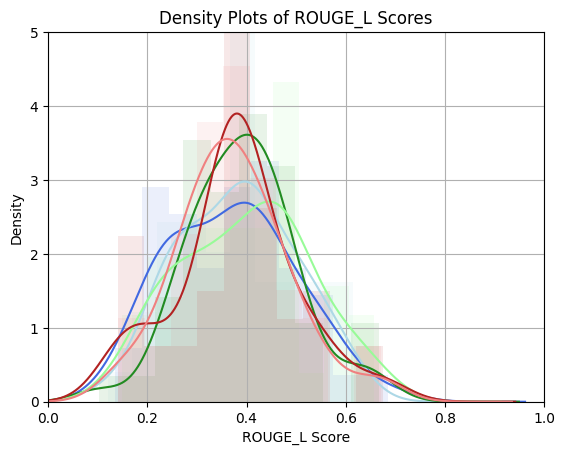

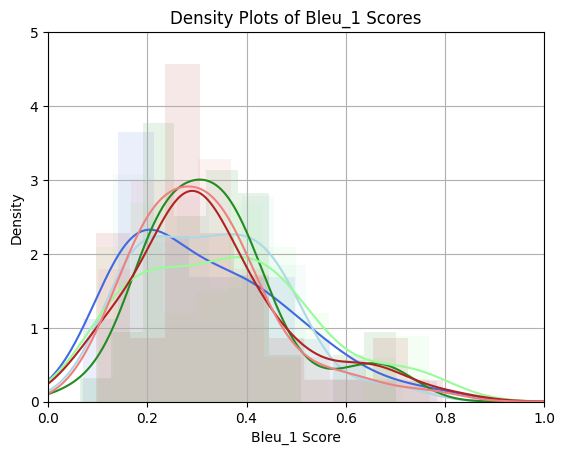

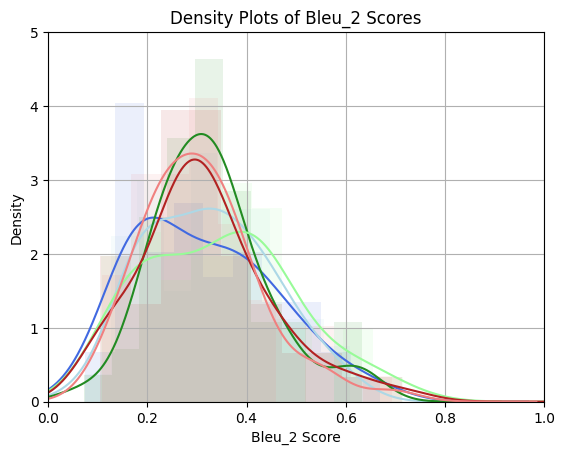

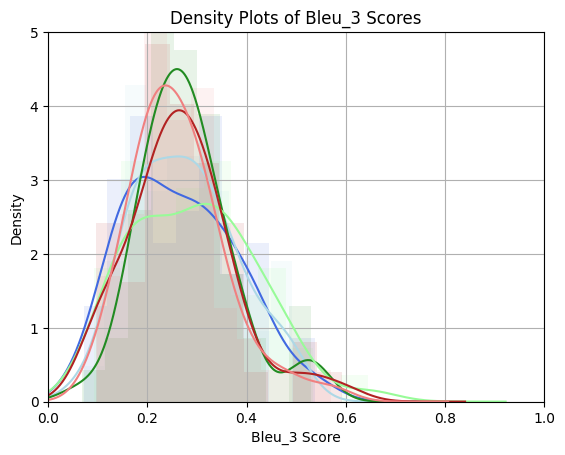

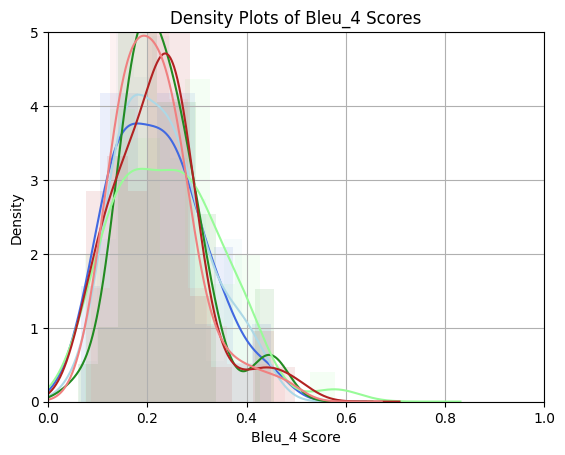

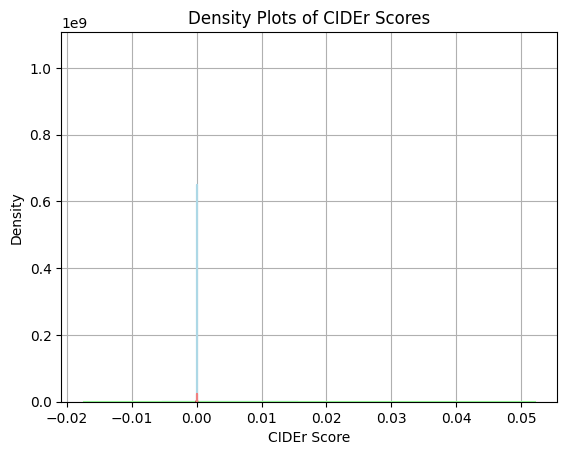

<Figure size 640x480 with 0 Axes>

In [28]:
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats
import pandas as pd

colors = ['royalblue', 'lightblue', 'forestgreen', 'palegreen', 'firebrick', 'lightcoral']

for metric in ['ROUGE_L','Bleu_1','Bleu_2','Bleu_3','Bleu_4','CIDEr']:
    densities = []
    for eval_data in evals:
        scores = [eva[metric] for eva in eval_data.evalImgs]  
        #kde = stats.gaussian_kde(scores)
        #x = np.linspace(min(scores), max(scores), 400)
        #density = kde(x)
        densities.append(scores)

 
    plt.xlabel(f'{metric} Score')
    plt.ylabel('Probability Density')
    plt.title(f'Density Plots of {metric} Scores')


    for i, density in enumerate(densities):
        label = f"Configuration {i+1}"  
        #density.plot.kde(color = colors[i])
        #plt.hist(density, bins=10, label=label, color = colors[i], histtype = 'step', density = True)
        pd.Series(density).plot(kind= "kde", color = colors[i])
        plt.hist(density, bins=10, alpha = 0.1, label=label, color = colors[i], density = True)

    plt.grid(True)
    if metric != 'CIDEr':
        plt.ylim(0,5)
        plt.xlim(0,1)
    #plt.legend(title="Evaluations", loc='upper left', bbox_to_anchor=(1, 1), prop={'size': 8})
    #plt.subplots_adjust(right=0.2)
    plt.savefig(f'{metric}_densities.jpg')
    plt.show()
    plt.clf()

True
ground truth captions
A man riding an elephant into some water of a creek.
man riding an elephant into water surrounded by forest
A man riding an elephant in a river.
A man in a brown shirt rides an elephant into the water.
A man rides an elephant into a river.
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!


generated caption

Caption: A lone elephant is spotted in a photo, with a person riding it and a giraffe seeming happy nearby. Elephants are also seen wearing saddles. In the background, a second elephant can be identified.
(CIDEr score 0.00000) (Ref CIDEr score 0.00000)
(ROUGE_L score 0.44290) (Ref ROUGE_L score 0.44290)
(Bleu_1 score 0.33816) (Ref Bleu_1 score 0.33816)
(Bleu_2 score 0.32159) (Ref Bleu_1 score 0.33816)
(Bleu_3 score 0.26764) (Ref Bleu_1 score 0.33816)
(Bleu_4 score 0.21077) (Ref Bleu_1 score 0.33816)


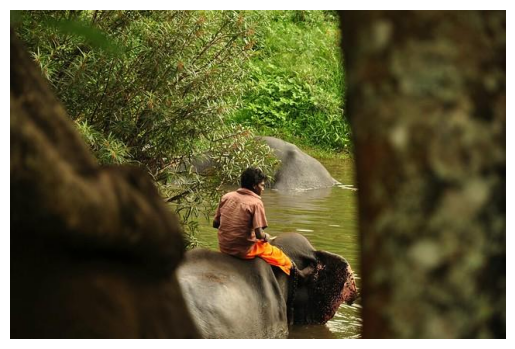



True
ground truth captions
A herd of buffalo grazing on grass next to the ocean.
A herd of black sheep grazing near the shore
A field full of wild animals next to a beach.
A group of animals grazing next to a beach and ocean.
A herd of large wholly sheep walk near a beach.
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!


generated caption

Caption: A set of 6 sheep images, with 2 baby bears visible, next to an elephant at a beach; the animals aren't on a farm. 

Justification: 

1. The first question-answer pair indicates that the animals in the photo aren't typically found on a farm, so I used this context to frame the overall theme of the captions. 

2. For the second question-answer pair, I identified two separate animals: sheep and baby bears. This distinction allowed me to provide a more detailed answer about the animals in the photo. 

3. In the third question-answer pair, I answered the key query by identifying the specific animal next to

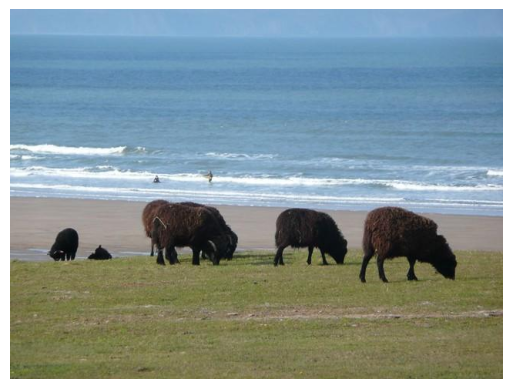



True
ground truth captions
The group of people are skiing on the snow. 
People trek up the snowy mountain side with skis
five people climbing up a snowy hill to snow ski
A group of skiers trekking through the snow 
Four people are going up a mountain with walking sticks.
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!


generated caption

No snow falling, no skiing, 4 men present, yes snowboarding, no one in motion, 0 skateboarders, no attempt to slow down, standing still. 

(Based on the given information, I limited myself to answering 'no' since the answers were either 'no' or 'yes' for all the other questions. The description ended with'standing still' to emphasize that everyone was not moving.)
(CIDEr score 0.00000) (Ref CIDEr score 0.00000)
(ROUGE_L score 0.25104) (Ref ROUGE_L score 0.25104)
(Bleu_1 score 0.18848) (Ref Bleu_1 score 0.18848)
(Bleu_2 score 0.19262) (Ref Bleu_1 score 0.18848)
(Bleu_3 score 0.17187) (Ref Bleu_1 score 0.18848)
(B

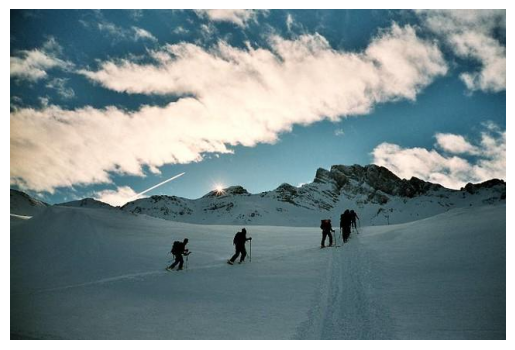



True
ground truth captions
A macaroni dish with broccoli, onion and tomato
A bowl of pasta, broccoli, onion, and carrots.
A bowl filled with pasta, veggies and seasoning.
A photo of a homemade swirly pasta with broccoli, carrots, and onions.
some noodles are mixed in a blue bowl
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!


generated caption

A plate with broccoli pasta, a single leaf of lettuce, and no greenery; the meal is healthy but not visually appealing nor edible to everyone. It is a pasta dish. 

Caption: A healthy pasta dish with broccoli, lettuce, and a single leaf of lettuce; however, the appearance and edibility of the meal are questionable.
(CIDEr score 0.00000) (Ref CIDEr score 0.00000)
(ROUGE_L score 0.38274) (Ref ROUGE_L score 0.38274)
(Bleu_1 score 0.26498) (Ref Bleu_1 score 0.26498)
(Bleu_2 score 0.28076) (Ref Bleu_1 score 0.26498)
(Bleu_3 score 0.24109) (Ref Bleu_1 score 0.26498)
(Bleu_4 score 0.20293) (Ref Bleu_1 score 0.2

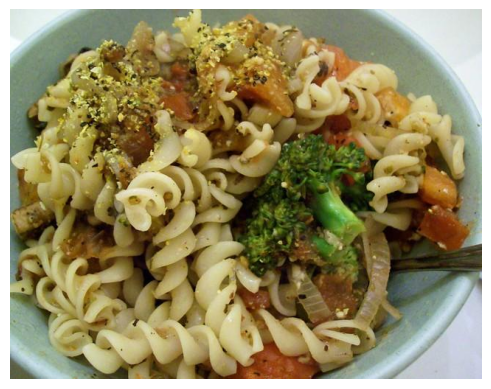



True
ground truth captions
A orange calico cat on top of a vehicle.
a close up of of a cat on top of a car
A calico cat is sitting on the roof of a car at night.
An orange, black and white cat on top of a car.
A cat is on top of a car in the dark.
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!


generated caption

A sedan is closest to the camera, with a no sitting cat on the hood, and it is an American car. The animals are alive, with a giraffe not in captivity, and an orange and black color scheme. The giraffes are not wild.
(CIDEr score 0.00000) (Ref CIDEr score 0.00000)
(ROUGE_L score 0.42120) (Ref ROUGE_L score 0.42120)
(Bleu_1 score 0.31507) (Ref Bleu_1 score 0.31507)
(Bleu_2 score 0.32923) (Ref Bleu_1 score 0.31507)
(Bleu_3 score 0.30174) (Ref Bleu_1 score 0.31507)
(Bleu_4 score 0.26539) (Ref Bleu_1 score 0.31507)


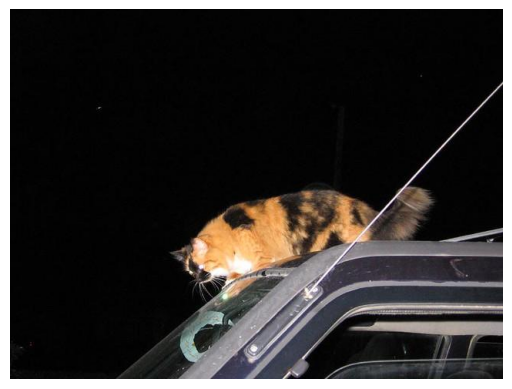



True
ground truth captions
A man riding a skateboard off the side of a cement ramp.
A young man is doing a trick on a skate board.
A person is on a skateboard trying to ride a wall.
a skateboarder with a black shirt is doing a trick
A man on a skateboard is grinding a ramp
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!


generated caption

A boy is skateboarding at a skate park, wearing a black shirt and not wearing a helmet. He is participating in the sport of skateboarding, with his foot touching the skateboard.
(CIDEr score 0.00000) (Ref CIDEr score 0.00000)
(ROUGE_L score 0.47440) (Ref ROUGE_L score 0.47440)
(Bleu_1 score 0.40556) (Ref Bleu_1 score 0.40556)
(Bleu_2 score 0.38079) (Ref Bleu_1 score 0.40556)
(Bleu_3 score 0.34407) (Ref Bleu_1 score 0.40556)
(Bleu_4 score 0.30580) (Ref Bleu_1 score 0.40556)


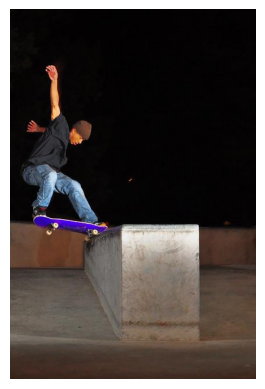



True
ground truth captions
A flock of seagulls walking along a beach.
a number of birds flying on a beach
There are five seagulls are flying along the shore. 
there are many seagulls flying around the beach
A group of seagulls fly close to the sand on the shore of a beach.
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!


generated caption

Caption: A green surfboard on a sunny day with a seagull in the sky and waves splashing, not a calm surface. 

Explanation: I used the information from the question-answer pairs to generate a concise description. The color of the surfboard (green) and the presence of a seagull were key elements, as well as the absence of cloudy and rainy conditions. The waves and their activity were also important indicators of the overall scene.
(CIDEr score 0.00000) (Ref CIDEr score 0.00000)
(ROUGE_L score 0.30571) (Ref ROUGE_L score 0.30571)
(Bleu_1 score 0.19362) (Ref Bleu_1 score 0.19362)
(Bleu_2 score 0.19946) (Ref Bleu_

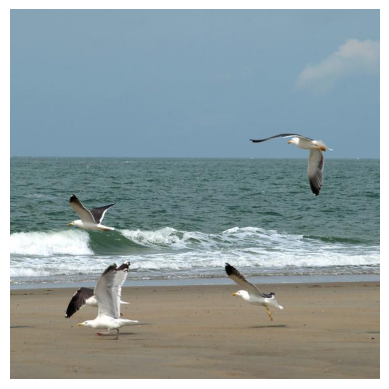



True
ground truth captions
A boy is doing a trick on a skateboard
A young man doing tricks on a skateboard using a bench
A guy on a skate board up in the air.
THERE IS A BOY THAT IS JUMPING ON THE SKATE BOARD
Boy on a skateboard in mid air at a public space.
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!


generated caption

The boy is skateboarding at a park, with clear skies and an afternoon atmosphere. The men on the plane are not part of any activity other than skateboarding, and neither is it raining, nor is the ground completely dry. The boy is not wearing a helmet, and the plane is not being boarded.
(CIDEr score 0.00000) (Ref CIDEr score 0.00000)
(ROUGE_L score 0.32465) (Ref ROUGE_L score 0.32465)
(Bleu_1 score 0.24138) (Ref Bleu_1 score 0.24138)
(Bleu_2 score 0.25195) (Ref Bleu_1 score 0.24138)
(Bleu_3 score 0.22832) (Ref Bleu_1 score 0.24138)
(Bleu_4 score 0.19792) (Ref Bleu_1 score 0.24138)


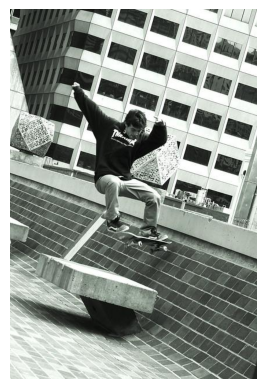



True
ground truth captions
A black and white zebra stands in a grassy field.
A zebra running at trotting speed across a field of grass.
A zebra standing in a grassy field with trees in the background.
A zebra stands in a field of grass.
A zebra standing in a bright green field of grass.
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!


generated caption

Zebra in a controlled environment with limited natural habitat, surrounded by trees and no fence, with no reflection observed. Pine trees are in the back. The zebra appears to be free roaming.
(CIDEr score 0.00000) (Ref CIDEr score 0.00000)
(ROUGE_L score 0.46365) (Ref ROUGE_L score 0.46365)
(Bleu_1 score 0.37436) (Ref Bleu_1 score 0.37436)
(Bleu_2 score 0.35957) (Ref Bleu_1 score 0.37436)
(Bleu_3 score 0.30654) (Ref Bleu_1 score 0.37436)
(Bleu_4 score 0.25901) (Ref Bleu_1 score 0.37436)


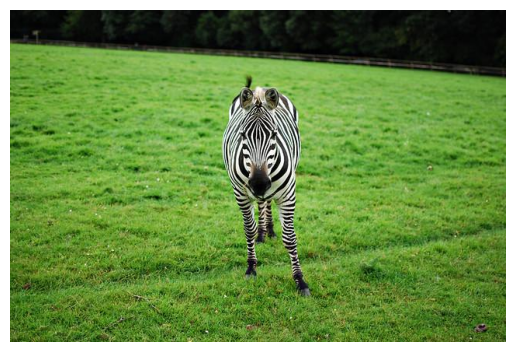



True
ground truth captions
A panda is eating a frozen treat with fruit in it.
a panda bear laying in a field near a rock
A panda resting on a hard surface on the ground.
A panda curled up asleep on a rock.
A panda bear playing with a rock. 
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!


generated caption

Caption: A black and white panda is sleeping in the picture, with a happy dog yawning in the background. There are zero cows facing the camera and the horse is looking at food. The spot on the back of the animal is black.
(CIDEr score 0.00000) (Ref CIDEr score 0.00000)
(ROUGE_L score 0.37981) (Ref ROUGE_L score 0.37981)
(Bleu_1 score 0.32589) (Ref Bleu_1 score 0.32589)
(Bleu_2 score 0.32438) (Ref Bleu_1 score 0.32589)
(Bleu_3 score 0.27525) (Ref Bleu_1 score 0.32589)
(Bleu_4 score 0.23256) (Ref Bleu_1 score 0.32589)


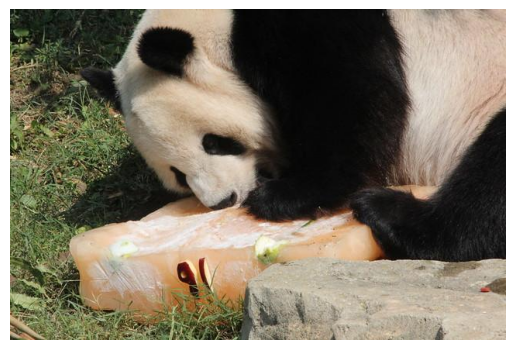



True
ground truth captions
A group of kids playing team baseball, the catcher and umpire are behind the kid that is at bat.
A baseball batter at the end of his swing.
A baseball player swinging a bat over home plate.
A baseball player batting while a catcher and umpire sit behind him and a row of baseball players watch.
A man swinging his bat as another man holds his glove.
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!


generated caption

A baseball game with 2 players on the field and an audience watching, the batter is wearing a red jersey. The battery is on the left side and the spectators are sitting down.
(CIDEr score 0.00000) (Ref CIDEr score 0.00000)
(ROUGE_L score 0.63085) (Ref ROUGE_L score 0.63085)
(Bleu_1 score 0.63277) (Ref Bleu_1 score 0.63277)
(Bleu_2 score 0.61148) (Ref Bleu_1 score 0.63277)
(Bleu_3 score 0.53081) (Ref Bleu_1 score 0.63277)
(Bleu_4 score 0.45069) (Ref Bleu_1 score 0.63277)


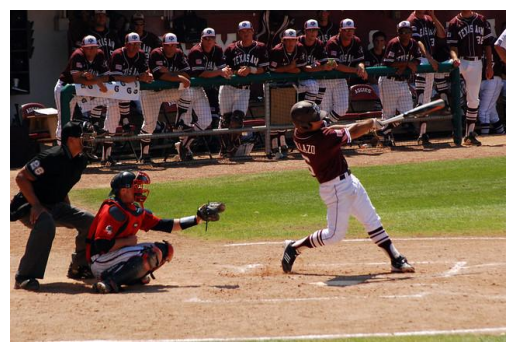



True
ground truth captions
Several skiers can be seen making their way down the slope.
There are four skiers currently in the same area. 
Four people skiing traverse down the snowy hillside.
some people skiing down a hill towards a valley
A group of people riding skis down a snowy hill.
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!


generated caption

Skiing in red coat, not seeing clouds or sun, not trying to slow down; a person in motion wearing red. 

Caption: A person is skiing in a red coat with clear skies and sunny weather.
(CIDEr score 0.00000) (Ref CIDEr score 0.00000)
(ROUGE_L score 0.41338) (Ref ROUGE_L score 0.41338)
(Bleu_1 score 0.42077) (Ref Bleu_1 score 0.42077)
(Bleu_2 score 0.39650) (Ref Bleu_1 score 0.42077)
(Bleu_3 score 0.31210) (Ref Bleu_1 score 0.42077)
(Bleu_4 score 0.22800) (Ref Bleu_1 score 0.42077)


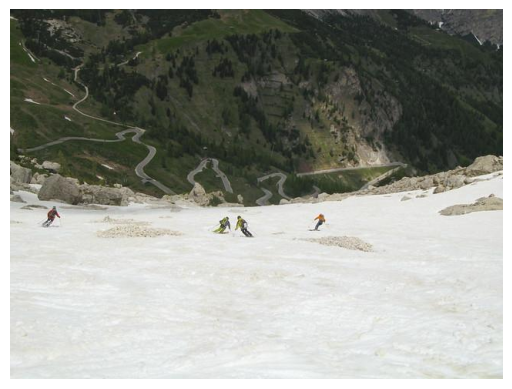



True
ground truth captions
Man with food items walking on sidewalk while listening to audio.
A man with glasses and earbuds holding a cup and a paper bag.
a person walking with a bad and a cup 
A man walking with a drink and a bag while listening to earbud headphones.
A man carries a bag of food and a drink away from a roadside eatery.
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!


generated caption

Caption: A photo with a red shirt, no real hair, 5 people, a man holding an umbrella, a woman eating a sandwich, a metal clock tower, and a white person with toothpaste on their toothbrush.
(CIDEr score 0.00000) (Ref CIDEr score 0.00000)
(ROUGE_L score 0.48287) (Ref ROUGE_L score 0.48287)
(Bleu_1 score 0.50521) (Ref Bleu_1 score 0.50521)
(Bleu_2 score 0.47694) (Ref Bleu_1 score 0.50521)
(Bleu_3 score 0.40135) (Ref Bleu_1 score 0.50521)
(Bleu_4 score 0.33541) (Ref Bleu_1 score 0.50521)


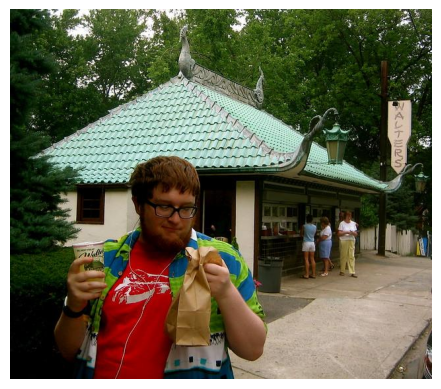



True
ground truth captions
A dinner plate has a lot of different food on it. 
The platter of food features a variety of dishes.
A plate of food on a table in a room.
A white plate topped with lots of different foods.
A platter of different types of food on a plate.
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!


generated caption

This kind of food, shown as American and typically eaten for lunch, consists of french fries paired with a fork. However, it doesn't appear that utensils are being actively used. Though ketchup is absent, notice the presence of a fork alongside the fries. The answer to the question "Is there ketchup?" is no.
(CIDEr score 0.00000) (Ref CIDEr score 0.00000)
(ROUGE_L score 0.30062) (Ref ROUGE_L score 0.30062)
(Bleu_1 score 0.22468) (Ref Bleu_1 score 0.22468)
(Bleu_2 score 0.23738) (Ref Bleu_1 score 0.22468)
(Bleu_3 score 0.20780) (Ref Bleu_1 score 0.22468)
(Bleu_4 score 0.16196) (Ref Bleu_1 score 0.22468)


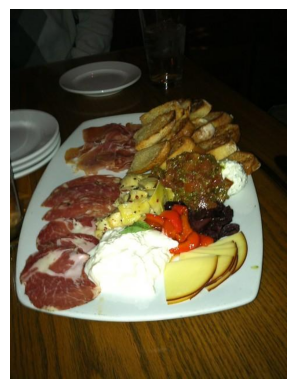



True
ground truth captions
A group of bikers riding on the back of motorcycles.
a motorcycle gang riding together going on a journey 
An orange and a blue motorcycle with people on them next to each other.
an image of group of people to motorcycles
A group of people on motorcycles in a street.
Loading and preparing results...     
DONE (t=0.02s)
creating index...
index created!


generated caption

Based on the given question-answer pairs, the generated caption could be: "Six motorcycles with one rider each, all wearing helmets, parked without any cars in a photo from 2000."
(CIDEr score 0.00000) (Ref CIDEr score 0.00000)
(ROUGE_L score 0.52208) (Ref ROUGE_L score 0.52208)
(Bleu_1 score 0.46448) (Ref Bleu_1 score 0.46448)
(Bleu_2 score 0.44330) (Ref Bleu_1 score 0.46448)
(Bleu_3 score 0.36007) (Ref Bleu_1 score 0.46448)
(Bleu_4 score 0.28928) (Ref Bleu_1 score 0.46448)


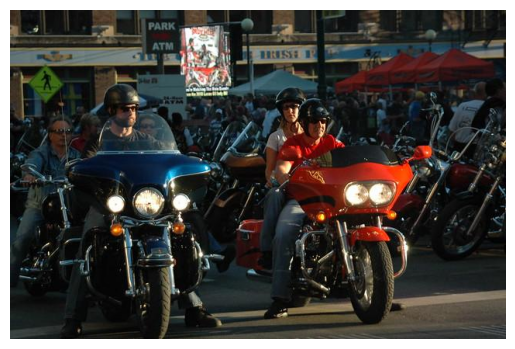



True
ground truth captions
Picture of a stop sign with graffiti written on it.
a stop sign that was vandalized to be strange
A stop sign that has some graffiti on it.
A stop sign has graffiti on it that reads "capitalism". 
a stop sign with graffiti written on it
Loading and preparing results...     
DONE (t=0.02s)
creating index...
index created!


generated caption

Limited caption: Two street names are "stop" and a photo depicting a clear sunny day with 0 cars and 2 signs shows a specific street with a "stop" sign. No clouds are present in the sky in this photo.
(CIDEr score 0.00000) (Ref CIDEr score 0.00000)
(ROUGE_L score 0.40360) (Ref ROUGE_L score 0.40360)
(Bleu_1 score 0.33816) (Ref Bleu_1 score 0.33816)
(Bleu_2 score 0.32916) (Ref Bleu_1 score 0.33816)
(Bleu_3 score 0.25933) (Ref Bleu_1 score 0.33816)
(Bleu_4 score 0.18924) (Ref Bleu_1 score 0.33816)


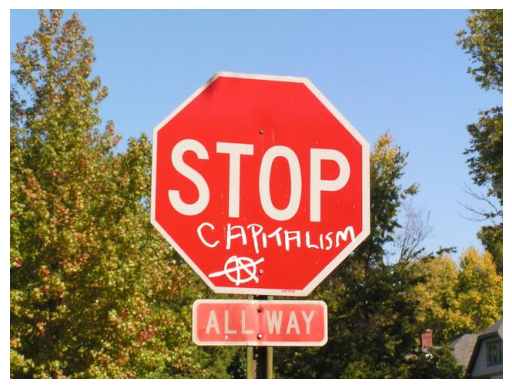



True
ground truth captions
Many different foods on dishes on a table 
Several plates of food are sitting on the table.
A variety of fancy looking dishes on square plates, including some sort of coleslaw and some flat bread.
A white plate topped with a pile of pasta.
There is some food on a table with plates.
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!


generated caption

The captions: 
1. No ketchup on food
2. Green pepper as the only green vegetable
3. 0 slices of eggs on plate
4. End of hot dog burnt
5. Red flavored beverage
6. Pepper as the green vegetable on burger
7. 0 eggs on plate
8. Not a hot dog

Generated short description: Limited information available; various single-word answers with distinct meanings.
(CIDEr score 0.00000) (Ref CIDEr score 0.00000)
(ROUGE_L score 0.40352) (Ref ROUGE_L score 0.40352)
(Bleu_1 score 0.32000) (Ref Bleu_1 score 0.32000)
(Bleu_2 score 0.32046) (Ref Bleu_1 score 0.32000)
(Bleu_3 score 0.27307) (Ref Bl

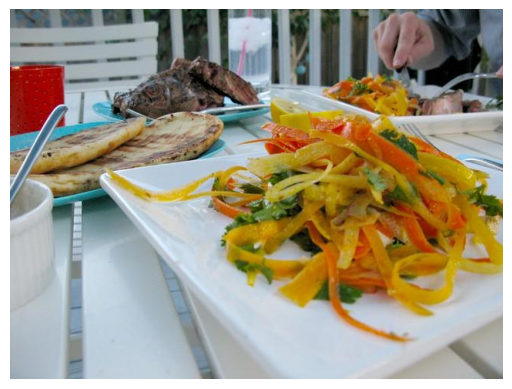



True
ground truth captions
There are people watching other people play table tennis.
People standing around ping pong tables, some with racquets in  hand.
People playing table tennis on more than one table indoors.
A ping pong practice is in action indoors.
A couple of people that are playing a game.
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!


generated caption

A group of 12 people are playing ping pong on a green-colored court, with one person standing on the floor wearing black shorts. 

[Image: A group of 12 people are playing ping pong on a green-colored court, with one person standing on the floor wearing black shorts.] 

Caption: Ping pong game with 12 players on a green court and one person on the floor wearing black shorts.
(CIDEr score 0.00000) (Ref CIDEr score 0.00000)
(ROUGE_L score 0.33293) (Ref ROUGE_L score 0.33293)
(Bleu_1 score 0.23684) (Ref Bleu_1 score 0.23684)
(Bleu_2 score 0.25858) (Ref Bleu_1 score 0.23684)
(Bleu_3 sco

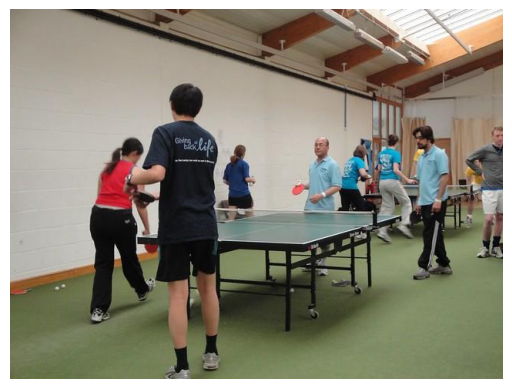



True
ground truth captions
A black and white cat sitting on top of a pile of clothes.
A cat that is sitting on a chair near a bag.
A cat is curled up and sleeping on some clothes next to a backpack. 
a cat sleeps next to a travel bag and clothes 
A cat is sleeping among a pile of clothing.
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!


generated caption

Based on the given question-answer pairs, the generated captions would be:

1. Captured image of a dog looking at a camera.
2. A person sleeping.
3. A cat (not a breed specified, assuming unknown breed).
4. A person confirmed to be going on a trip.
5. A sitting cat is not normal for cats.
6. A child sleeping.
7. Green colored cat eyes.
8. A person is not riding anything. 

These captions are derived quickly and briefly based on the information provided in the question-answer pairs.
(CIDEr score 0.00000) (Ref CIDEr score 0.00000)
(ROUGE_L score 0.25730) (Ref ROUGE_L score 0.25730)
(Bleu_1 score

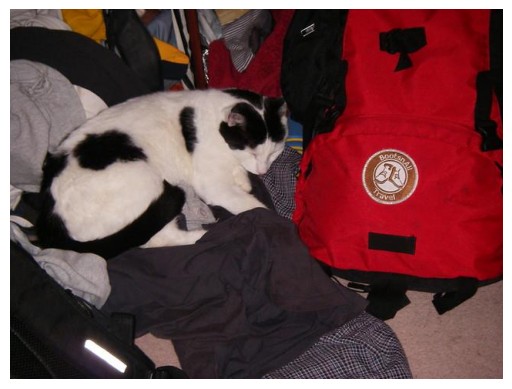



True
ground truth captions
A group of Navy men cutting a large sheet cake.
A bunch of cruise ship workers cut into a cake.
Five men cut a cake at an event. 
some soldiers cutting into a big sheet cake on a table
A group of men cutting into a celebratory cake
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!


generated caption

In this photo, there are 3 people wearing glasses, all of them seem happy while working on a single cake in a kitchen. The men are wearing white shirts, and it appears to be a birthday celebration. There is only 1 cake in the photo. 

Answer: 3 people with glasses, happy mood, birthday celebration, 1 cake, kitchen setting.
(CIDEr score 0.00000) (Ref CIDEr score 0.00000)
(ROUGE_L score 0.29943) (Ref ROUGE_L score 0.29943)
(Bleu_1 score 0.20923) (Ref Bleu_1 score 0.20923)
(Bleu_2 score 0.21712) (Ref Bleu_1 score 0.20923)
(Bleu_3 score 0.18301) (Ref Bleu_1 score 0.20923)
(Bleu_4 score 0.14770) (Ref Bleu_1 score 0.20923)


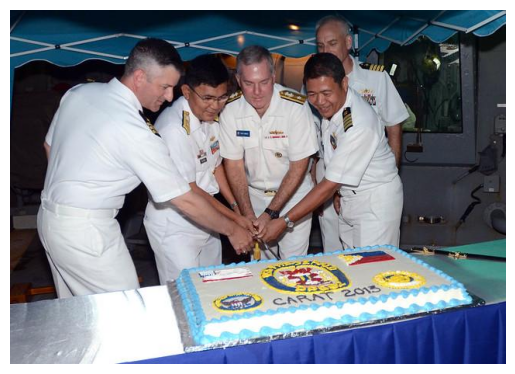



True
ground truth captions
A blue cake with yellow stars around it.
a 50 year birthday cake depicting a toilet 
A birthday cake that is on a platter.
Blue cake with icing in the shape of a toilet on top. 
A picture of someone's 50th birthday cake  that has a toilet on top.
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!


generated caption

Based on the provided information, the generated captions would be:

1. Caption: Empty vase
2. Caption: White hydrant with daisy flowers
3. Caption: Blue items painted
4. Caption: Birthday cake with star topper
5. Caption: Empty space on top of the clock
6. Caption: No vases present
7. Caption: Gray tablecloth
(CIDEr score 0.00000) (Ref CIDEr score 0.00000)
(ROUGE_L score 0.36923) (Ref ROUGE_L score 0.36923)
(Bleu_1 score 0.25559) (Ref Bleu_1 score 0.25559)
(Bleu_2 score 0.25600) (Ref Bleu_1 score 0.25559)
(Bleu_3 score 0.21627) (Ref Bleu_1 score 0.25559)
(Bleu_4 score 0.17834) (Ref Bleu_1 score 0.25559)


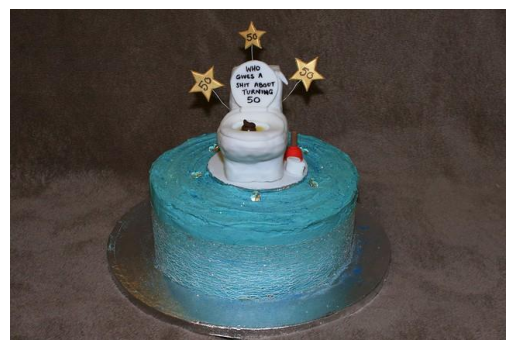



True
ground truth captions
A knife and a pizza cut into slices on the plate
a sliced pizza with pinepple sitting on a pizza pan 
One slice has been taken from this pineapple pizza. 
A pizza sitting on top of a pizza pan under a metal spatula.
Sliced pizza on service platter ready for consumption.
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!


generated caption

Caption: Green peppers on thick, thin crust pizza with single fork visible on table, but no burnt areas; end of the fork can be seen. 

Steps:
1. Identify key information in each question-answer pair.
2. Create a descriptive statement using these key pieces of information.
3. Keep the description brief while encompassing all the key details.
(CIDEr score 0.00000) (Ref CIDEr score 0.00000)
(ROUGE_L score 0.32258) (Ref ROUGE_L score 0.32258)
(Bleu_1 score 0.24781) (Ref Bleu_1 score 0.24781)
(Bleu_2 score 0.27583) (Ref Bleu_1 score 0.24781)
(Bleu_3 score 0.22925) (Ref Bleu_1 score 0.24781)

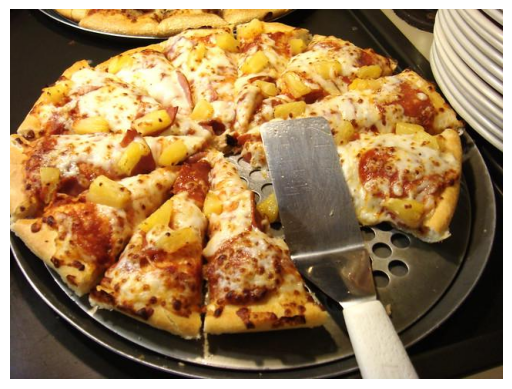



True
ground truth captions
A table with a pink umbrella is covered up with a clear plastic.
an outside table is covered in some plastic
An outdoor table with an umbrella, covered in plastic.
A cart covered in a plastic bag on a side walk.
The plants are covered to protect them from the weather.
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!


generated caption

Caption: A person holds a pink umbrella above their head in an outside area, where it is raining and a green and white bus can be seen passing by. There is only one other person holding an umbrella in the scene. The room they're in is not on the top floor of a building.
(CIDEr score 0.00000) (Ref CIDEr score 0.00000)
(ROUGE_L score 0.37277) (Ref ROUGE_L score 0.37277)
(Bleu_1 score 0.32727) (Ref Bleu_1 score 0.32727)
(Bleu_2 score 0.33149) (Ref Bleu_1 score 0.32727)
(Bleu_3 score 0.30429) (Ref Bleu_1 score 0.32727)
(Bleu_4 score 0.25983) (Ref Bleu_1 score 0.32727)


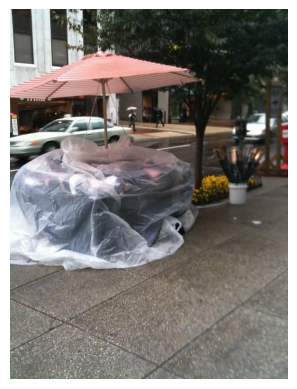



True
ground truth captions
A person walking through the snow near a fence.
A person cross country skiing on a path.
A person riding skis across a snow covered road.
A cross country skier travels a worn snow path.
A man cross country skiing in the country.
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!


generated caption

The young girl is skiing with poles in the snowy scene, moving at an unknown pace with a helmet on her head. There is only one person in the picture, and it is representing one of the many scenes showcasing skiing sports. The ground is fully covered in snow, creating a serene and picturesque atmosphere.
(CIDEr score 0.00000) (Ref CIDEr score 0.00000)
(ROUGE_L score 0.28938) (Ref ROUGE_L score 0.28938)
(Bleu_1 score 0.23453) (Ref Bleu_1 score 0.23453)
(Bleu_2 score 0.24762) (Ref Bleu_1 score 0.23453)
(Bleu_3 score 0.22142) (Ref Bleu_1 score 0.23453)
(Bleu_4 score 0.18667) (Ref Bleu_1 score 0.23453)


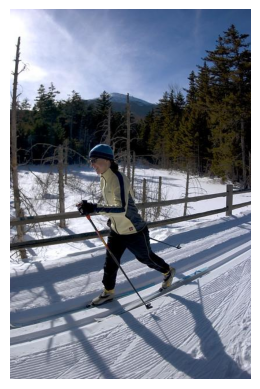



True
ground truth captions
a man is outside holding a ball and a racket
Male tennis player surveying a clay tennis court for imperfections.
Athlete deciding on ball to use for service during match play.
A person is standing in a court with racket in one hand and balls in other hand.
A man with a tennis racket walks with two tennis balls in his hand.
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!


generated caption

Caption: A single man, holding a tennis racket, is standing with one foot on the ground while wearing gloves. There is a tennis ball in the foreground. This is not a tennis tournament in Australia and only one person is present.

Explanation: I first looked at all the given information and found that it consists of different question-answer pairs. I addressed each pair accordingly to provide a concise summary. The information about the man, the ground, and the tennis ball were extracted from the first question-answer pair. The inform

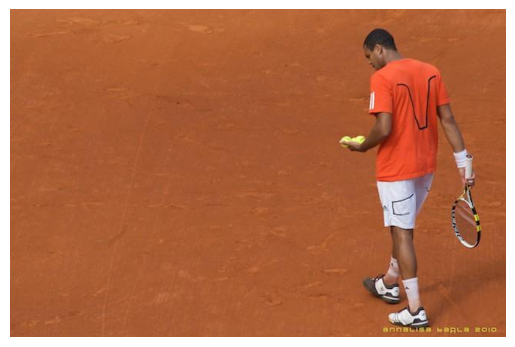



True
ground truth captions
a person riding  a wave on top of a surfboard.
A surfer on a surfboard catching a wave at the ocean.
a man stands on a surfboard riding a small wave
A surfer riding a wave toward the edge of the water.
A female surfer stands on her board in the water.
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!


generated caption

Generated caption: A girl in black shorts is not wearing a thong bikini, and a man is surfing; both individuals are female and their bikinis are blue. The gender of the person is apparent, and they are not sitting down.
(CIDEr score 0.00000) (Ref CIDEr score 0.00000)
(ROUGE_L score 0.38659) (Ref ROUGE_L score 0.38659)
(Bleu_1 score 0.34234) (Ref Bleu_1 score 0.34234)
(Bleu_2 score 0.34312) (Ref Bleu_1 score 0.34234)
(Bleu_3 score 0.29505) (Ref Bleu_1 score 0.34234)
(Bleu_4 score 0.24355) (Ref Bleu_1 score 0.34234)


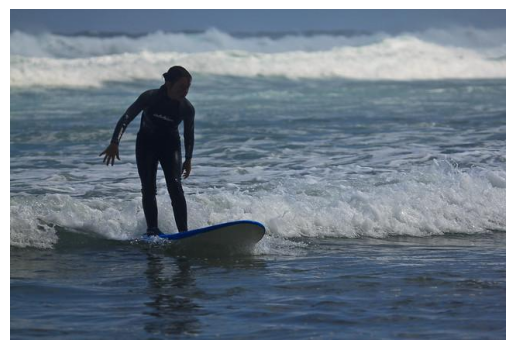



True
ground truth captions
The three girls have surfboards on the beach.
3 female surfers with their boards at the beach
Three people with surfboards on the sandy beach.
A woman kneeling next to a white snowboard on the sand.
Women are getting ready to surf on a stormy day.
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!


generated caption

Rider not racing, red shorts near photographer, 4 people, not in desert, 1 surfboard, not all flying kites, not on ski slope, woman has hair. 

Generated caption: Rider not racing, with red-clad photographer, four people around, no sign of desert, one surfboard, no kite flying, and a woman with hair.
(CIDEr score 0.00000) (Ref CIDEr score 0.00000)
(ROUGE_L score 0.31993) (Ref ROUGE_L score 0.31993)
(Bleu_1 score 0.24917) (Ref Bleu_1 score 0.24917)
(Bleu_2 score 0.26414) (Ref Bleu_1 score 0.24917)
(Bleu_3 score 0.22059) (Ref Bleu_1 score 0.24917)
(Bleu_4 score 0.17978) (Ref Bleu_1 score 0.24917)


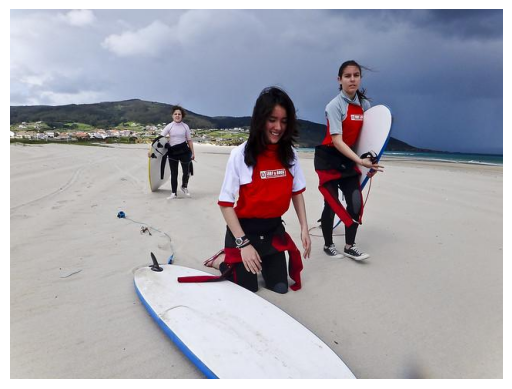



True
ground truth captions
A Qatar airlines plane on an airport runway. 
An airplane is on the runway ready to take off.
an air plane on an air port run way
A commercial international airline jet on a runway strip.
An airplane sits on a runway at an airport.
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!


generated caption

Caption: A clear square plate with vegetables, including a purple carrot, and no fish; not all items on the plate are fruits, and one item (carrots) is not a fruit.
(CIDEr score 0.00000) (Ref CIDEr score 0.00000)
(ROUGE_L score 0.42533) (Ref ROUGE_L score 0.42533)
(Bleu_1 score 0.38728) (Ref Bleu_1 score 0.38728)
(Bleu_2 score 0.36448) (Ref Bleu_1 score 0.38728)
(Bleu_3 score 0.28243) (Ref Bleu_1 score 0.38728)
(Bleu_4 score 0.19970) (Ref Bleu_1 score 0.38728)


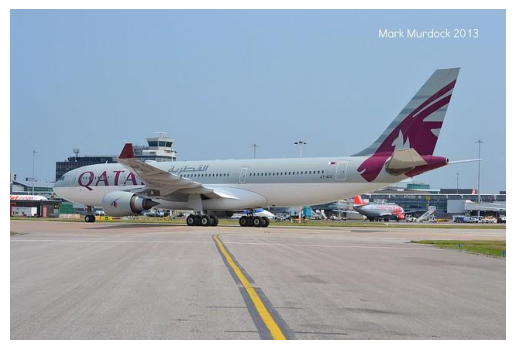



True
ground truth captions
a public transit bus on a city street 
One bus after another takes on passengers at the terminal.
A bus traveling down the road with another behind it.
The white and blue bus is driving down the road
a couple of buses that are out front of a building
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!


generated caption

This pictures depicts a city bus in England with the sign reading 41, and the weather is cloudy and not sunny. The photo does not show a yellow bus or one taken in the United States.
(CIDEr score 0.00000) (Ref CIDEr score 0.00000)
(ROUGE_L score 0.43035) (Ref ROUGE_L score 0.43035)
(Bleu_1 score 0.43243) (Ref Bleu_1 score 0.43243)
(Bleu_2 score 0.44166) (Ref Bleu_1 score 0.43243)
(Bleu_3 score 0.38128) (Ref Bleu_1 score 0.43243)
(Bleu_4 score 0.31171) (Ref Bleu_1 score 0.43243)


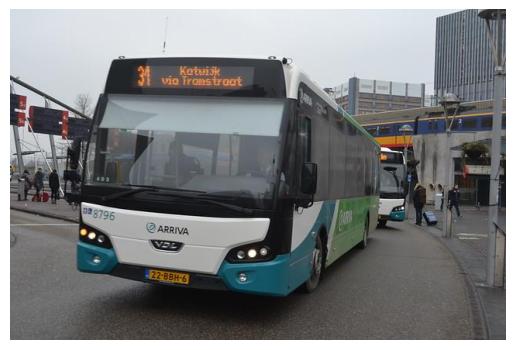



True
ground truth captions
Some fancy dressed folks on some horses in a crowd.
A man on a horse in riding gear looking onward.
Several riders on horse back interacting with a crowd.
Two people on horses surrounded by a crowd of people.
Old man in green rides horse with another horse in tow
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!


generated caption

Caption: Two women in hats are riding horses and a man in riding pants, likely in a polo game setting. 

The given question-answer pairs provide limited information, primarily focusing on the animals and people involved in the scene. Based on this information, a caption is generated to describe the scene, specifying the number of women and horses present, the style of pants worn by the man in the hat, and the sport being played (polo).
(CIDEr score 0.00000) (Ref CIDEr score 0.00000)
(ROUGE_L score 0.24221) (Ref ROUGE_L score 0.24221)
(Bleu_1 score 0.20000) (Ref Bleu_1 score 0.20000)
(Bleu_2 sc

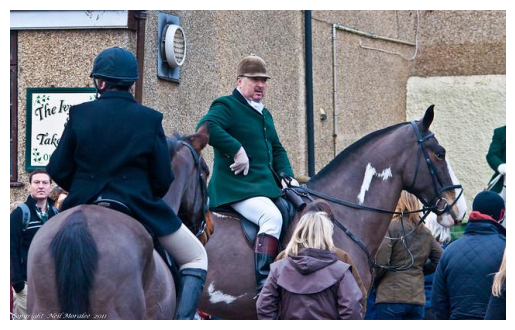



True
ground truth captions
A set of orange road blocks sitting next to a traffic light.
A car stopped at a red light with traffic cones in the intersection.
A road under construction in the countryside. 
A street with caution barrels and a stop light.
A construction zone is visible through a windshield.
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!


generated caption

New York, no rain, no one crossing, white street sign, red fire hydrant, school bus, no clouds, no crossing. 

Generated caption: In New York, it's currently not raining and there are no people crossing the street. The street sign is white, a red fire hydrant can be found nearby, and a school bus is observed. Clouds are absent.
(CIDEr score 0.00000) (Ref CIDEr score 0.00000)
(ROUGE_L score 0.32553) (Ref ROUGE_L score 0.32553)
(Bleu_1 score 0.25904) (Ref Bleu_1 score 0.25904)
(Bleu_2 score 0.26093) (Ref Bleu_1 score 0.25904)
(Bleu_3 score 0.22196) (Ref Bleu_1 score 0.25904)
(Bleu_

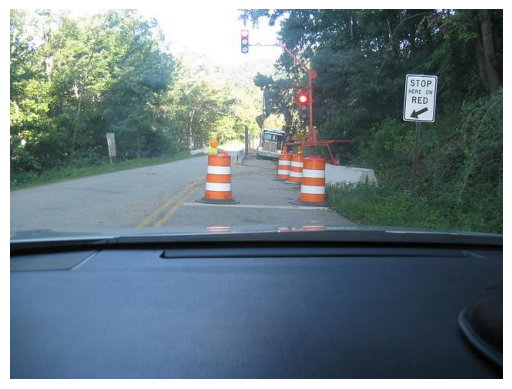



True
ground truth captions
A young girl holding a backpack while walking across a field.
a tiny toddler carries a giant bookbag and bag 
A young child is holding some things and walking. 
The little girl is carrying a big book bag around.
A little girl holding a bag walking in the open.
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!


generated caption

The man is seated on a bench, wearing a purple vest with nothing on his face. Yes, someone is on the bench, and the child is holding an umbrella while it's not raining. The woman has gloves on her hands.
(CIDEr score 0.00000) (Ref CIDEr score 0.00000)
(ROUGE_L score 0.39997) (Ref ROUGE_L score 0.39997)
(Bleu_1 score 0.35577) (Ref Bleu_1 score 0.35577)
(Bleu_2 score 0.35421) (Ref Bleu_1 score 0.35577)
(Bleu_3 score 0.30590) (Ref Bleu_1 score 0.35577)
(Bleu_4 score 0.26440) (Ref Bleu_1 score 0.35577)


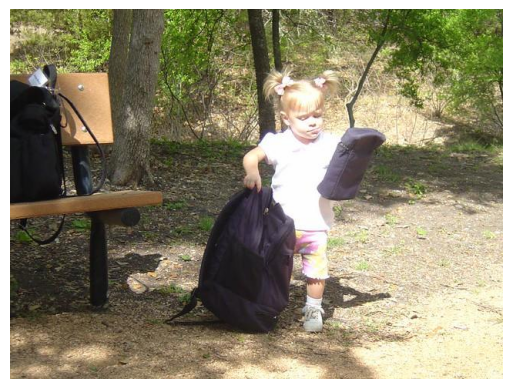



True
ground truth captions
A man holding a cell phone with a pack of Marlboro Lights on his lap 
a close up of a person holding a cell phone
A man is holding onto his small Nokia phone.
A man holding a Nokia cell phone with a packet of Marlboro cigarettes in his lap. 
a man that is holding a cell phone in his hand
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!


generated caption

The man is holding a silver phone, which is not brand new and doesn't have a broken screen. The cat is sitting on the person's lap, and there is no cat involved. The phone is not light on, and the person is holding it in their left hand.
(CIDEr score 0.00000) (Ref CIDEr score 0.00000)
(ROUGE_L score 0.46034) (Ref ROUGE_L score 0.46034)
(Bleu_1 score 0.35246) (Ref Bleu_1 score 0.35246)
(Bleu_2 score 0.33419) (Ref Bleu_1 score 0.35246)
(Bleu_3 score 0.29209) (Ref Bleu_1 score 0.35246)
(Bleu_4 score 0.25517) (Ref Bleu_1 score 0.35246)


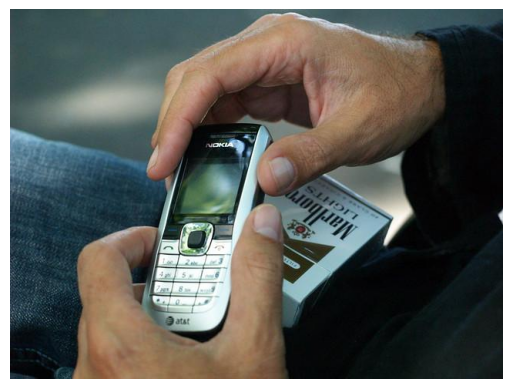



True
ground truth captions
People standing on beach with kites and bicycles with cloudy sky
A couple of women standing next to a  bike on a beach.
Some people on a sandy beach with a bike.
A woman on a beach by bags and a bicycle.
Women at the beach with many children and kites.
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!


generated caption

A green bike is parked at the beach while kite flying is happening in the background. A backpack is on the back of the bike. A group of people are participating in kite flying, a popular event at the beach. The color of the bicycle is green, and it is a type of kite flying activity taking place.
(CIDEr score 0.00000) (Ref CIDEr score 0.00000)
(ROUGE_L score 0.32439) (Ref ROUGE_L score 0.32439)
(Bleu_1 score 0.26087) (Ref Bleu_1 score 0.26087)
(Bleu_2 score 0.26298) (Ref Bleu_1 score 0.26087)
(Bleu_3 score 0.23950) (Ref Bleu_1 score 0.26087)
(Bleu_4 score 0.20493) (Ref Bleu_1 score 0.26087)


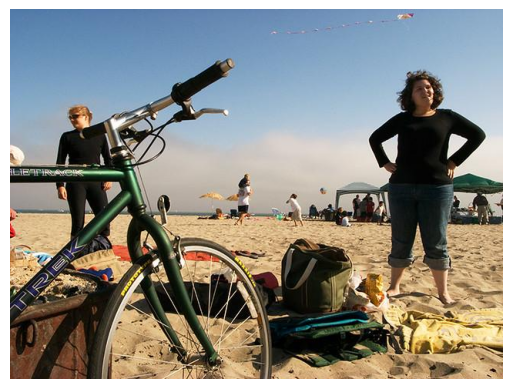



True
ground truth captions
Young man on side of the road pointing at a truck.
A man standing next to a parked truck in a forest.
Man in a white shirt standing next to a green truck. 
A man stands next to a truck on the side of the road.
Man standing next to truck on dirt road with trees
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!


generated caption

Many vehicles, primarily a blue car with unknown bumper plate words, are common and some trucks aren't parked on grass. Sunshine is present, but it's unclear if people or cats are riding motorcycles or playing. The cat isn't playing. None of the trucks are mentioned to be pulling anything.
(CIDEr score 0.00000) (Ref CIDEr score 0.00000)
(ROUGE_L score 0.35244) (Ref ROUGE_L score 0.35244)
(Bleu_1 score 0.24080) (Ref Bleu_1 score 0.24080)
(Bleu_2 score 0.25425) (Ref Bleu_1 score 0.24080)
(Bleu_3 score 0.22161) (Ref Bleu_1 score 0.24080)
(Bleu_4 score 0.17912) (Ref Bleu_1 score 0.24080)


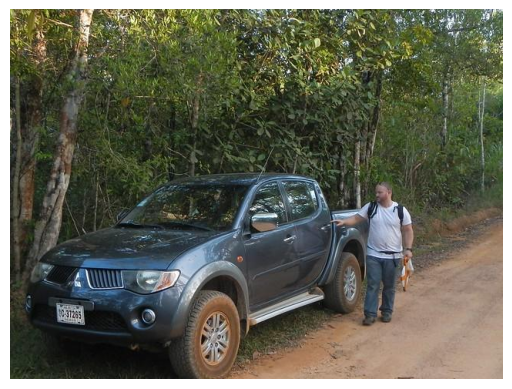



True
ground truth captions
a guy that is skiing down a snowy hill
A guy on a snowboard going down a mountain.
A skier in orange pants skies down a snowy hill.
A man riding a snowboard down the side of a snow covered slope.
A snowboarder riding his board down the slope.
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!


generated caption

A person is snowboarding, wearing a white coat, and there is one man present on the snowy winter ground. The skiers are not trying to slow down, and the man is in motion.
(CIDEr score 0.00000) (Ref CIDEr score 0.00000)
(ROUGE_L score 0.49095) (Ref ROUGE_L score 0.49095)
(Bleu_1 score 0.43931) (Ref Bleu_1 score 0.43931)
(Bleu_2 score 0.45203) (Ref Bleu_1 score 0.43931)
(Bleu_3 score 0.39860) (Ref Bleu_1 score 0.43931)
(Bleu_4 score 0.33298) (Ref Bleu_1 score 0.43931)


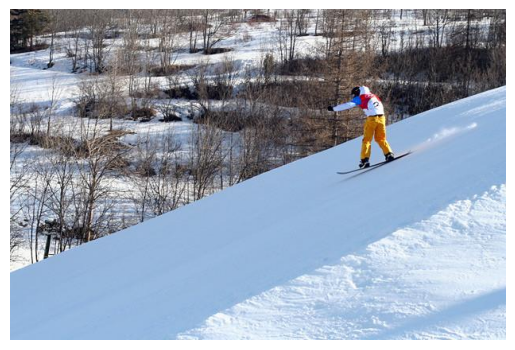



True
ground truth captions
A colonial style bed with a white bedspread.
The bed is big it has a white blanket on it.
A bedroom with a wooden bed frame and mirror.
A wooden bed with white bedspread and a mirror
The bed in the bedroom is made up and ready to sleep in. 
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!


generated caption

Caption: This is a hotel room with white walls, a queen bed, and white pillowcase. The lamp is on, and there's one chair present. The room is lit during the day time, and the lights are on.
(CIDEr score 0.00000) (Ref CIDEr score 0.00000)
(ROUGE_L score 0.43696) (Ref ROUGE_L score 0.43696)
(Bleu_1 score 0.40206) (Ref Bleu_1 score 0.40206)
(Bleu_2 score 0.40568) (Ref Bleu_1 score 0.40206)
(Bleu_3 score 0.34281) (Ref Bleu_1 score 0.40206)
(Bleu_4 score 0.27722) (Ref Bleu_1 score 0.40206)


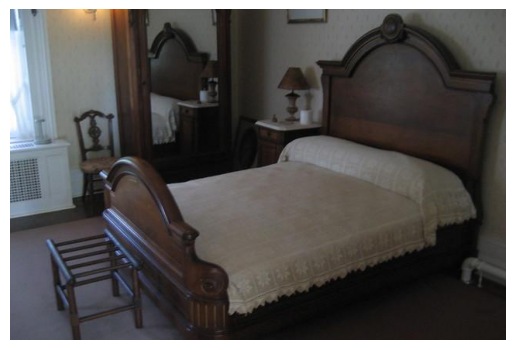



True
ground truth captions
A cat laying on top of a couch on top of a pillow.
A cat laying on a pillow on a sofa.
A white and brown cat lying on a couch 
A cat laying on a pillow on a couch near curtains. 
An orange tabby cat is sitting on top of a pillow that is sitting in a couch.
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!


generated caption

The cat is awake, looking at a red blanket on a multi-colored towel while lying on an orange sheeted bed.
(CIDEr score 0.00002) (Ref CIDEr score 0.00002)
(ROUGE_L score 0.66681) (Ref ROUGE_L score 0.66681)
(Bleu_1 score 0.70093) (Ref Bleu_1 score 0.70093)
(Bleu_2 score 0.61930) (Ref Bleu_1 score 0.70093)
(Bleu_3 score 0.51776) (Ref Bleu_1 score 0.70093)
(Bleu_4 score 0.43160) (Ref Bleu_1 score 0.70093)


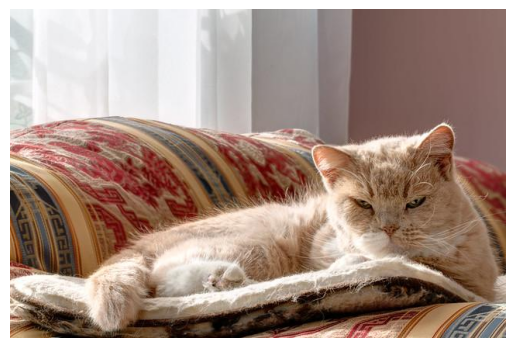



True
ground truth captions
An ornate vase with a handle sitting on a table.
a black gold and white vase sitting on a counter
There is a small and decorative urn pitcher
A black and gold antique looking vase or pitcher is sitting on a ledge.  
A ceramic piece of art is seated on the table in a room 
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!


generated caption

A vase with no water, flowers not growing, and a brown cake. The vase on the right is also bronze. Freshness of the flowers is uncertain. (Caption: Unusual Vase, Flower-less Condition, and Colorful Cake)
(CIDEr score 0.00000) (Ref CIDEr score 0.00000)
(ROUGE_L score 0.45951) (Ref ROUGE_L score 0.45951)
(Bleu_1 score 0.38863) (Ref Bleu_1 score 0.38863)
(Bleu_2 score 0.37006) (Ref Bleu_1 score 0.38863)
(Bleu_3 score 0.30191) (Ref Bleu_1 score 0.38863)
(Bleu_4 score 0.23738) (Ref Bleu_1 score 0.38863)


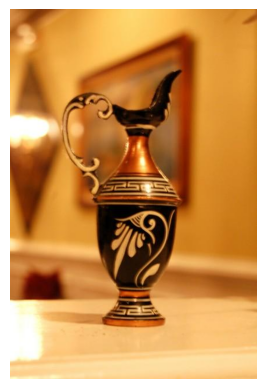



True
ground truth captions
A crowd of people standing around a field.
A man and his dog are on a field with a crowd watching the dog standing up holding onto the frisbee.
A dog is catching a Frisbee at a competition.
A dog performing a trick at a dog show.
People are watching a dog stand on its hind legs.
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!


generated caption

People watching frisbee game; brightest color on boy's shirt is white, no ball hit yet, man holding frisbee, yes ball in photo.

Caption: Frisbee game with a white-shirted spectator observing. No ball has been hit yet, a frisbee is visible in both hands, and a ball is present in the photo.
(CIDEr score 0.00000) (Ref CIDEr score 0.00000)
(ROUGE_L score 0.45863) (Ref ROUGE_L score 0.45863)
(Bleu_1 score 0.34471) (Ref Bleu_1 score 0.34471)
(Bleu_2 score 0.34013) (Ref Bleu_1 score 0.34471)
(Bleu_3 score 0.29412) (Ref Bleu_1 score 0.34471)
(Bleu_4 score 0.25205) (Ref Bleu_1 score 0.

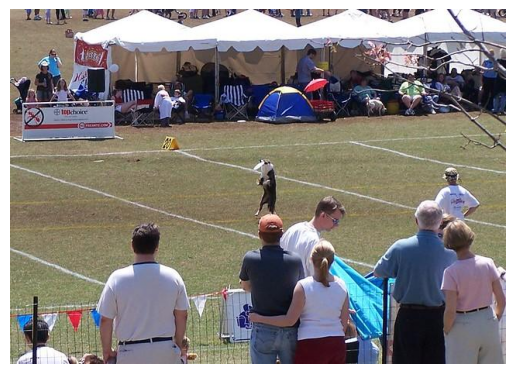



True
ground truth captions
Red fire hydrant sitting on the side of the road. 
A fire hydrant painted red next to a building.
A faded red fire hydrant on a sidewalk near a building.
A red fire hydrant on a city street.
a red fire hydrant that has seen better days
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!


generated caption

Limited caption generator: Orange hydrant with graffiti, red vase contents, and orange photo nearby. No flowers or nothing in the vase. Fire hydrant has graffiti on it. The item is unknown as it's not specified in the pairs.
(CIDEr score 0.00000) (Ref CIDEr score 0.00000)
(ROUGE_L score 0.38386) (Ref ROUGE_L score 0.38386)
(Bleu_1 score 0.31441) (Ref Bleu_1 score 0.31441)
(Bleu_2 score 0.31069) (Ref Bleu_1 score 0.31441)
(Bleu_3 score 0.26139) (Ref Bleu_1 score 0.31441)
(Bleu_4 score 0.21689) (Ref Bleu_1 score 0.31441)


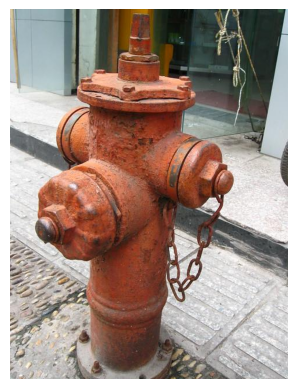



True
ground truth captions
a black kitten sits in a designer bag
A small kitten playing inside a women's purse
An adorable black kitten standing inside of a brown purse.
Small black kitten sitting inside a designer handbag.
a little back kitten standing in a designer purse
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!


generated caption

Based on the given information, the possible caption could be: "There is a black cat and a black dog in the scene. The cat is awake and looking at a camera while the dog has a brown collar."
(CIDEr score 0.00000) (Ref CIDEr score 0.00000)
(ROUGE_L score 0.41904) (Ref ROUGE_L score 0.41904)
(Bleu_1 score 0.38974) (Ref Bleu_1 score 0.38974)
(Bleu_2 score 0.34428) (Ref Bleu_1 score 0.38974)
(Bleu_3 score 0.26986) (Ref Bleu_1 score 0.38974)
(Bleu_4 score 0.20424) (Ref Bleu_1 score 0.38974)


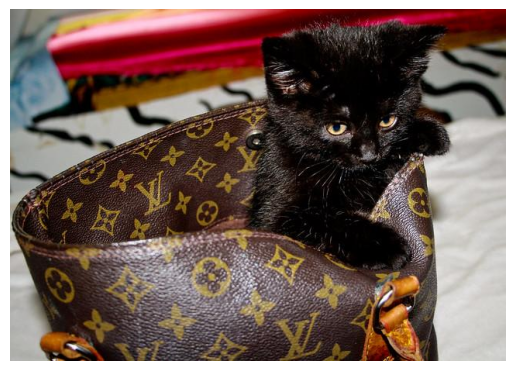



True
ground truth captions
A small child touches the trunk of an elephant standing behind an enclosure.
a small child neat to an elephant 
child placing food in an elephants trunk in enclousure
A kid is touching an elephant's trunk near a fence.
A young child who is touching the trunk of an elephant.
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!


generated caption

The elephants are at the zoo and can be touched with their trunks not touching food. They are outside, with no people present. The direction the elephant's trunk is pointing is down. These elephants are not in the wild.
(CIDEr score 0.00000) (Ref CIDEr score 0.00000)
(ROUGE_L score 0.47032) (Ref ROUGE_L score 0.47032)
(Bleu_1 score 0.38839) (Ref Bleu_1 score 0.38839)
(Bleu_2 score 0.38249) (Ref Bleu_1 score 0.38839)
(Bleu_3 score 0.33491) (Ref Bleu_1 score 0.38839)
(Bleu_4 score 0.28893) (Ref Bleu_1 score 0.38839)


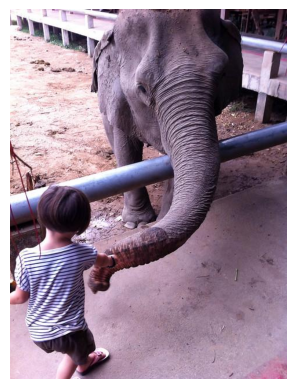



True
ground truth captions
An open market displaying fruit and many other varieties of food
There are people walking through an indoor market
An outdoor market with lots of fruits and vegetables.
A marked filled with fruits and vegetables and other items.
A covered food market has fruit and vegetables on display.
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!


generated caption

No lights, 4 people, no chef, no arrival, outside taken; Market station with limited scenery featuring a group of people. 

Generated caption: A market station with limited scenery featuring a group of people; no lights, no chef, no arrival, outside setting with no views.
(CIDEr score 0.00000) (Ref CIDEr score 0.00000)
(ROUGE_L score 0.35434) (Ref ROUGE_L score 0.35434)
(Bleu_1 score 0.31136) (Ref Bleu_1 score 0.31136)
(Bleu_2 score 0.30637) (Ref Bleu_1 score 0.31136)
(Bleu_3 score 0.23189) (Ref Bleu_1 score 0.31136)
(Bleu_4 score 0.17211) (Ref Bleu_1 score 0.31136)


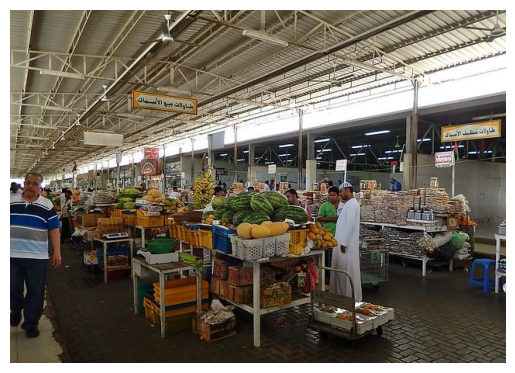



True
ground truth captions
A silver train passing under high beams and trees.
long passenger train coming down the train tracks
The train is running along on the tracks.
A train traveling across tracks next to a forest.
A large long train going down a track.
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!


generated caption

All trains are heading in the same direction, and it is not sunny; the vehicle is a train with a white face. It is daytime, and there are four tracks visible. The train is driving on tracks, and it is daytime. 

Generated caption: Train heading in same direction, not sunny, white faced, driving on tracks with 4 tracks visible, daytime.
(CIDEr score 0.00000) (Ref CIDEr score 0.00000)
(ROUGE_L score 0.28099) (Ref ROUGE_L score 0.28099)
(Bleu_1 score 0.21302) (Ref Bleu_1 score 0.21302)
(Bleu_2 score 0.22767) (Ref Bleu_1 score 0.21302)
(Bleu_3 score 0.19491) (Ref Bleu_1 score 0.21302)
(Bleu_4 score 0.16795) (Ref Bleu_1 score 0.2

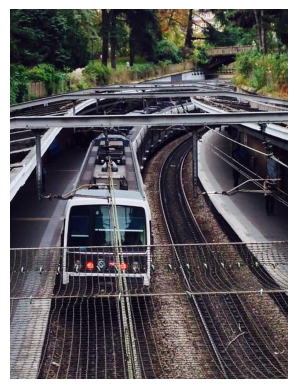



True
ground truth captions
Various exotic fruits adorn a wooden surface. 
Large group of apples sitting on top of a stone. 
An apple sitting next to a green plant.
a group of weird looking vegetables sitting on a table
A number of fruits and nuts on a stone
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!


generated caption

No fish, brown plate, healthy meal, mixed fruits, leaves as purple things, no vegetables, healthy meal.
(CIDEr score 0.00000) (Ref CIDEr score 0.00000)
(ROUGE_L score 0.51368) (Ref ROUGE_L score 0.51368)
(Bleu_1 score 0.58491) (Ref Bleu_1 score 0.58491)
(Bleu_2 score 0.46610) (Ref Bleu_1 score 0.58491)
(Bleu_3 score 0.36873) (Ref Bleu_1 score 0.58491)
(Bleu_4 score 0.30160) (Ref Bleu_1 score 0.58491)


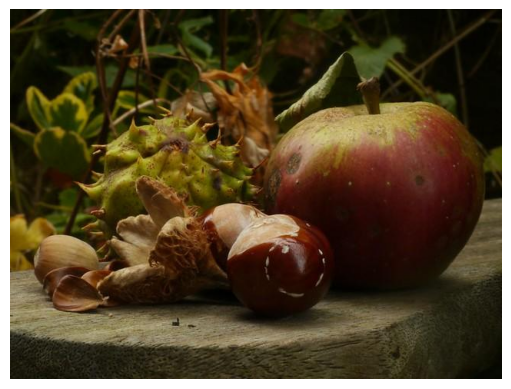



True
ground truth captions
A motorcycle parked in the middle of a roadway.
A motorcycle is parked on a road with grass on the side.
THERE IS A PARKED MOTORCYCLE IN THE STREET
A black and silver motorcycle parked in the road.
A nice touring motorcycle is parked on asphault
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!


generated caption

Caption: A single bicycle is parked on the road, not in motion, and owned by a man. The brand was made in the year 2000. There are no cars or helmets present. *No answer for the last two questions, as there is no context provided.*
(CIDEr score 0.00000) (Ref CIDEr score 0.00000)
(ROUGE_L score 0.40007) (Ref ROUGE_L score 0.40007)
(Bleu_1 score 0.31780) (Ref Bleu_1 score 0.31780)
(Bleu_2 score 0.31204) (Ref Bleu_1 score 0.31780)
(Bleu_3 score 0.28043) (Ref Bleu_1 score 0.31780)
(Bleu_4 score 0.24327) (Ref Bleu_1 score 0.31780)


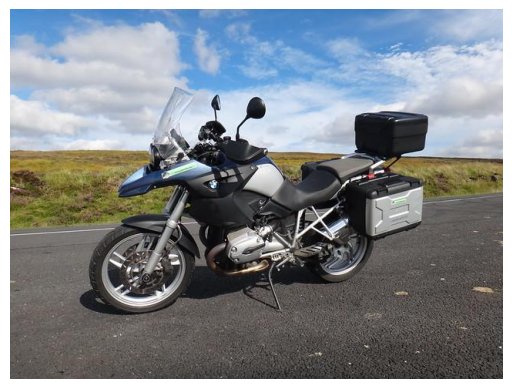



True
ground truth captions
a train on a train track with a sky background
Several train tracks and the train station with a train parked.
A red train with a yellow front is on the tracks.
A rusty red train is driving along the tracks
A red, yellow and gray train at a station
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!


generated caption

A passenger train during daytime with a red first train car. People are waiting to board the train.
(CIDEr score 0.00000) (Ref CIDEr score 0.00000)
(ROUGE_L score 0.61475) (Ref ROUGE_L score 0.61475)
(Bleu_1 score 0.69608) (Ref Bleu_1 score 0.69608)
(Bleu_2 score 0.63224) (Ref Bleu_1 score 0.69608)
(Bleu_3 score 0.52884) (Ref Bleu_1 score 0.69608)
(Bleu_4 score 0.45623) (Ref Bleu_1 score 0.69608)


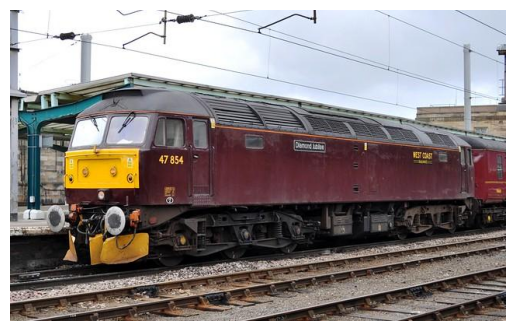



True
ground truth captions
A pile of lots of vegetables and produce.
A pile of carrots, squash and other root plants.
A pile of vegetables including carrots and squash.
A bunch of vegetables laying on plastic wrap.
Carrots and other vegetables dirty from the ground 
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!


generated caption

Brief description based on the information: The airline is Pink, the skies are clear, the plane is delivering cargo, and the day is clear with a large airplane delivering passengers. The type of airplane is a passenger jet, and it is not a cloudy day. 

Generated caption: Pink delivers cargo in clear skies on a large passenger airplane with a clear day.
(CIDEr score 0.00000) (Ref CIDEr score 0.00000)
(ROUGE_L score 0.25757) (Ref ROUGE_L score 0.25757)
(Bleu_1 score 0.19663) (Ref Bleu_1 score 0.19663)
(Bleu_2 score 0.19970) (Ref Bleu_1 score 0.19663)
(Bleu_3 score 0.15798) (Ref Bleu_1 score 0.19663)
(Bleu_4 score 0.11

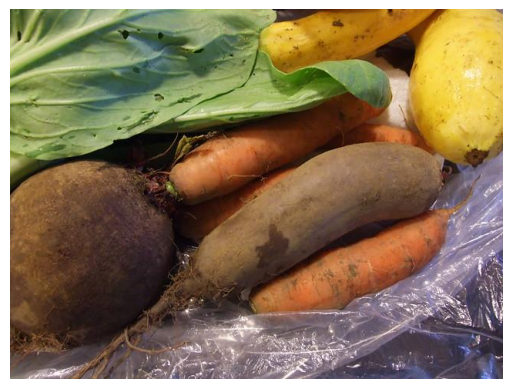



True
ground truth captions
A young boy carrying two skateboards across the street
Boy carrying two skateboards on an urban street.
A boy carrying two skateboards crosses the street.
Boy carrying two skateboards and a backpack on a city street
A man holding two skateboards standing in a parking lot.
Loading and preparing results...     
DONE (t=0.01s)
creating index...
index created!


generated caption

Skateboard bottom: white
Cars: 6
Sign: stop
Orange trees:
No rain
Red stoplight
No roller skating
Benches: 0
(CIDEr score 0.00000) (Ref CIDEr score 0.00000)
(ROUGE_L score 0.53337) (Ref ROUGE_L score 0.53337)
(Bleu_1 score 0.65766) (Ref Bleu_1 score 0.65766)
(Bleu_2 score 0.51869) (Ref Bleu_1 score 0.65766)
(Bleu_3 score 0.36684) (Ref Bleu_1 score 0.65766)
(Bleu_4 score 0.27214) (Ref Bleu_1 score 0.65766)


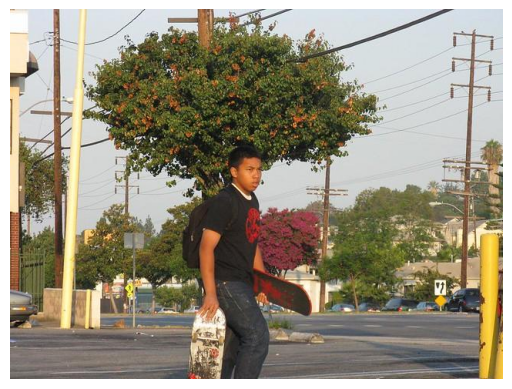

In [13]:
for i in range(len(evals[2].evalImgs)):    
    img = evals[2].evalImgs[i]
    img_ref = evals[2].evalImgs[i]
    
    print(img['image_id'] == img_ref['image_id'])
    
    # demo how to use evalImgs to retrieve low score result
    #evals = [eva for eva in cocoEval.evalImgs if eva['CIDEr']<30]
    print('ground truth captions')
    imgId = img['image_id']
    annIds = coco.getAnnIds(imgIds=imgId)
    anns = coco.loadAnns(annIds)
    coco.showAnns(anns)
    
    cocoRes = coco.loadRes(f"./results/captions_results_3.json")
    print('\n')
    print('generated caption')
    annIds = cocoRes.getAnnIds(imgIds=imgId)
    anns = cocoRes.loadAnns(annIds)
    coco.showAnns(anns)
    print('(CIDEr score %0.5f)'%(img['CIDEr']), '(Ref CIDEr score %0.5f)'%(img_ref['CIDEr']))
    print('(ROUGE_L score %0.5f)'%(img['ROUGE_L']), '(Ref ROUGE_L score %0.5f)'%(img_ref['ROUGE_L']))
    print('(Bleu_1 score %0.5f)'%(img['Bleu_1']), '(Ref Bleu_1 score %0.5f)'%(img_ref['Bleu_1']))
    print('(Bleu_2 score %0.5f)'%(img['Bleu_2']), '(Ref Bleu_1 score %0.5f)'%(img_ref['Bleu_1']))
    print('(Bleu_3 score %0.5f)'%(img['Bleu_3']), '(Ref Bleu_1 score %0.5f)'%(img_ref['Bleu_1']))
    print('(Bleu_4 score %0.5f)'%(img['Bleu_4']), '(Ref Bleu_1 score %0.5f)'%(img_ref['Bleu_1']))
    
    image_info = coco.loadImgs(imgId)[0]
    _id = image_info['id']
    image = Image.open(f'./images/{_id}.jpg')
    plt.imshow(image)
    plt.axis('off') 
    plt.show()    
    

    print('\n')
    

# Embedding comparison